In [118]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, f1_score
import seaborn as sns
import plotly.express as px
from collections import defaultdict
import time
from xgboost import XGBClassifier

In [114]:
data_500 = pd.read_csv("/Users/nirugidla/Documents/GitHub/milestone2_MADS/data_500k.csv", low_memory=False)
data_500.sample(5)

KeyboardInterrupt: 

In [126]:
data_500 = pd.read_csv("/Users/nirugidla/Documents/GitHub/milestone2_MADS/data_500k.csv", low_memory=False)
def clean_party_create_infer(corrected_data):
    #Replace blanks and spaces with NaN
    corrected_data.replace(r'^\s*$', np.nan, regex=True, inplace=True)

    # Update the 'I' values in PARTY_CODE to 'N' for rows where STATE is 'SD'
    corrected_data.loc[(corrected_data['STATE'] == 'SD') & (corrected_data['PARTY_CODE'] == 'I'), 'PARTY_CODE'] = 'N'

    # Update the 'U' values in PARTY_CODE to 'N' for rows where STATE is in ['DC', 'LA', 'RI']
    states_to_update = ['DC', 'LA', 'RI']
    corrected_data.loc[(corrected_data['STATE'].isin(states_to_update)) & (corrected_data['PARTY_CODE'] == 'U'), 'PARTY_CODE'] = 'N'

    # Update the 'I' values in PARTY_CODE to 'N' for rows where STATE is 'OK'
    corrected_data.loc[(corrected_data['STATE'] == 'OK') & (corrected_data['PARTY_CODE'] == 'I'), 'PARTY_CODE'] = 'N'
    
    print("N's after corrections")
    print(len(corrected_data.loc[corrected_data['PARTY_CODE'].isin(['N'])]))
    
    print("U's after corrections")
    print(len(corrected_data.loc[corrected_data['PARTY_CODE'].isin(['U'])]))
    
    print("inferred Rs:")
    print(len(corrected_data.loc[corrected_data['PARTY_CODE'].isin(['S'])]))

    print("inferred Ds:")
    print(len(corrected_data.loc[corrected_data['PARTY_CODE'].isin(['E'])]))

    # Define function to infer party based on given conditions
    def set_inferred_party(row):
        not_in_list = ['D', 'R', 'M', 'P', 'X', 'Z']
        rpx = ['R', 'P', 'X']
        dmz = ['D', 'M', 'Z']
        if row['PARTY_CODE'] not in ['D', 'R','E','S']:
            if (
               (row['FUND_POLIT'] == 'R' or row['DON_POLCONS'] or row['PRFL_HEALTHCARE_REFORM'] == '2' or
                row['PRFL_2NDAMEND'] == 'Y' or row['PRFL_CHOICELIFE'] == '1') and row['FUND_POLIT'] != 'D' and
                not row['DON_POLLIB'] and all(row[col] not in not_in_list for col in
                ['VTR_PRI' + "{:02}".format(i) for i in range(22, 2, -1)] + ['VTR_PPP' + "{:02}".format(i) for i in [20, 16, 12, 8, 4, 0]])
           ) or (
               sum(1 for col in ['VTR_PRI' + "{:02}".format(i) for i in range(22, 2, -1)] + ['VTR_PPP' + "{:02}".format(i) for i in [20, 16, 12, 8, 4, 0]]
                if row[col] in rpx) > sum(1 for col in ['VTR_PRI' + "{:02}".format(i) for i in range(22, 2, -1)] +
                ['VTR_PPP' + "{:02}".format(i) for i in [20, 16, 12, 8, 4, 0]] if row[col] in dmz)
           ):
                return 'S'
            elif (
               (row['FUND_POLIT'] == 'D' or row['DON_POLLIB'] or row['PRFL_HEALTHCARE_REFORM'] == '1' or
                row['PRFL_CHOICELIFE'] == '2') and row['FUND_POLIT'] != 'R' and not row['DON_POLCONS'] and
                all(row[col] not in not_in_list for col in ['VTR_PRI' + "{:02}".format(i) for i in range(22, 2, -1)] +
                ['VTR_PPP' + "{:02}".format(i) for i in [20, 16, 12, 8, 4, 0]])
           ) or (
               sum(1 for col in ['VTR_PRI' + "{:02}".format(i) for i in range(22, 2, -1)] + ['VTR_PPP' + "{:02}".format(i) for i in [20, 16, 12, 8, 4, 0]]
                if row[col] in rpx) < sum(1 for col in ['VTR_PRI' + "{:02}".format(i) for i in range(22, 2, -1)] +
                ['VTR_PPP' + "{:02}".format(i) for i in [20, 16, 12, 8, 4, 0]] if row[col] in dmz)
           ):
                return 'E'
        return row['PARTY_CODE']

    # Applying the function
    corrected_data['PARTY_CODE'] = corrected_data.apply(set_inferred_party, axis=1)
   
    print("new inferred Rs:")
    print(len(corrected_data.loc[corrected_data['PARTY_CODE'].isin(['S'])]))

    print("new inferred Ds:")
    print(len(corrected_data.loc[corrected_data['PARTY_CODE'].isin(['E'])]))
          

    # Create party_mapping using defaultdict.Lambda sets default (all other non-D and non-R party registrations to NaN.
    infer_party_mapping = defaultdict(lambda: float('nan'))
    infer_party_mapping.update({
        'D': 'D',  # Registered Democrats are mapped to Democrat
        'E': 'D',  # E (Inferred Democrats) are mapped to Democrat
        'R': 'R',  # Registered Republicans are mapped to Republican 
        'S': 'R'   # S (Inferred Republicans) are mapped to Republican
    })
    # Map PARTY_CODE to INFER_PARTY
    corrected_data['INFER_PARTY'] = corrected_data['PARTY_CODE'].map(infer_party_mapping)

    # Define the mapping for PARTY_CODE modifications
    party_code_mapping = {
        'E': float('nan'),
        'S': float('nan'),
        'U': float('nan'),
        'A': 'O',
        'B': 'O',
        'C': 'O',
        'F': 'O',
        'G': 'O',
        'H': 'O',
        'I': 'O',
        'J': 'O',
        'K': 'O',
        'L': 'L',
        'P': 'O',
        'Q': 'O',
        'T': 'O',
        'V': 'O',
        'W': 'O',
        'Y': 'O',
        'Z': 'O'
    }
    # Apply the mapping to the PARTY_CODE column
    corrected_data['PARTY_CODE'] = corrected_data['PARTY_CODE'].replace(party_code_mapping)

    print("Final PARTY_CODE values:")
    print(corrected_data['PARTY_CODE'].unique())
    print('Final INFER_PARTY values:')
    print(corrected_data['INFER_PARTY'].unique())
    print('INFER_PARTY Ds and Rs:')
    print(len(corrected_data.loc[corrected_data['INFER_PARTY'].isin(['D', 'R'])]))
    print('INFER_PARTY NaNs:')
    print(corrected_data['INFER_PARTY'].isna().sum())
    
    voter_columns = [col for col in corrected_data.columns if col.startswith("VTR")]

    #Create column with total number of votes in voter_columns per row
    #corrected_data['VTR_TOTAL_VOTES'] = corrected_data[voter_columns].notnull().sum(axis=1)

    #Sum Democrat and Republican totals
    corrected_data['VTR_TOTAL_DVOTES'] = corrected_data[voter_columns].isin(['D', 'M', 'Z']).sum(axis=1)
    corrected_data['VTR_TOTAL_RVOTES'] = corrected_data[voter_columns].isin(['R', 'P', 'X']).sum(axis=1)

    #Create conditions that evaluate whether someone has cast at least two more votes for Democrats or Republicans: 
    conditions = [
        corrected_data['VTR_TOTAL_DVOTES'] - corrected_data['VTR_TOTAL_RVOTES'] >= 2,
        corrected_data['VTR_TOTAL_RVOTES'] - corrected_data['VTR_TOTAL_DVOTES'] >= 2
    ]

    choices = ['D', 'R']

    corrected_data['VTR_INFER_PARTY'] = np.select(conditions, choices, default=np.nan)
    corrected_data['VTR_INFER_PARTY'].replace('nan', np.nan, inplace=True)

    # Assign a 'D' or an 'R' to INFER_PARTY if either condition is true:
    corrected_data.loc[(corrected_data['VTR_INFER_PARTY'] == 'D') , 'INFER_PARTY'] = 'D'
    corrected_data.loc[(corrected_data['VTR_INFER_PARTY'] == 'R') , 'INFER_PARTY'] = 'R'
    corrected_data.drop(columns=["VTR_INFER_PARTY", "VTR_TOTAL_DVOTES", "VTR_TOTAL_RVOTES"], inplace=True)
    
    print('Final INFER_PARTY Ds and Rs:')
    print(len(corrected_data.loc[corrected_data['INFER_PARTY'].isin(['D', 'R'])]))
    print('Final INFER_PARTY NaNs:')
    print(corrected_data['INFER_PARTY'].isna().sum())
    
    return corrected_data
engineered_data = clean_party_create_infer(data_500)

N's after corrections
75028
U's after corrections
69537
inferred Rs:
78296
inferred Ds:
71769
new inferred Rs:
81680
new inferred Ds:
76795


/var/folders/gh/j0bcgw097y7f7wy0j1r4m67c0000gp/T/ipykernel_21626/2050929447.py:77: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Final PARTY_CODE values:
['N' 'R' 'O' 'D' 'L' nan]
Final INFER_PARTY values:
[nan 'R' 'D']
INFER_PARTY Ds and Rs:
354058
INFER_PARTY NaNs:
145942


/var/folders/gh/j0bcgw097y7f7wy0j1r4m67c0000gp/T/ipykernel_21626/2050929447.py:120: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/gh/j0bcgw097y7f7wy0j1r4m67c0000gp/T/ipykernel_21626/2050929447.py:121: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/var/folders/gh/j0bcgw097y7f7wy0j1r4m67c0000gp/T/ipykernel_21626/2050929447.py:131: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using

Final INFER_PARTY Ds and Rs:
354080
Final INFER_PARTY NaNs:
145920


In [127]:
remove_columns = [
    'PRFL_LGBT_SUPPORT',
    'PRFL_LIBERAL_NEWS',
    'PRFL_MARIJUANA_REFORM',
    'PRFL_BIDEN_SUPPORT',
    'PRFL_BORDER_SECURITY',
    'PRFL_CONSERVATIVE_NEWS',
    'PRFL_IMMIGRATION_REFORM',
    'PRFL_OBAMA',
    'PRFL_PERSUADABLE_VOTER',
    'PRFL_POLITICAL_IDEOLOGY',
    'PRFL_SANDERS_SUPPORT',
    'PRFL_TRUMP_SUPPORT',
    'ZIP',
    
    'VTR_GEN00', 'VTR_GEN01', 'VTR_GEN02', 'VTR_GEN03', 'VTR_GEN04', 'VTR_GEN05', 'VTR_GEN06', 'VTR_GEN07', 'VTR_GEN08', 'VTR_GEN09', 'VTR_GEN10', 'VTR_GEN11', 'VTR_GEN12', 'VTR_GEN13', 'VTR_GEN14', 'VTR_GEN15', 'VTR_GEN16', 'VTR_GEN17', 'VTR_GEN18', 'VTR_GEN19', 'VTR_GEN20', 'VTR_GEN21', 'VTR_GEN22', 'VTR_OTH00', 'VTR_OTH01', 'VTR_OTH02', 'VTR_OTH03', 'VTR_OTH04', 'VTR_OTH05', 'VTR_OTH06', 'VTR_OTH07', 'VTR_OTH08', 'VTR_OTH09', 'VTR_OTH10', 'VTR_OTH11', 'VTR_OTH12', 'VTR_OTH13', 'VTR_OTH14', 'VTR_OTH15', 'VTR_OTH16', 'VTR_OTH17', 'VTR_OTH18', 'VTR_OTH19', 'VTR_OTH20', 'VTR_OTH21', 'VTR_OTH22', 'VTR_PPP00', 'VTR_PPP04', 'VTR_PPP08', 'VTR_PPP12', 'VTR_PPP16', 'VTR_PPP20', 'VTR_PRI00', 'VTR_PRI01', 'VTR_PRI02', 'VTR_PRI03', 'VTR_PRI04', 'VTR_PRI05', 'VTR_PRI06', 'VTR_PRI07', 'VTR_PRI08', 'VTR_PRI09', 'VTR_PRI10', 'VTR_PRI11', 'VTR_PRI12', 'VTR_PRI13', 'VTR_PRI14', 'VTR_PRI15', 'VTR_PRI16', 'VTR_PRI17', 'VTR_PRI18', 'VTR_PRI19', 'VTR_PRI20', 'VTR_PRI21', 'VTR_PRI22',
    
      'PRFL_CHOICELIFE', "PRFL_GUN_CONTROL",'PRFL_MARRIAGE_EQUALITY', 'PRFL_TEAPARTY',
    'VP_PPP', "AI_COUNTY_NAME", 'PRFL_CLINTON_SUPPORT',
    'AGE', 'CNSUS_PCTW', 'PARTY_MIX', 'PRFL_MINWAGE', 'PRFL_FENCE_SITTER', "RECORD_ID", 'CNSUS_PCTA',
    'PRFL_BLM_SUPPORT', 'PRFL_METOO_SUPPORT', 'PRFL_HEALTHCARE_REFORM','DON_POLLIB', 'PRFL_2NDAMEND', 'FUND_POLIT', 'DON_POLCONS', 
    
   
]
# Drop the list of columns from the dataset
engineered_data.drop(columns=remove_columns, errors='ignore', inplace=True)

In [113]:
# # Data Loading
# #data_500 = pd.read_csv("/Users/nirugidla/Documents/GitHub/milestone2_MADS/data_500k.csv", low_memory=False)
# 
# # Data Cleaning - Column Names
# data_500.columns = data_500.columns.str.strip()
# 
# # Data Cleaning - Drop ZIP
# #data_500.drop('ZIP', axis=1, inplace=True)
# # Drop the list of columns from the dataset
# data_500_cleaned = data_500.drop(columns=remove_columns, errors='ignore')
# 
# # Data Cleaning - Drop Duplicates
# data_500.drop_duplicates(inplace=True)
# 
# # Data Cleaning - Object Columns
# for col in data_500.columns:
#     if data_500[col].dtype == 'object':
#         data_500[col] = data_500[col].str.strip()
# 
# # Data Cleaning - Empty Strings
# data_500.replace('', 'Unknown', inplace=True)
# 
# # Data Cleaning - NaN for Object Types
# data_500.loc[:, data_500.dtypes == 'object'] = data_500.loc[:, data_500.dtypes == 'object'].fillna('Unknown')
# 
# # Data Cleaning - Drop Columns and Rows with All NaNs
# data_500.dropna(axis=1, how='all', inplace=True)
# data_500.dropna(axis=0, how='all', inplace=True)
# 
# # Identify numeric and non-numeric columns
# numeric_cols = data_500.select_dtypes(include=['int64', 'float64']).columns
# non_numeric_cols = data_500.select_dtypes(exclude=['int64', 'float64']).columns
# 
# # Data Cleaning - Removing Non-Numeric Columns with More Than 90% Missing Data
# missing_data_percentage = data_500.isnull().mean() * 100
# non_numeric_cols_to_remove = missing_data_percentage[non_numeric_cols]
# non_numeric_cols_to_remove = non_numeric_cols_to_remove[non_numeric_cols_to_remove > 90].index.tolist()
# data_500_reduced = data_500.drop(columns=non_numeric_cols_to_remove)
# 
# # Update the list of non-numeric columns after removal
# non_numeric_cols = data_500_reduced.select_dtypes(exclude=['int64', 'float64']).columns
# 
# # Identifying Specific Types of Non-Numeric Columns
# cols_with_Y_or_Unknown = [col for col in non_numeric_cols if set(data_500_reduced[col].unique()) <= {'Y', 'Unknown'}]
# cols_with_more_than_two_categories = [col for col in non_numeric_cols if len(data_500_reduced[col].unique()) > 2]
# 
# # Print identified columns
# print("Columns with 'Y' or 'Unknown':", cols_with_Y_or_Unknown, len(cols_with_Y_or_Unknown))
# print("Columns with more than two categories:", cols_with_more_than_two_categories, len(cols_with_more_than_two_categories))

KeyboardInterrupt: 

In [108]:
# # Load the dataset again
# #data = pd.read_csv('data/surveydata.csv')
# 
# corrected_data = data_500_reduced.copy()
# 
# # Update the 'I' values in PARTY_CODE to 'N' for rows where STATE is 'SD'
# corrected_data.loc[(corrected_data['STATE'] == 'SD') & (corrected_data['PARTY_CODE'] == 'I'), 'PARTY_CODE'] = 'N'
# 
# # Update the 'U' values in PARTY_CODE to 'N' for rows where STATE is in ['DC', 'LA', 'RI']
# states_to_update = ['DC', 'LA', 'RI']
# corrected_data.loc[(corrected_data['STATE'].isin(states_to_update)) & (corrected_data['PARTY_CODE'] == 'U'), 'PARTY_CODE'] = 'N'
# 
# # Update the 'I' values in PARTY_CODE to 'N' for rows where STATE is 'OK'
# corrected_data.loc[(corrected_data['STATE'] == 'OK') & (corrected_data['PARTY_CODE'] == 'I'), 'PARTY_CODE'] = 'N'
# 
# 
# #categorical_columns
# # Create a mapping dictionary for PARTY_CODE to INFER_PARTY values
# party_mapping = {
#     'D': 'D',
#     'E': 'D',
#     'R': 'R',
#     'S': 'R',
#     'N': float('nan'),
#     'U': float('nan'),
#     'A': float('nan'),
#     'B': float('nan'),
#     'C': float('nan'),
#     'F': float('nan'),
#     'G': float('nan'),
#     'H': float('nan'),
#     'I': float('nan'),
#     'J': float('nan'),
#     'K': float('nan'),
#     'L': float('nan'),
#     'P': float('nan'),
#     'Q': float('nan'),
#     'T': float('nan'),
#     'V': float('nan'),
#     'W': float('nan'),
#     'Y': float('nan'),
#     'Z': float('nan'),
#     'O': float('nan'),
# }
# 
# # Create the INFER_PARTY column using the mapping
# corrected_data['INFER_PARTY'] = corrected_data['PARTY_CODE'].map(party_mapping)
# 
# print(corrected_data['PARTY_CODE'].unique())
# 
# 
# # Display the unique values in the INFER_PARTY column to ensure correctness
# unique_infer_party = corrected_data['INFER_PARTY'].unique()
# 
# print('unique_infer_party:')
# 
# print(unique_infer_party)
# 
# # Define the mapping for PARTY_CODE modifications
# party_code_mapping = {
#     'E': float('nan'),
#     'S': float('nan'),
#     'U': float('nan'),
#     'A': 'O',
#     'B': 'O',
#     'C': 'O',
#     'F': 'O',
#     'G': 'O',
#     'H': 'O',
#     'I': 'O',
#     'J': 'O',
#     'K': 'O',
#     'L': 'L',
#     'P': 'O',
#     'Q': 'O',
#     'T': 'O',
#     'V': 'O',
#     'W': 'O',
#     'Y': 'O',
#     'Z': 'O'
# }
# 
# # Apply the mapping to the PARTY_CODE column
# corrected_data['PARTY_CODE'] = corrected_data['PARTY_CODE'].replace(party_code_mapping)
# 
# # Check the unique values of PARTY_CODE after the modifications
# unique_party_code_after_modifications = corrected_data['PARTY_CODE'].unique()
# 
# print("unique_party_code_after_modifications:")
# 
# print(unique_party_code_after_modifications)

['N' 'R' 'O' 'D' 'A' 'F' 'P' 'G' 'L' 'U' 'W' 'B' 'I' 'Y' 'V' 'H' 'Unknown'
 'S' 'E' 'Q' 'Z']
unique_infer_party:
[nan 'R' 'D']
unique_party_code_after_modifications:
['N' 'R' 'O' 'D' 'L' nan 'Unknown']


In [109]:
# engineered_data = corrected_data.copy()
# voter_columns = [col for col in engineered_data.columns if col.startswith("VTR")]
# #Create column with total number of votes in voter_columns per row
# engineered_data['VTR_TOTAL_VOTES'] = engineered_data[voter_columns].notnull().sum(axis=1)
# #Sum Democrat and Republican totals
# engineered_data['VTR_TOTAL_DVOTES'] = engineered_data[voter_columns].isin(['D', 'M', 'Z']).sum(axis=1)
# engineered_data['VTR_TOTAL_RVOTES'] = engineered_data[voter_columns].isin(['R', 'P', 'X']).sum(axis=1)
# #Create conditions that evaluate whether more votes have been cast for Democrats or Republicans, and assign 'D' and 'R' to new column based on conditions
# conditions = [
#     engineered_data['VTR_TOTAL_DVOTES'] > engineered_data['VTR_TOTAL_RVOTES'],
#     engineered_data['VTR_TOTAL_DVOTES'] < engineered_data['VTR_TOTAL_RVOTES']
# ]
# choices = ['D', 'R']
# engineered_data['VTR_INFER_PARTY'] = np.select(conditions, choices, default=np.nan)
# #Create conditions that evaluate whether a voter is a swing voter or not
# conditions_swing = [
#     (engineered_data['VTR_TOTAL_DVOTES'] > 2) & (engineered_data['VTR_TOTAL_RVOTES'] > 2),
#     ((engineered_data['VTR_TOTAL_DVOTES'] > 1) & (engineered_data['VTR_TOTAL_RVOTES'] == 0)) | ((engineered_data['VTR_TOTAL_RVOTES'] > 1) & (engineered_data['VTR_TOTAL_DVOTES'] == 0))
# ]
# choices_swing = ['Y', 'N']
# engineered_data['VTR_INFER_SWING'] = np.select(conditions_swing, choices_swing, default=np.nan)
# #sampledf = engineered_data[['PARTY_CODE','INFER_PARTY','VTR_TOTAL_DVOTES','VTR_TOTAL_RVOTES','VTR_INFER_PARTY','VTR_INFER_SWING']]
# #print(sampledf.head(50))
# #Add values to INFER_PARTY and correct any other INFER_PARTY values that don't meet the conditions above:
# print(sum(engineered_data['INFER_PARTY'].isna())) #291 NaNs for INFER_PARTY before
# engineered_data.loc[(engineered_data['VTR_INFER_PARTY'] == 'D') & (engineered_data['VTR_INFER_SWING'] == 'N'), 'INFER_PARTY'] = 'D'
# engineered_data.loc[(engineered_data['VTR_INFER_PARTY'] == 'R') & (engineered_data['VTR_INFER_SWING'] == 'N'), 'INFER_PARTY'] = 'R'
# engineered_data.loc[(engineered_data['VTR_INFER_PARTY'] == 'D') & (engineered_data['VTR_INFER_SWING'] == 'Y'), 'INFER_PARTY'] =  float('nan')
# engineered_data.loc[(engineered_data['VTR_INFER_PARTY'] == 'R') & (engineered_data['VTR_INFER_SWING'] == 'Y'), 'INFER_PARTY'] =  float('nan')
# #Also delete any 'D' or 'R' INFER_PARTY labels for anyone deemed a "swing voter" based on criteria above of voting for both parties at least 3 times each:
# engineered_data.loc[(engineered_data['VTR_INFER_SWING'] == 'Y') , 'INFER_PARTY'] = float('nan')
# print(sum(engineered_data['INFER_PARTY'].isna())) #291 NaNs for INFER_PARTY before
# #Drop auxiliary columns used for math, keeping 'VTR_TOTAL_VOTES', 'VTR_INFER_SWING', and the updated 'INFER_PARTY' columns as features:
# engineered_data = engineered_data.drop(columns=['VTR_TOTAL_DVOTES','VTR_TOTAL_RVOTES','VTR_INFER_PARTY'])
# # Drop the list of columns from the dataset
# #engineered_data_cleaned = engineered_data.drop(columns=remove_columns, errors='ignore')
# 
# # features_to_remove = [
# #     'PRFL_CHOICELIFE', 'TOD_PRES_D_2016_PREC', 'TOD_PRES_O_2016',
# #     'TOD_PRES_R_2016', 'TOD_PRES_R_2016_PREC', 'TOD_PRES_R_2020_PREC', 'VP_PPP',
# #     'AGE', 'CNSUS_PCTW'
# # ]
# # # Assuming 'engineered_data' is your DataFrame, remove the less important features
# # engineered_data = engineered_data.drop(columns=features_to_remove, errors='ignore')


154274
154274


In [110]:
print(len(engineered_data.columns))

189


In [ ]:
engineered_data = corrected_data.copy()
tod_pres_diff_cols = [col for col in engineered_data.columns if col.startswith('TOD_PRES_DIFF')]
# Convert 'TIE' values to 0 for all 'TOD_PRES_DIFF' columns
engineered_data[tod_pres_diff_cols] = engineered_data[tod_pres_diff_cols].replace('TIE', 0)
# Apply the transformation to each of the 'TOD_PRES_DIFF' columns
for col in tod_pres_diff_cols:
    # Skip if the column has already been converted (e.g. TOD_PRES_DIFF_2016)
    if engineered_data[col].dtype != 'object':
        continue
    # Strip any whitespace
    stripped_col = engineered_data[col].str.strip()
    # Extract numerical margin and party character
    margin_num = engineered_data[col].str[:-1].astype(float)
    party_char = engineered_data[col].str[-1]
    # Create the signed margin column
    signed_margin = margin_num.where(party_char == 'D', -margin_num)  # Positive for D, negative for R
    engineered_data[col] = signed_margin
# Display the first few rows of the transformed columns to verify the transformation
engineered_data[tod_pres_diff_cols].head()

In [128]:
@timer_decorator
def run_xgboost_all_columns(data, sample_size=150000, num_runs=1, top_N_features=50):
    results_list = []

    for run in range(1, num_runs + 1):
        print(f"Starting run {run}...")
        
        data_with_all_columns = data.copy()
        data_with_all_columns = data_with_all_columns[data_with_all_columns['INFER_PARTY'].notna()]
        
        if 'PARTY_CODE' in data_with_all_columns.columns:
            data_with_all_columns.drop('PARTY_CODE', axis=1, inplace=True)
        
        print("Number of columns in the dataset:", len(data_with_all_columns.columns))

        data_sample = data_with_all_columns.sample(n=sample_size, random_state=42)
        
        le = LabelEncoder()
        data_sample['INFER_PARTY'] = le.fit_transform(data_sample['INFER_PARTY'].astype(str))
        
        non_numeric_cols = data_sample.select_dtypes(exclude=['int64', 'float64']).columns.difference(['INFER_PARTY'])
        
        data_one_hot = pd.get_dummies(data_sample, columns=non_numeric_cols, drop_first=True)

        X = data_one_hot.drop('INFER_PARTY', axis=1)
        y = data_one_hot['INFER_PARTY']

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
        
        # Replacing unsupported characters in feature names
        X_train.columns = X_train.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        X_test.columns = X_test.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        
        xgb = XGBClassifier(objective='multi:softmax', num_class=len(np.unique(y_train)), random_state=42)
        xgb.fit(X_train, y_train)
        
        y_pred = xgb.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred, average='weighted')

        print(f"Run {run} - Baseline Metrics: Accuracy: {accuracy}, F1 Score: {f1}")

        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        top_features = X.columns[sorted_idx].tolist()
        print(top_features)
        
        # Re-train and evaluate the model using top 50 features
        X_train_top_50 = X_train[top_features]
        X_test_top_50 = X_test[top_features]
        
        xgb_top_50 = XGBClassifier(objective='multi:softmax', num_class=len(np.unique(y_train)), random_state=42)
        xgb_top_50.fit(X_train_top_50, y_train)
        
        y_pred_top_50 = xgb_top_50.predict(X_test_top_50)
        accuracy_top_50 = accuracy_score(y_test, y_pred_top_50)
        f1_top_50 = f1_score(y_test, y_pred_top_50, average='weighted')

        print(f"Run {run} - Model performance with top 50 features:")
        print(f"Accuracy: {accuracy_top_50}")
        print(f"F1 Score: {f1_top_50}")

        results_list.append({
            'Run': run,
            'Accuracy': accuracy,
            'F1_Score': f1,
            'Accuracy_Top_50': accuracy_top_50,
            'F1_Score_Top_50': f1_top_50,
            'Top_N_Features': top_features
        })

    result_df = pd.DataFrame(results_list)
    return result_df

# Assuming engineered_data is already defined
result = run_xgboost_all_columns(engineered_data, sample_size=250000, num_runs=1, top_N_features=50)
result

Starting run 1...
Number of columns in the dataset: 189
Run 1 - Baseline Metrics: Accuracy: 0.74774, F1 Score: 0.7479639585407512
['TOD_PRES_D_2016_PREC', 'ETHNIC_INFER_C', 'ETHNIC_INFER_B', 'TOD_PRES_R_2016_PREC', 'GENDER_MIX_2', 'COUNTY_ST_163', 'CENSUS_ST_21', 'TOD_PRES_DIFF_2016_30D', 'CENSUS_ST_13', 'GENDER_MIX_4', 'CENSUS_ST_55', 'CENSUS_ST_15', 'COUNTY_ST_099', 'TOD_PRES_D_2020_PREC', 'CENSUS_ST_25', 'CENSUS_ST_42', 'CENSUS_ST_06', 'ETHNICGRP_Y', 'STATE_AL', 'TOD_PRES_D_2016', 'CENSUS_ST_45', 'CONG_DIST_03', 'SEX_M', 'COUNTY_ST_086', 'ETHNIC_INFER_H', 'CONG_DIST_07', 'HH_SIZE_6', 'COUNTY_ST_079', 'CENSUS_ST_17', 'TOD_PRES_DIFF_2016_38D', 'TOD_PRES_R_2016', 'CENSUS_ST_36', 'CENSUS_ST_12', 'TOD_PRES_DIFF_2016_30R', 'CONG_DIST_1 ', 'RELIGION_I', 'CENSUS_ST_27', 'ETHNICCODE_HM', 'TOD_PRES_R_2020_PREC', 'ETHNICCODE_WL', 'CENSUS_ST_26', 'TOD_PRES_DIFF_2016_17D', 'GENERATION_M', 'GENERATION_Z', 'CENSUS_ST_51', 'CENSUS_ST_29', 'CENSUS_ST_48', 'CENSUS_ST_54', 'LANGUAGE_S8', 'NETWORTH_I']

,Run,Accuracy,F1_Score,Accuracy_Top_50,F1_Score_Top_50,Top_N_Features
0,1,0.74774,0.747964,0.74394,0.744168,"[TOD_PRES_D_2016_PREC, ETHNIC_INFER_C, ETHNIC_..."


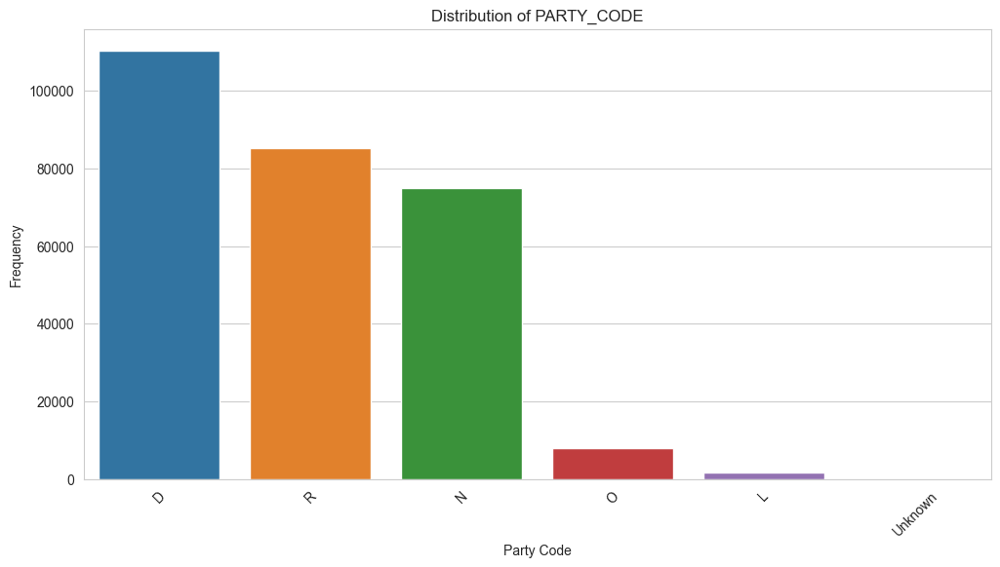

Counts for each category in PARTY_CODE:
PARTY_CODE
D          110355
R           85216
N           75014
O            8121
L            1621
Unknown        45
Name: count, dtype: int64


In [101]:
# Generate a bar plot for 'PARTY_CODE'
plt.figure(figsize=(12, 6))
sns.countplot(data=engineered_data, x='PARTY_CODE', order=engineered_data['PARTY_CODE'].value_counts().index)
plt.title('Distribution of PARTY_CODE')
plt.xlabel('Party Code')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

# Display statistics
party_code_counts = engineered_data['PARTY_CODE'].value_counts()
print("Counts for each category in PARTY_CODE:")
print(party_code_counts)

In [102]:
def timer_decorator(func):
    def wrapper(*args, **kwargs):
        start_time = time.time()
        result = func(*args, **kwargs)
        end_time = time.time()
        print(f"Function {func.__name__} took {(end_time - start_time):.2f} seconds to run.")
        return result
    return wrapper

In [87]:
@timer_decorator
def run_xgboost_all_columns(data, sample_size=100000, num_runs=1, top_N_features=10):
    results_list = []

    for run in range(1, num_runs + 1):
        print(f"Starting run {run}...")
        
        # Use all available columns except the target column 'PARTY_CODE'
        data_with_all_columns = data.copy()
        data_with_all_columns = data_with_all_columns[data_with_all_columns['PARTY_CODE'].notna()]
        
        if 'INFER_PARTY' in data_with_all_columns.columns:
            data_with_all_columns.drop('INFER_PARTY', axis=1, inplace=True)


        print("number of columns in the dataset", len(data_with_all_columns.columns))
        data_sample = data_with_all_columns.sample(n=sample_size, random_state=42)
        
        class_counts = data_sample['PARTY_CODE'].value_counts()
        valid_classes = class_counts[class_counts >= 2].index.tolist()
        data_sample = data_sample[data_sample['PARTY_CODE'].isin(valid_classes)]
        
        le = LabelEncoder()
        data_sample['PARTY_CODE'] = le.fit_transform(data_sample['PARTY_CODE'].astype(str))
        
        # Identify numeric and non-numeric columns
        numeric_cols = data_sample.select_dtypes(include=['int64', 'float64']).columns.difference(['PARTY_CODE'])
        non_numeric_cols = data_sample.select_dtypes(exclude=['int64', 'float64']).columns.difference(['PARTY_CODE'])
        
        # One-hot encode non-numeric columns
        data_one_hot = pd.get_dummies(data_sample, columns=non_numeric_cols, drop_first=True)
        
        X = data_one_hot.drop('PARTY_CODE', axis=1)
        y = data_one_hot['PARTY_CODE']
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
        
        # Handle special characters in column names that XGBoost doesn't like
        X_train.columns = X_train.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        X_test.columns = X_test.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        
        xgb = XGBClassifier(objective='multi:softmax', random_state=42)
        xgb.fit(X_train, y_train)
        
        # Print feature importances
        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        print("Top 10 Important Features and Their Importances for Run {}: ".format(run))
        for index in sorted_idx:
            print(f"{X_train.columns[index]}: {feature_importances[index]}")


        y_pred = xgb.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred, average=None)
        recall = recall_score(y_test, y_pred, average=None)

        print(f"Run {run} - Accuracy: {accuracy}, F1 Score: {f1}, Recall: {recall}")

        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        top_features = X.columns[sorted_idx].tolist()

        results_list.append({
            'Run': run,
            'Accuracy': accuracy,
            'F1_Score': f1,
            'Recall': recall,
            'Top_N_Features': top_features
        })

    results_df = pd.DataFrame(results_list)
    
    return results_df

# Assuming engineered_data is already defined
result = run_xgboost_all_columns(engineered_data, sample_size=250000, num_runs=1, top_N_features=10)
result

Starting run 1...
number of columns in the dataset 191


Exception ignored on calling ctypes callback function: <bound method DataIter._next_wrapper of <xgboost.data.SingleBatchInternalIter object at 0x30e342bf0>>
Traceback (most recent call last):
  File "/Users/nirugidla/Library/Python/3.10/lib/python/site-packages/xgboost/core.py", line 640, in _next_wrapper
    return self._handle_exception(lambda: self.next(input_data), 0)
  File "/Users/nirugidla/Library/Python/3.10/lib/python/site-packages/xgboost/core.py", line 556, in _handle_exception
    return fn()
  File "/Users/nirugidla/Library/Python/3.10/lib/python/site-packages/xgboost/core.py", line 640, in <lambda>
    return self._handle_exception(lambda: self.next(input_data), 0)
  File "/Users/nirugidla/Library/Python/3.10/lib/python/site-packages/xgboost/data.py", line 1260, in next
    input_data(**self.kwargs)
  File "/Users/nirugidla/Library/Python/3.10/lib/python/site-packages/xgboost/core.py", line 729, in inner_f
    return func(**kwargs)
  File "/Users/nirugidla/Library/Python/

XGBoostError: [22:50:20] /Users/runner/work/xgboost/xgboost/src/data/proxy_dmatrix.h:158: Unknown type: v
Stack trace:
  [bt] (0) 1   libxgboost.dylib                    0x00000001670051e8 dmlc::LogMessageFatal::~LogMessageFatal() + 124
  [bt] (1) 2   libxgboost.dylib                    0x00000001670f903c xgboost::data::IterativeDMatrix::InitFromCPU(xgboost::Context const*, xgboost::BatchParam const&, void*, float, std::__1::shared_ptr<xgboost::DMatrix>)::$_1::operator()() const + 984
  [bt] (2) 3   libxgboost.dylib                    0x00000001670f5144 xgboost::data::IterativeDMatrix::InitFromCPU(xgboost::Context const*, xgboost::BatchParam const&, void*, float, std::__1::shared_ptr<xgboost::DMatrix>) + 428
  [bt] (3) 4   libxgboost.dylib                    0x00000001670f4940 xgboost::data::IterativeDMatrix::IterativeDMatrix(void*, void*, std::__1::shared_ptr<xgboost::DMatrix>, void (*)(void*), int (*)(void*), float, int, int) + 1072
  [bt] (4) 5   libxgboost.dylib                    0x00000001670b2a88 xgboost::DMatrix* xgboost::DMatrix::Create<void*, void*, void (void*), int (void*)>(void*, void*, std::__1::shared_ptr<xgboost::DMatrix>, void (*)(void*), int (*)(void*), float, int, int) + 140
  [bt] (5) 6   libxgboost.dylib                    0x000000016700ed00 XGQuantileDMatrixCreateFromCallback + 516
  [bt] (6) 7   libffi.dylib                        0x0000000196807050 ffi_call_SYSV + 80
  [bt] (7) 8   libffi.dylib                        0x000000019680fadc ffi_call_int + 1208
  [bt] (8) 9   _ctypes.cpython-310-darwin.so       0x0000000103530350 _ctypes_callproc + 1396



In [80]:
result['Top_N_Features']

0    [ETHNIC_INFER_C, CENSUS_ST_25, ETHNIC_INFER_B,...
Name: Top_N_Features, dtype: object

In [ ]:
@timer_decorator
def run_xgboost_all_columns(data, sample_size=10000, num_runs=1, top_N_features=10):
    results_list = []
    all_features = [col for col in data.columns if col != 'INFER_PARTY']
    
    for exclude_feature in all_features:
        for run in range(1, num_runs + 1):
            data_with_all_columns = data.copy()
            data_with_all_columns = data_with_all_columns[data_with_all_columns['INFER_PARTY'].notna()]
            if 'PARTY_CODE' in data_with_all_columns.columns:
                data_with_all_columns.drop('PARTY_CODE', axis=1, inplace=True)
            
            data_sample = data_with_all_columns.sample(n=sample_size, random_state=42)
            
            class_counts = data_sample['INFER_PARTY'].value_counts()
            valid_classes = class_counts[class_counts >= 2].index.tolist()
            data_sample = data_sample[data_sample['INFER_PARTY'].isin(valid_classes)]
            
            le = LabelEncoder()
            data_sample['INFER_PARTY'] = le.fit_transform(data_sample['INFER_PARTY'].astype(str))
            
            if len(data_sample['INFER_PARTY'].unique()) < 2:
                continue
            
            numeric_cols = data_sample.select_dtypes(include=['int64', 'float64']).columns.difference(['INFER_PARTY'])
            non_numeric_cols = data_sample.select_dtypes(exclude=['int64', 'float64']).columns.difference(['INFER_PARTY'])
            
            data_one_hot = pd.get_dummies(data_sample[non_numeric_cols], drop_first=True)
            
            final_data = pd.concat([data_one_hot, data_sample[numeric_cols], data_sample['INFER_PARTY']], axis=1)
            
            # Remove unsupported characters in feature names
            final_data.columns = final_data.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
            
            final_data = final_data.drop(columns=[exclude_feature], errors='ignore')

            X = final_data.drop('INFER_PARTY', axis=1)
            y = final_data['INFER_PARTY']
            
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
            
            xgb = XGBClassifier(objective='multi:softmax', num_class=len(valid_classes), random_state=42)
            xgb.fit(X_train, y_train)
            
            y_pred = xgb.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)

            feature_importances = xgb.feature_importances_
            sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
            top_features = X.columns[sorted_idx].tolist()

            results_list.append({
                'Run': run,
                'Excluded_Feature': exclude_feature,
                'Accuracy': accuracy,
                'F1_Score': f1,
                'Recall': recall,
                'Top_N_Features': top_features
            })

    result_ablation = pd.DataFrame(results_list)
    return result_ablation

# Assuming engineered_data is already defined
result_ablation_infer_party = run_xgboost_all_columns(engineered_data, sample_size=10000, num_runs=1, top_N_features=20)

In [ ]:
result_ablation_infer_party

In [ ]:
result_ablation_infer_party.to_csv('/Users/nirugidla/Documents/GitHub/milestone2_MADS/result_ablation_infer_party_df.csv', index=False)

In [ ]:
# Step 2: Read the CSV file
result_ablation_infer_party = pd.read_csv('/Users/nirugidla/Documents/GitHub/milestone2_MADS/result_ablation_infer_party_df.csv')

# Step 3: Visualize
# Plotting Accuracy
fig = px.line(result_ablation_infer_party, x='Excluded_Feature', y='Accuracy', title='Accuracy vs Excluded Feature')
fig.show()

# Plotting F1 Score
fig = px.line(result_ablation_infer_party, x='Excluded_Feature', y='F1_Score', title='F1 Score vs Excluded Feature')
fig.show()

# Plotting Recall
fig = px.line(result_ablation_infer_party, x='Excluded_Feature', y='Recall', title='Recall vs Excluded Feature')
fig.show()

In [48]:
# Step 1: Get the baseline metrics
# baseline_accuracy = 0.9329
# baseline_f1_score = 0.9205910012701286
# baseline_recall = 0.9329
baseline_accuracy = 0.7746333333333333
baseline_f1_score = 0.7655605256770346
baseline_recall = 0.777394366197183

# baseline_accuracy = 0.86
# baseline_f1_score = 0.86
# baseline_recall = 0.86

# Define a threshold for acceptable performance drop. For example, 1% drop.
threshold = 0.0055

# Step 2 and 3: Identify features that can be removed
features_to_remove = []

for _, row in result_ablation_infer_party.iterrows():
    if abs(row['Accuracy'] - baseline_accuracy) <= threshold and \
       abs(row['F1_Score'] - baseline_f1_score) <= threshold and \
       abs(row['Recall'] - baseline_recall) <= threshold:
        features_to_remove.append(row['Excluded_Feature'])

# Remove duplicates if any
features_to_remove = list(set(features_to_remove))

# Now features_to_remove contains the list of features that can be safely removed
print("Features to remove:", features_to_remove)
print("Number Features to remove:", len(features_to_remove))

Features to remove: []
Number Features to remove: 0


In [59]:
result_ablation_infer_party

,Run,Excluded_Feature,Accuracy,F1_Score,Recall,Top_N_Features
0,1,ADD_TYPE,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
1,1,AFAMPROFLS,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
2,1,AI_COUNTY_NAME,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
3,1,AIRCOND,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
4,1,APP_CHILD,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
...,...,...,...,...,...,...
193,1,VP_PRI,0.7435,0.737596,0.755765,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
194,1,WORKWOMAN,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
195,1,YEARBUILT,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."
196,1,VTR_TOTAL_VOTES,0.7590,0.751802,0.765199,"['PRFL_BLM_SUPPORT_Y', 'TOD_PRES_D_2020_PREC',..."


In [ ]:
#####

In [22]:
@timer_decorator
def run_xgboost_all_columns(data, sample_size=150000, num_runs=1, top_N_features=10):
    results_list = []

    for run in range(1, num_runs + 1):
        print(f"Starting run {run}...")
        
        # Use 'INFER_PARTY' as the target variable and remove 'PARTY_CODE'
        data_with_all_columns = data.copy()
        data_with_all_columns = data_with_all_columns[data_with_all_columns['INFER_PARTY'].notna()]
        if 'PARTY_CODE' in data_with_all_columns.columns:
            data_with_all_columns.drop('PARTY_CODE', axis=1, inplace=True)

        print("Number of columns in the dataset:", len(data_with_all_columns.columns))

        data_sample = data_with_all_columns.sample(n=sample_size, random_state=42)
        
        class_counts = data_sample['INFER_PARTY'].value_counts()
        valid_classes = class_counts[class_counts >= 2].index.tolist()
        data_sample = data_sample[data_sample['INFER_PARTY'].isin(valid_classes)]

        if len(valid_classes) > 1:  # Only continue if there are at least two classes to predict
            le = LabelEncoder()
            data_sample['INFER_PARTY'] = le.fit_transform(data_sample['INFER_PARTY'].astype(str))

            #numeric_cols = data_sample.select_dtypes(include=['int64', 'float64']).columns.difference(['INFER_PARTY'])
            non_numeric_cols = data_sample.select_dtypes(exclude=['int64', 'float64']).columns.difference(['INFER_PARTY'])

            data_one_hot = pd.get_dummies(data_sample, columns=non_numeric_cols, drop_first=True)

            X = data_one_hot.drop('INFER_PARTY', axis=1)
            y = data_one_hot['INFER_PARTY']

            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

            X_train.columns = X_train.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
            X_test.columns = X_test.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
            
            xgb = XGBClassifier(objective='multi:softmax', num_class=len(valid_classes), random_state=42)
            xgb.fit(X_train, y_train)

            y_pred = xgb.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)

            print(f"Run {run} - Baseline Metrics: Accuracy: {accuracy}, F1 Score: {f1}, Recall: {recall}")

            feature_importances = xgb.feature_importances_
            sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
            top_features = X.columns[sorted_idx].tolist()

            results_list.append({
                'Run': run,
                'Accuracy': accuracy,
                'F1_Score': f1,
                'Recall': recall,
                'Top_N_Features': top_features
            })
        else:
            print(f"Run {run} skipped as there are not enough classes to perform classification.")

    results_df = pd.DataFrame(results_list)
    return results_df

# Assuming engineered_data is already defined
result = run_xgboost_all_columns(engineered_data, sample_size=150000, num_runs=1, top_N_features=10)
result

Starting run 1...
Number of columns in the dataset: 200
Run 1 - Baseline Metrics: Accuracy: 0.7746333333333333, F1 Score: 0.7655605256770346, Recall: 0.777394366197183
Function run_xgboost_all_columns took 109.90 seconds to run.


,Run,Accuracy,F1_Score,Recall,Top_N_Features
0,1,0.774633,0.765561,0.777394,"[PRFL_BLM_SUPPORT_Y, ETHNIC_INFER_C, TOD_PRES_..."


Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


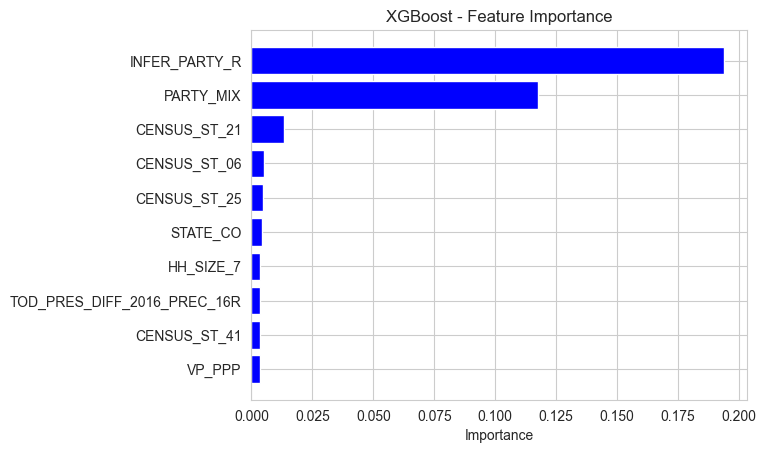

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Starting run 2...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 2: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


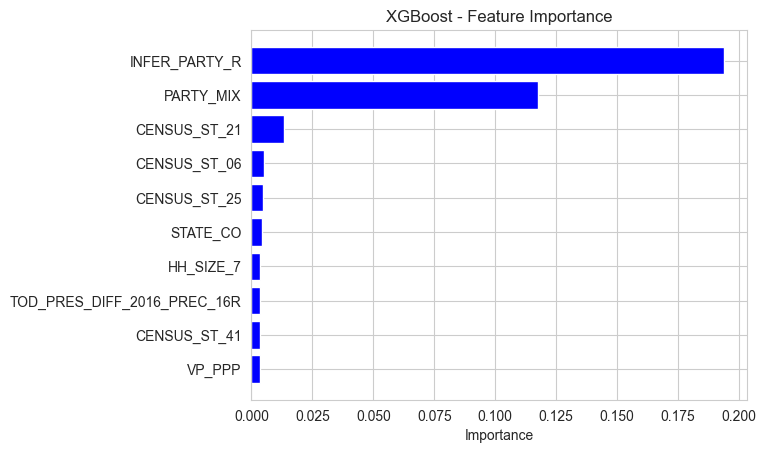

Run 2 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 107.14 seconds to run.


,Run,Accuracy,F1_Score,Recall,Top_N_Features
0,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU..."
1,2,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU..."


In [13]:
def plot_feature_importance(importance, names, model_type, top_N_features=10):
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    sorted_idx = feature_importance.argsort()[-top_N_features:]
    plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center', color='blue')
    plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
    plt.xlabel('Importance')
    plt.title(model_type + ' - Feature Importance')
    plt.show()

@timer_decorator
def run_xgboost_all_columns(data, sample_size=100000, num_runs=1, top_N_features=10):
    results_list = []

    for run in range(1, num_runs + 1):
        print(f"Starting run {run}...")
        
        # Use all available columns except the target column 'PARTY_CODE'
        data_with_all_columns = data.copy()
        data_with_all_columns = data_with_all_columns[data_with_all_columns['PARTY_CODE'].notna()]
        print("number of columns in the dataset", len(data_with_all_columns.columns))
        data_sample = data_with_all_columns.sample(n=sample_size, random_state=42)
        
        class_counts = data_sample['PARTY_CODE'].value_counts()
        valid_classes = class_counts[class_counts >= 2].index.tolist()
        data_sample = data_sample[data_sample['PARTY_CODE'].isin(valid_classes)]
        
        le = LabelEncoder()
        data_sample['PARTY_CODE'] = le.fit_transform(data_sample['PARTY_CODE'].astype(str))
        
        # Identify numeric and non-numeric columns
        numeric_cols = data_sample.select_dtypes(include=['int64', 'float64']).columns.difference(['PARTY_CODE'])
        non_numeric_cols = data_sample.select_dtypes(exclude=['int64', 'float64']).columns.difference(['PARTY_CODE'])
        
        # One-hot encode non-numeric columns
        data_one_hot = pd.get_dummies(data_sample[non_numeric_cols], drop_first=True)
        
        # Combine back with the numeric columns and the target variable
        final_data = pd.concat([data_one_hot, data_sample[numeric_cols], data_sample['PARTY_CODE']], axis=1)
        
        X = final_data.drop('PARTY_CODE', axis=1)
        y = final_data['PARTY_CODE']
                
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
        
        # Handle special characters in column names that XGBoost doesn't like
        X_train.columns = X_train.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        X_test.columns = X_test.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        
        xgb = XGBClassifier(objective='multi:softmax', random_state=42)
        xgb.fit(X_train, y_train)
        
        # Print feature importances
        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        print("Top 10 Important Features and Their Importances for Run {}: ".format(run))
        for index in sorted_idx:
            print(f"{X_train.columns[index]}: {feature_importances[index]}")

        # Plot feature importances
        plot_feature_importance(xgb.feature_importances_, X_train.columns, 'XGBoost', top_N_features=top_N_features)

        y_pred = xgb.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)

        print(f"Run {run} - Accuracy: {accuracy}, F1 Score: {f1}, Recall: {recall}")

        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        top_features = X.columns[sorted_idx].tolist()

        results_list.append({
            'Run': run,
            'Accuracy': accuracy,
            'F1_Score': f1,
            'Recall': recall,
            'Top_N_Features': top_features
        })

    results_df = pd.DataFrame(results_list)
    
    return results_df
# Assuming engineered_data is already defined
result = run_xgboost_all_columns(engineered_data, sample_size=50000, num_runs=2, top_N_features=10)
result

In [28]:
# Remove 'INFER_PARTY_R' from the dataset
engineered_data_ablation = engineered_data.drop(columns=['INFER_PARTY_R'])

# Retrain and evaluate the model
result_ablation = run_xgboost_all_columns(engineered_data_ablation, sample_size=50000, num_runs=2, top_N_features=10)
result_ablation

KeyError: "['INFER_PARTY_R'] not found in axis"

Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


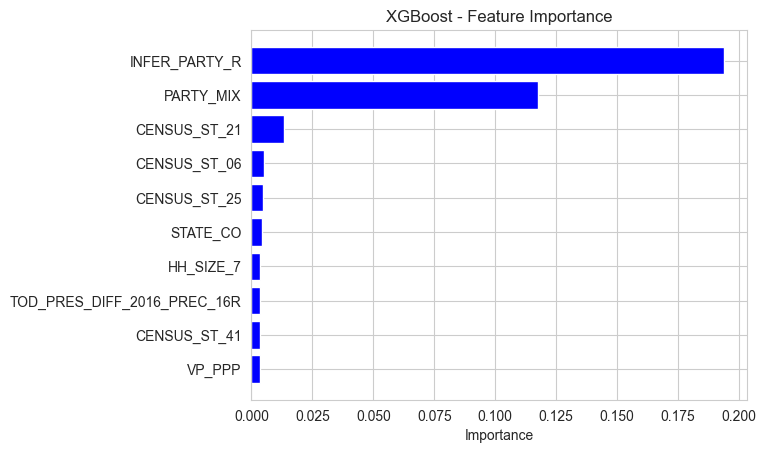

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Starting run 2...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 2: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


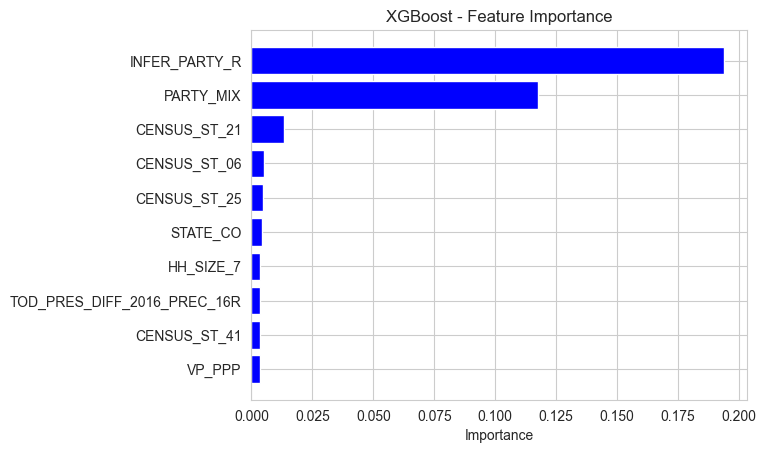

Run 2 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 104.93 seconds to run.
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
PARTY_MIX: 0.1080053523182869
CENSUS_ST_21: 0.015426507219672203
CENSUS_ST_06: 0.00595434894785285
STATE_CO: 0.00442681135609746
CENSUS_ST_25: 0.004073515068739653
VP_PPP: 0.004036083351820707
PRFL_METOO_SUPPORT_Y: 0.003646653378382325
VOTER_TRLR_3: 0.0035290259402245283
PRFL_MINWAGE: 0.003379241796210408
CENSUS_ST_37: 0.002996958326548338


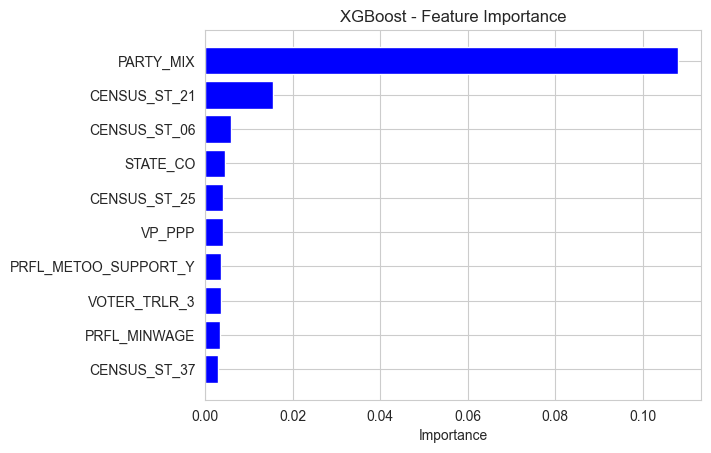

Run 1 - Accuracy: 0.8882, F1 Score: 0.87599376855192, Recall: 0.8882
Starting run 2...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 2: 
PARTY_MIX: 0.1080053523182869
CENSUS_ST_21: 0.015426507219672203
CENSUS_ST_06: 0.00595434894785285
STATE_CO: 0.00442681135609746
CENSUS_ST_25: 0.004073515068739653
VP_PPP: 0.004036083351820707
PRFL_METOO_SUPPORT_Y: 0.003646653378382325
VOTER_TRLR_3: 0.0035290259402245283
PRFL_MINWAGE: 0.003379241796210408
CENSUS_ST_37: 0.002996958326548338


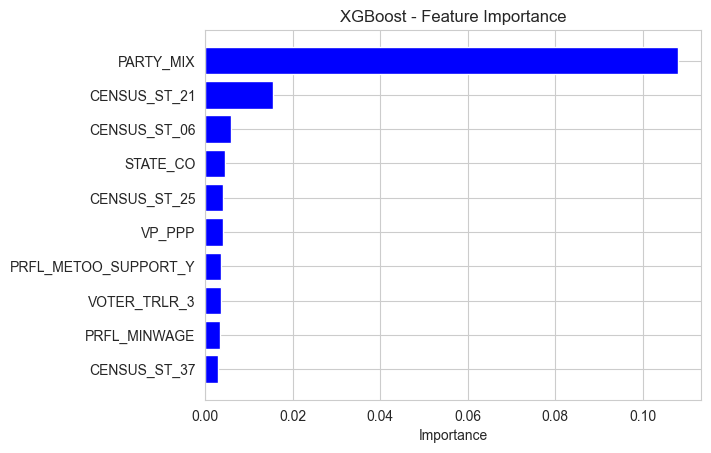

Run 2 - Accuracy: 0.8882, F1 Score: 0.87599376855192, Recall: 0.8882
Function run_xgboost_all_columns took 132.96 seconds to run.


,Run,Accuracy,F1_Score,Recall,Top_N_Features
0,1,0.8882,0.875994,0.8882,"[PARTY_MIX, CENSUS_ST_21, CENSUS_ST_06, STATE_..."
1,2,0.8882,0.875994,0.8882,"[PARTY_MIX, CENSUS_ST_21, CENSUS_ST_06, STATE_..."


In [29]:
def plot_feature_importance(importance, names, model_type, top_N_features=10):
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    sorted_idx = feature_importance.argsort()[-top_N_features:]
    plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center', color='blue')
    plt.yticks(range(len(sorted_idx)), [feature_names[i] for i in sorted_idx])
    plt.xlabel('Importance')
    plt.title(model_type + ' - Feature Importance')
    plt.show()

@timer_decorator
def run_xgboost_all_columns(data, sample_size=100000, num_runs=1, top_N_features=10, exclude_features=None):
    results_list = []
    if exclude_features is None:
        exclude_features = []

    for run in range(1, num_runs + 1):
        print(f"Starting run {run}...")
        
        # Use all available columns except the target column 'PARTY_CODE'
        data_with_all_columns = data.copy()
        data_with_all_columns = data_with_all_columns[data_with_all_columns['PARTY_CODE'].notna()]
        print("number of columns in the dataset", len(data_with_all_columns.columns))
        data_sample = data_with_all_columns.sample(n=sample_size, random_state=42)
        
        class_counts = data_sample['PARTY_CODE'].value_counts()
        valid_classes = class_counts[class_counts >= 2].index.tolist()
        data_sample = data_sample[data_sample['PARTY_CODE'].isin(valid_classes)]
        
        le = LabelEncoder()
        data_sample['PARTY_CODE'] = le.fit_transform(data_sample['PARTY_CODE'].astype(str))
        
        # Identify numeric and non-numeric columns
        numeric_cols = data_sample.select_dtypes(include=['int64', 'float64']).columns.difference(['PARTY_CODE'])
        non_numeric_cols = data_sample.select_dtypes(exclude=['int64', 'float64']).columns.difference(['PARTY_CODE'])
        
        # One-hot encode non-numeric columns
        data_one_hot = pd.get_dummies(data_sample[non_numeric_cols], drop_first=True)
        
        # Combine back with the numeric columns and the target variable
        final_data = pd.concat([data_one_hot, data_sample[numeric_cols], data_sample['PARTY_CODE']], axis=1)
        
        # Remove excluded features if any
        final_data = final_data.drop(columns=exclude_features, errors='ignore')

        X = final_data.drop('PARTY_CODE', axis=1)
        y = final_data['PARTY_CODE']
                
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
        
        # Handle special characters in column names that XGBoost doesn't like
        X_train.columns = X_train.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        X_test.columns = X_test.columns.str.replace('[', '_').str.replace(']', '_').str.replace('<', '_')
        
        xgb = XGBClassifier(objective='multi:softmax', random_state=42)
        xgb.fit(X_train, y_train)
        
        # Print feature importances
        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        print("Top 10 Important Features and Their Importances for Run {}: ".format(run))
        for index in sorted_idx:
            print(f"{X_train.columns[index]}: {feature_importances[index]}")

        # Plot feature importances
        plot_feature_importance(xgb.feature_importances_, X_train.columns, 'XGBoost', top_N_features=top_N_features)

        y_pred = xgb.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)

        print(f"Run {run} - Accuracy: {accuracy}, F1 Score: {f1}, Recall: {recall}")

        feature_importances = xgb.feature_importances_
        sorted_idx = feature_importances.argsort()[::-1][:top_N_features]
        top_features = X.columns[sorted_idx].tolist()

        results_list.append({
            'Run': run,
            'Accuracy': accuracy,
            'F1_Score': f1,
            'Recall': recall,
            'Top_N_Features': top_features
        })

    results_df = pd.DataFrame(results_list)
    
    return results_df
# Assuming engineered_data is already defined
# result = run_xgboost_all_columns(engineered_data, sample_size=50000, num_runs=2, top_N_features=10)
# result
result_ablation = run_xgboost_all_columns(engineered_data, sample_size=50000, num_runs=2, top_N_features=10, exclude_features=['INFER_PARTY_R'])
result_ablation

Running ablation by excluding feature: RECORD_ID
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19439372420310974
PARTY_MIX: 0.10854022949934006
CENSUS_ST_21: 0.013873566873371601
CENSUS_ST_06: 0.0050216903910040855
STATE_CO: 0.004167016129940748
CENSUS_ST_25: 0.004162745550274849
VP_PPP: 0.0036938160192221403
CENSUS_ST_37: 0.0034685921855270863
FUND_POLIT_2: 0.0032056604977697134
CENSUS_ST_41: 0.003178992308676243


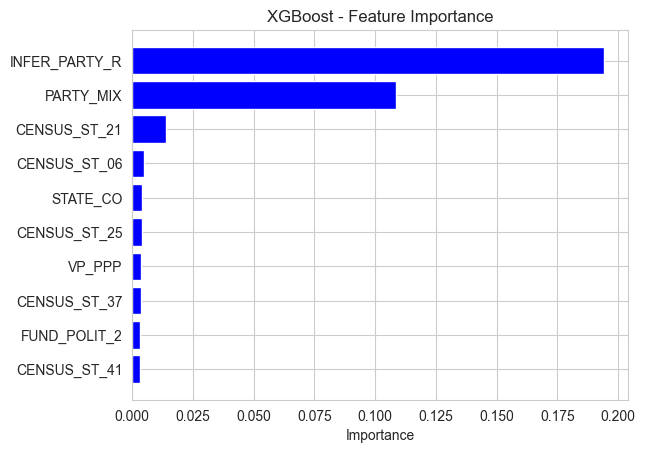

Run 1 - Accuracy: 0.9321, F1 Score: 0.9197781641731857, Recall: 0.9321
Function run_xgboost_all_columns took 50.74 seconds to run.
Running ablation by excluding feature: ADD_TYPE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


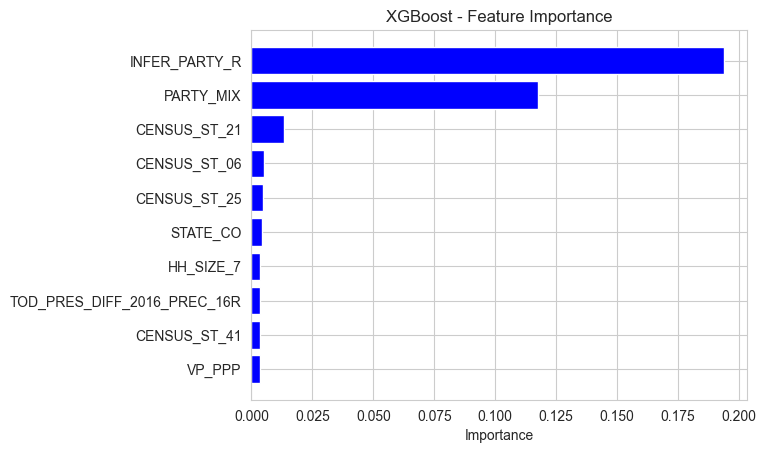

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 58.07 seconds to run.
Running ablation by excluding feature: AFAMPROFLS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


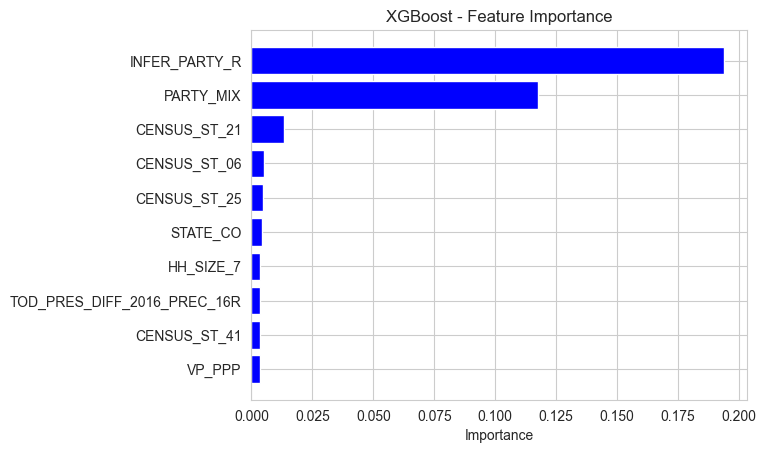

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 74.06 seconds to run.
Running ablation by excluding feature: AGE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19185839593410492
PARTY_MIX: 0.10866754502058029
CENSUS_ST_21: 0.013266561552882195
CENSUS_ST_06: 0.00468905083835125
CENSUS_ST_25: 0.004468386061489582
STATE_CO: 0.004167961422353983
VP_PPP: 0.0037281461991369724
CENSUS_ST_04: 0.0033399355597794056
CENSUS_ST_37: 0.003216870129108429
FUND_POLIT_2: 0.0031828503124415874


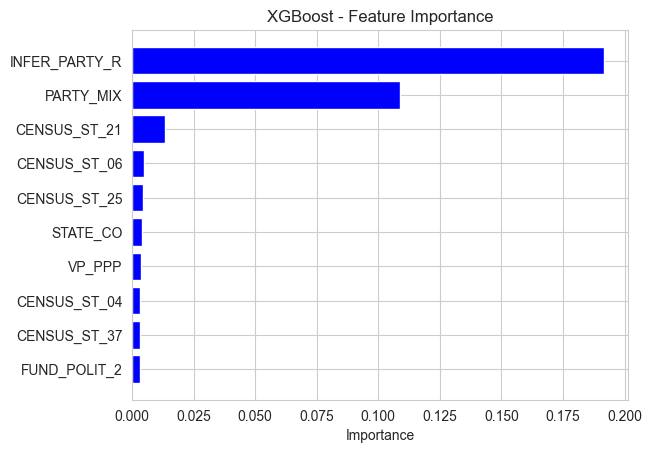

Run 1 - Accuracy: 0.9336, F1 Score: 0.9216547182245395, Recall: 0.9336
Function run_xgboost_all_columns took 90.66 seconds to run.
Running ablation by excluding feature: AI_COUNTY_NAME
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


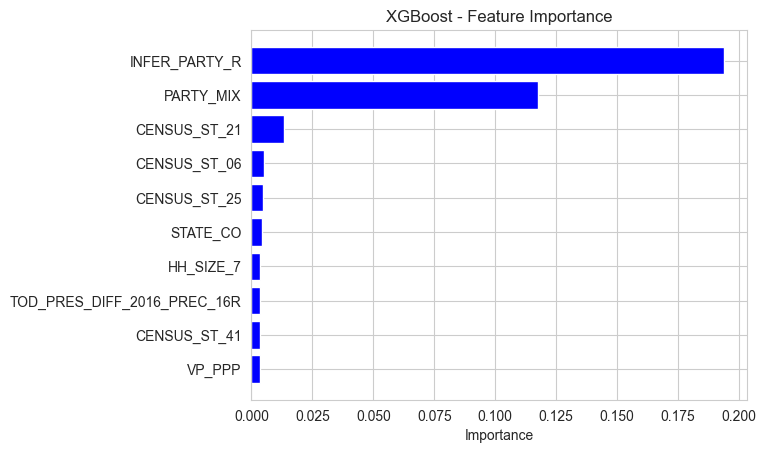

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 91.00 seconds to run.
Running ablation by excluding feature: AIRCOND
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


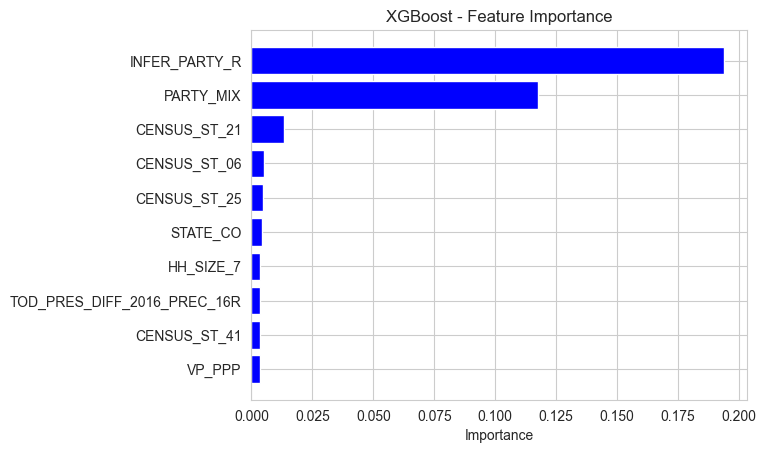

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 80.07 seconds to run.
Running ablation by excluding feature: APP_CHILD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


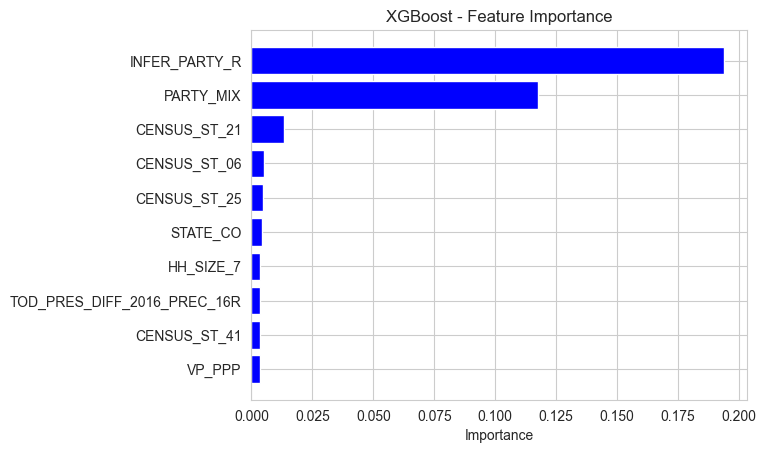

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 80.33 seconds to run.
Running ablation by excluding feature: APP_MENBIG
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


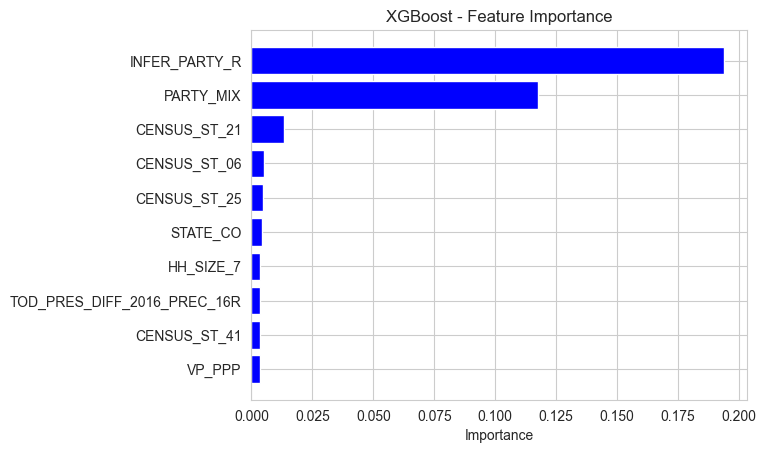

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 80.12 seconds to run.
Running ablation by excluding feature: APP_TODDLR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


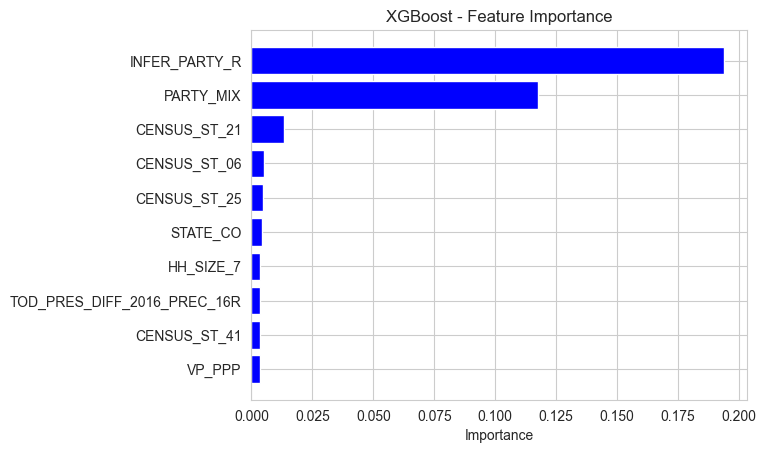

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 80.73 seconds to run.
Running ablation by excluding feature: APP_WOMEN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


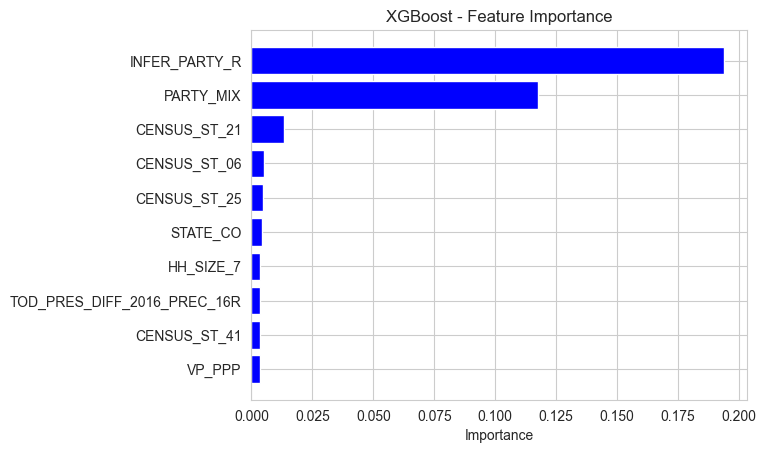

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 75.01 seconds to run.
Running ablation by excluding feature: APP_WOMPET
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


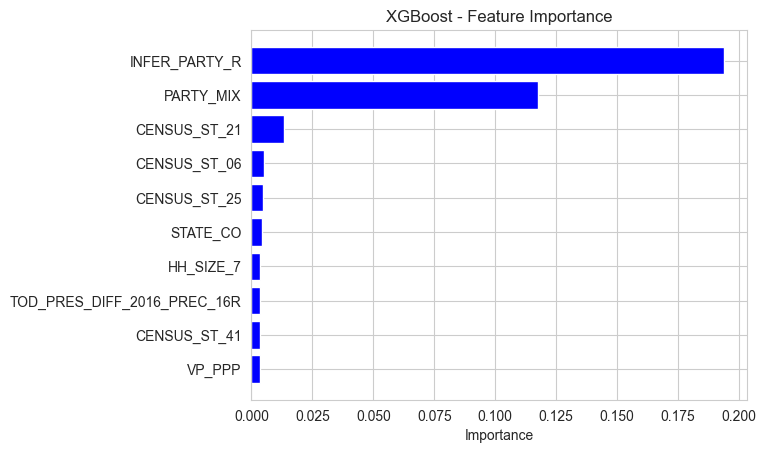

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 70.69 seconds to run.
Running ablation by excluding feature: APP_WOMPLS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


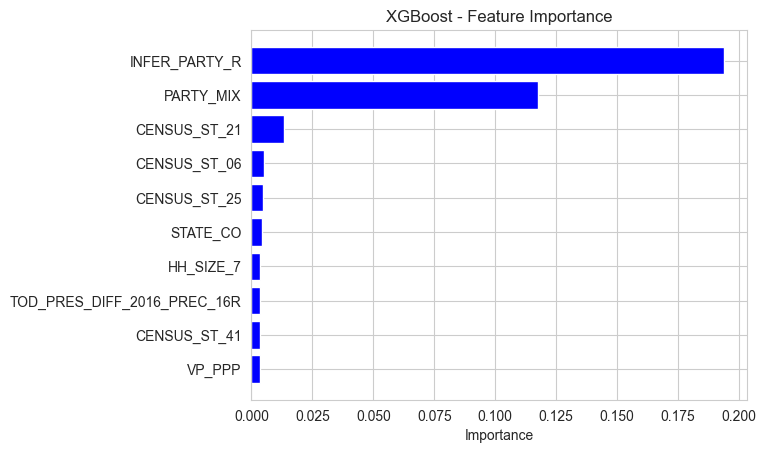

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 68.96 seconds to run.
Running ablation by excluding feature: APP_YNGMEN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


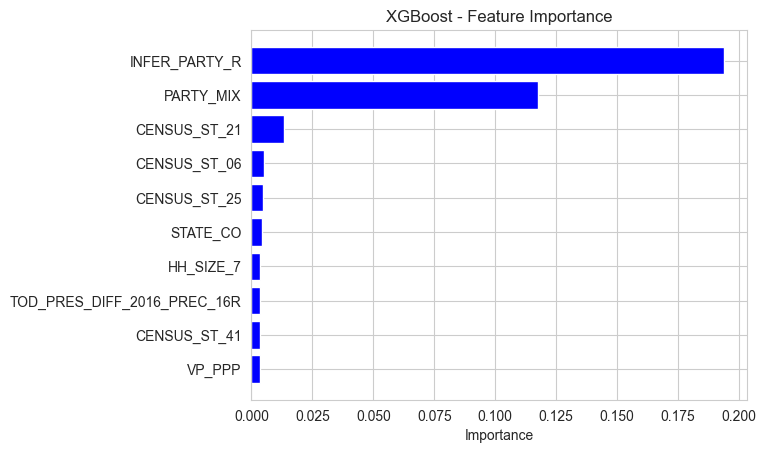

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 67.22 seconds to run.
Running ablation by excluding feature: ARTS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


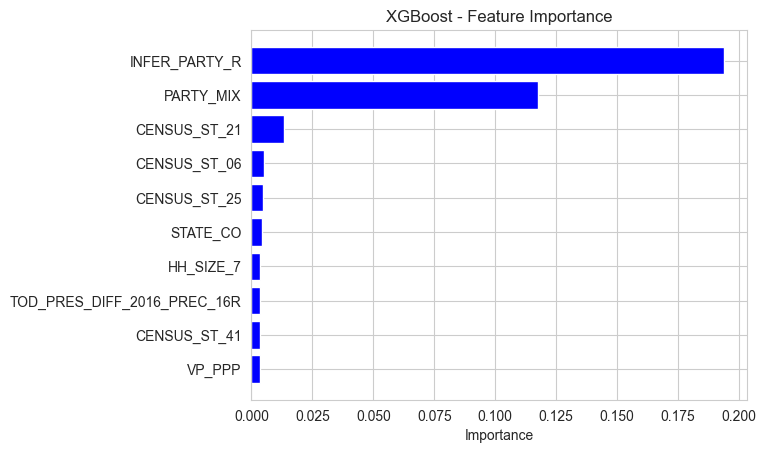

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 67.42 seconds to run.
Running ablation by excluding feature: ASSMLCODE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


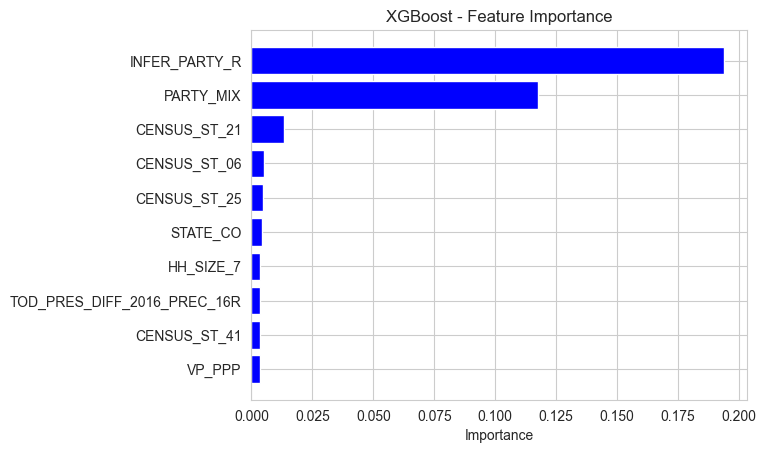

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 68.67 seconds to run.
Running ablation by excluding feature: AUTOACCES
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


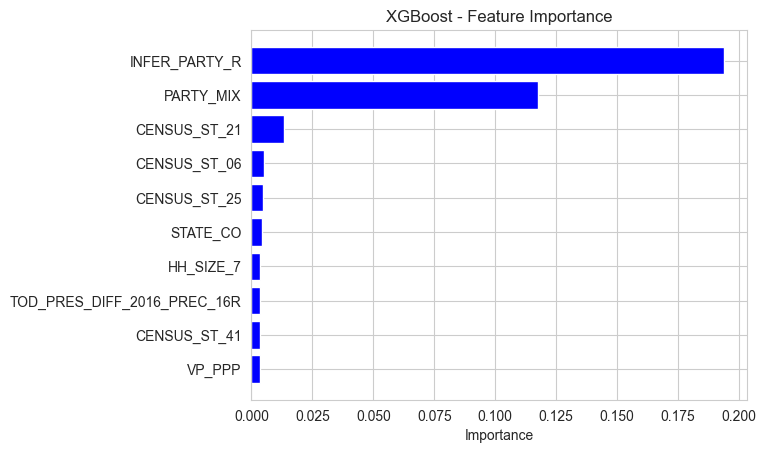

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 68.81 seconds to run.
Running ablation by excluding feature: AUTOWORK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


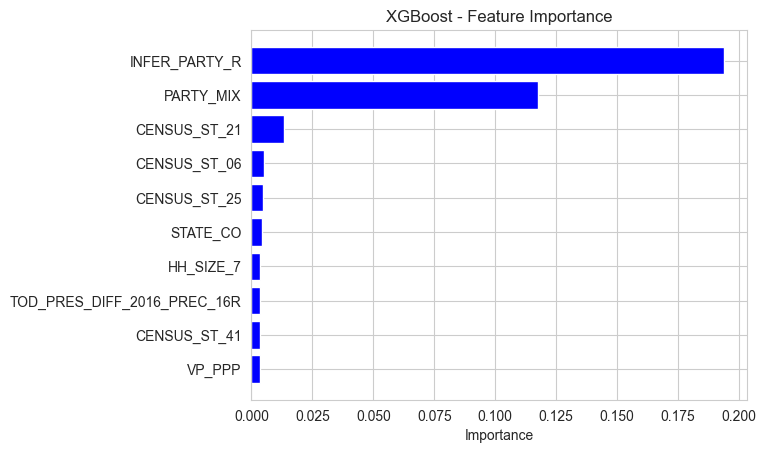

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 69.21 seconds to run.
Running ablation by excluding feature: BOATING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


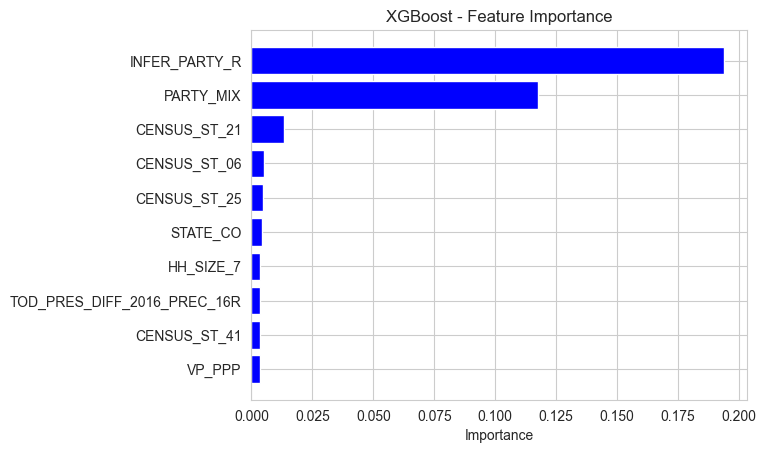

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 68.90 seconds to run.
Running ablation by excluding feature: BROADERLIV
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


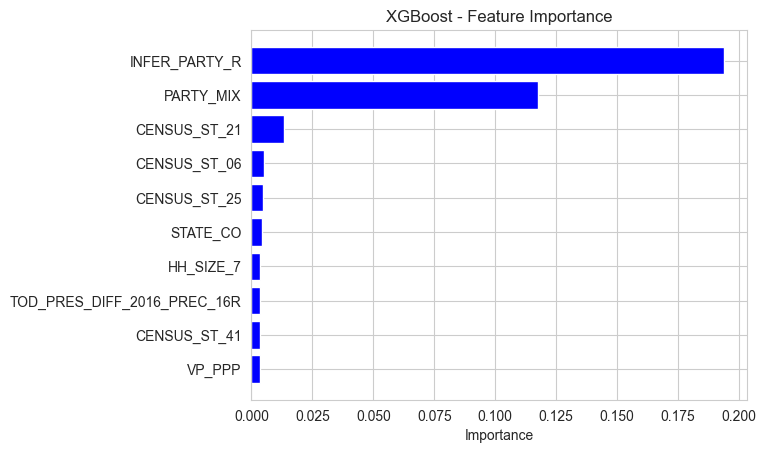

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 69.40 seconds to run.
Running ablation by excluding feature: BUS_OWNER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


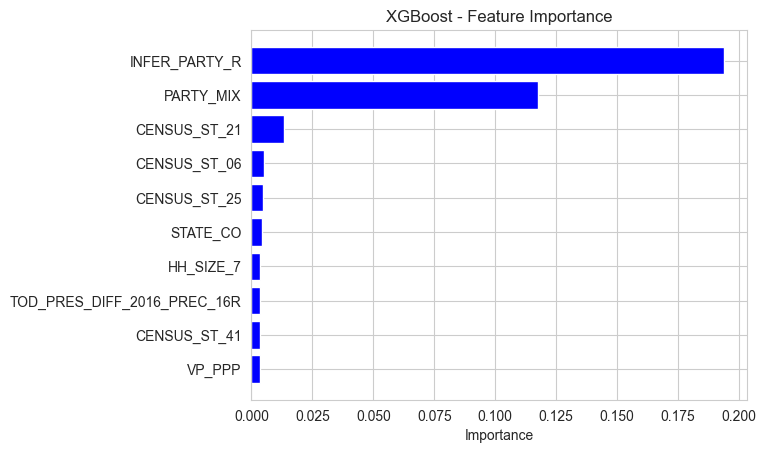

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.16 seconds to run.
Running ablation by excluding feature: CARDUSER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


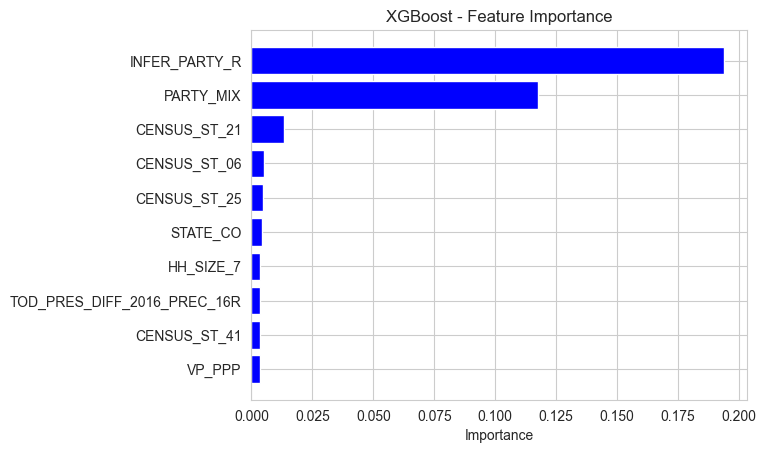

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 51.45 seconds to run.
Running ablation by excluding feature: CATOWNER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


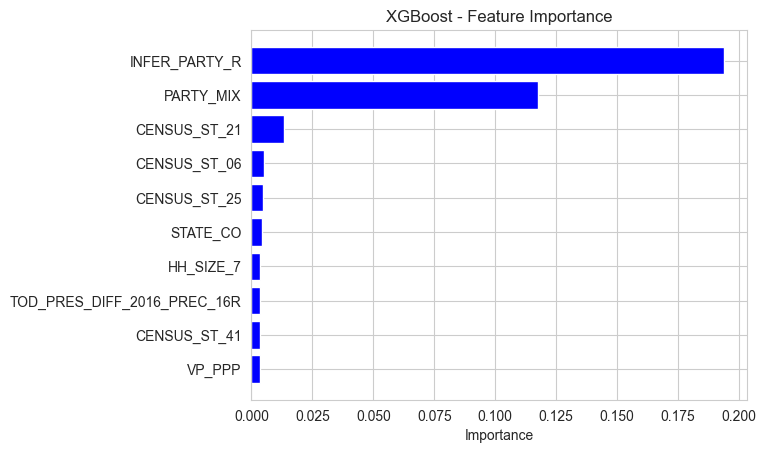

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 50.56 seconds to run.
Running ablation by excluding feature: CENSUS_ST
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


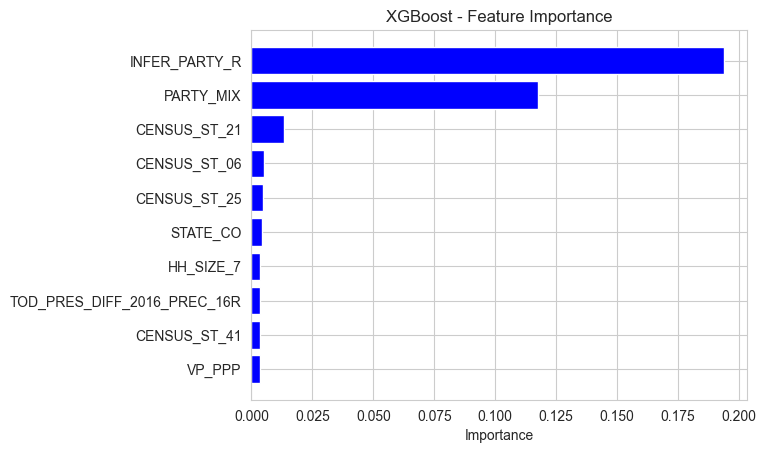

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 52.15 seconds to run.
Running ablation by excluding feature: CENSUS_TRK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19261036813259125
PARTY_MIX: 0.107863649725914
CENSUS_ST_21: 0.013751795515418053
CENSUS_ST_06: 0.004944504704326391
STATE_CO: 0.004119727294892073
CENSUS_ST_25: 0.0036851016338914633
VP_PPP: 0.003677553264424205
HH_SIZE_7: 0.0034498514141887426
TOD_PRES_DIFF_2016_PREC_16R: 0.0034323616418987513
FUND_POLIT_2: 0.003176233032718301


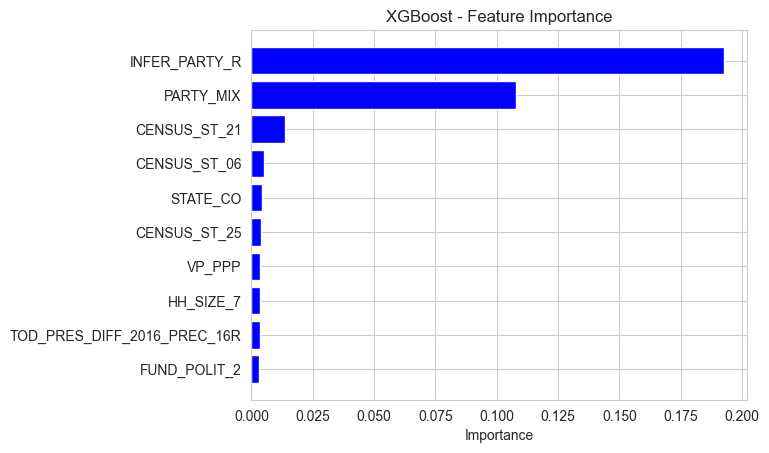

Run 1 - Accuracy: 0.9331, F1 Score: 0.9209603160881735, Recall: 0.9331
Function run_xgboost_all_columns took 53.55 seconds to run.
Running ablation by excluding feature: CH_0002FEM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


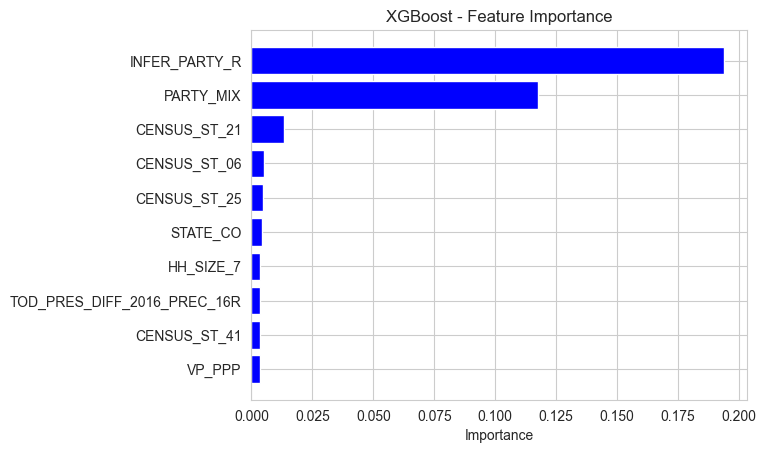

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 52.70 seconds to run.
Running ablation by excluding feature: CH_0002MAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


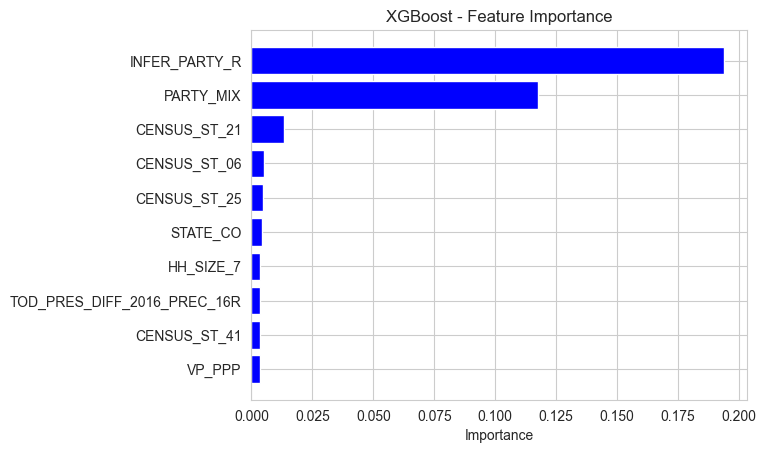

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 53.20 seconds to run.
Running ablation by excluding feature: CH_0002UNK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


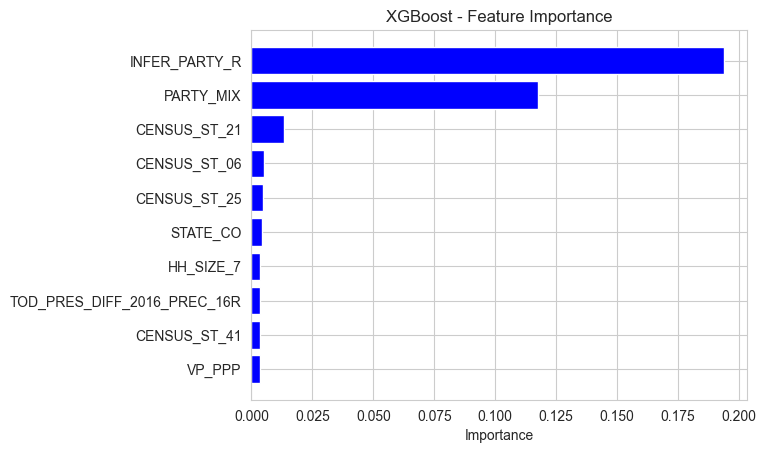

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 53.40 seconds to run.
Running ablation by excluding feature: CH_0305FEM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


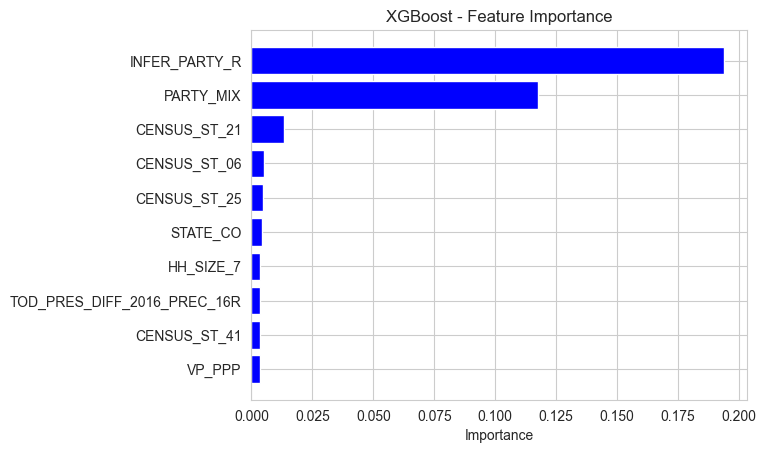

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 53.21 seconds to run.
Running ablation by excluding feature: CH_0305MAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


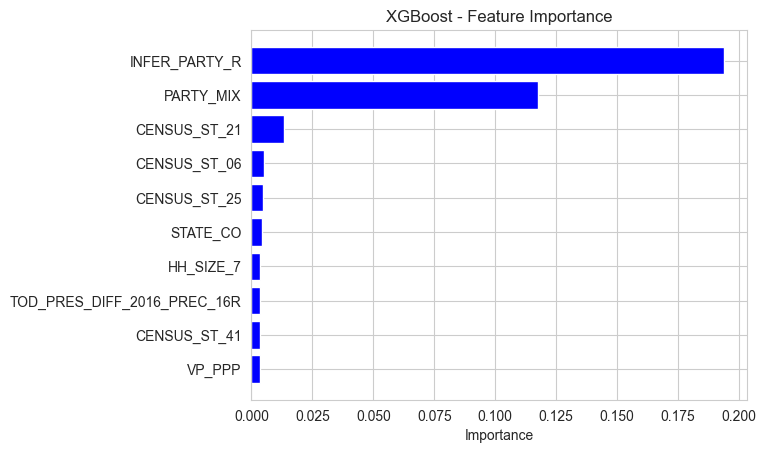

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 53.40 seconds to run.
Running ablation by excluding feature: CH_0305UNK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


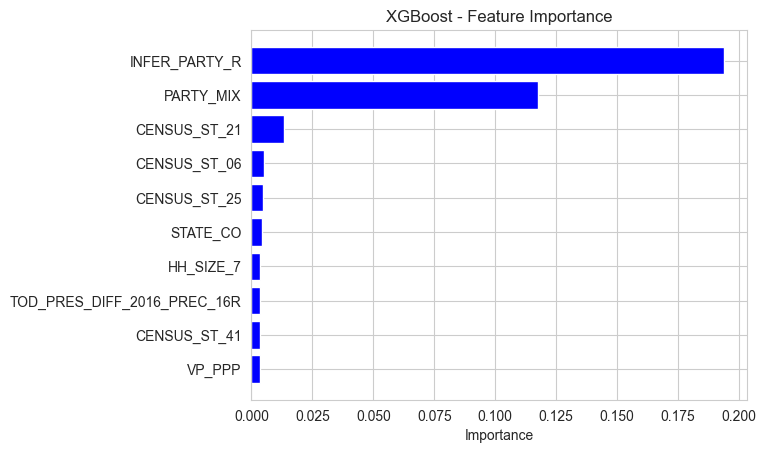

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 54.12 seconds to run.
Running ablation by excluding feature: CH_0610FEM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


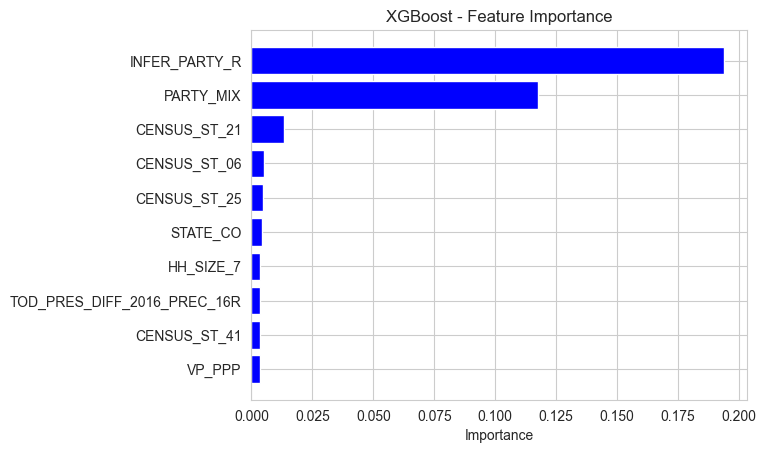

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 54.08 seconds to run.
Running ablation by excluding feature: CH_0610MAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


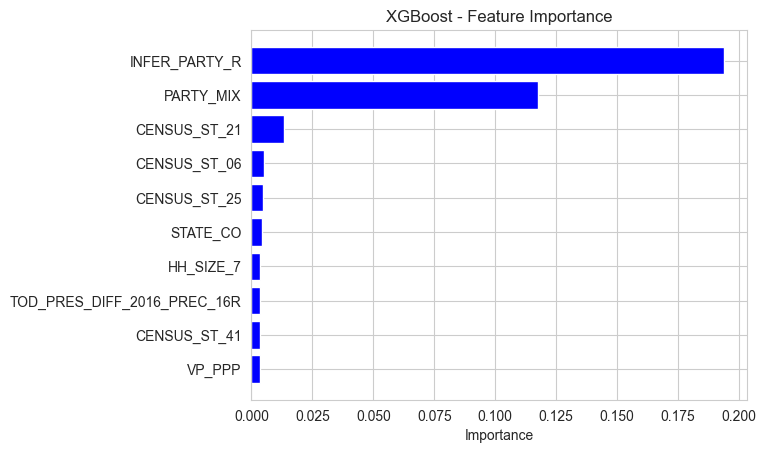

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 54.25 seconds to run.
Running ablation by excluding feature: CH_0610UNK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


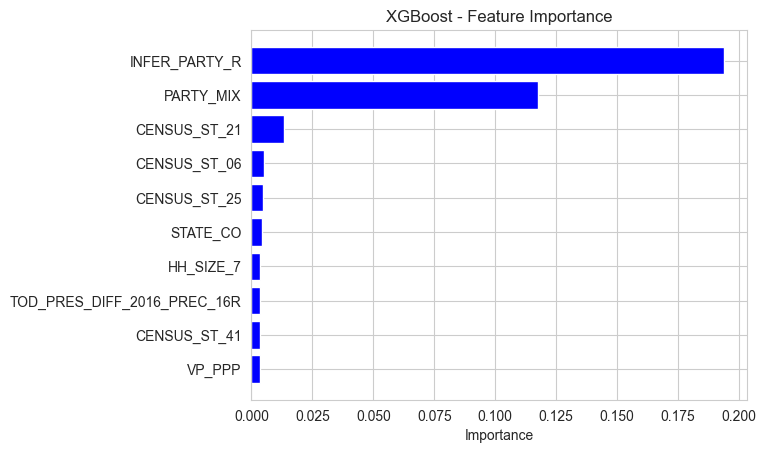

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 54.31 seconds to run.
Running ablation by excluding feature: CH_1115FEM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


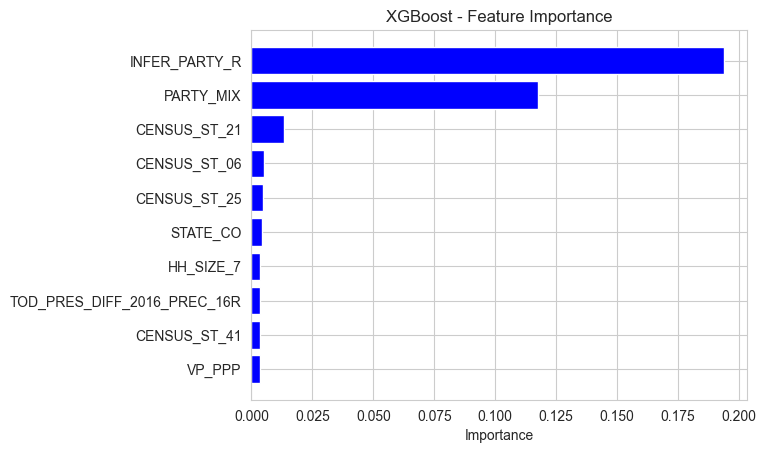

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 57.16 seconds to run.
Running ablation by excluding feature: CH_1115MAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


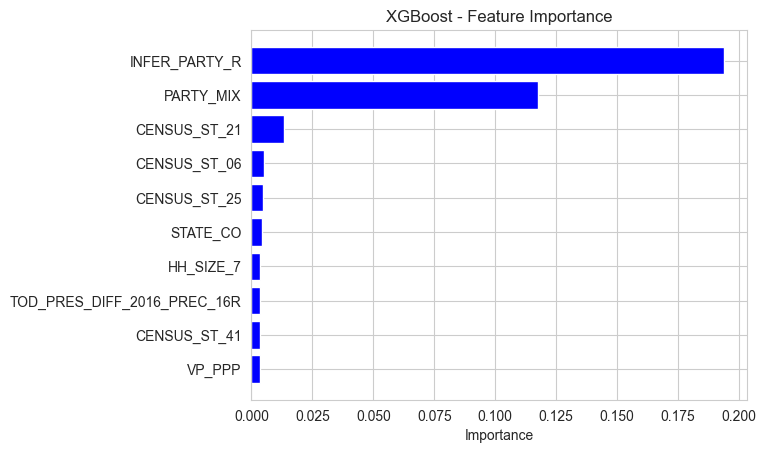

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.07 seconds to run.
Running ablation by excluding feature: CH_1115UNK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


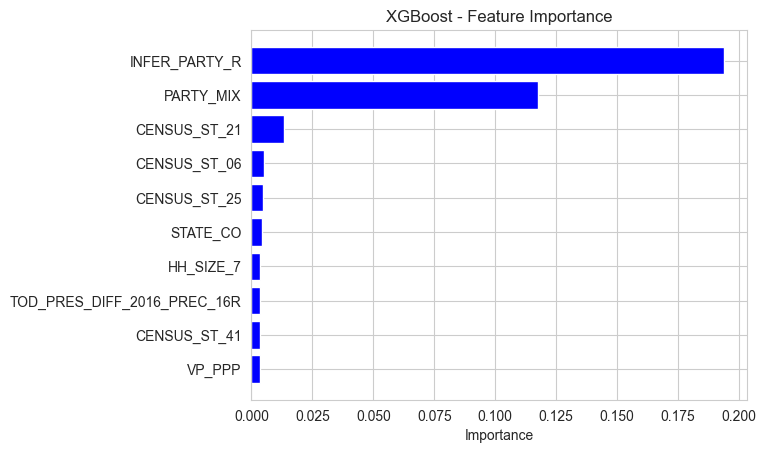

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 55.37 seconds to run.
Running ablation by excluding feature: CH_1617FEM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


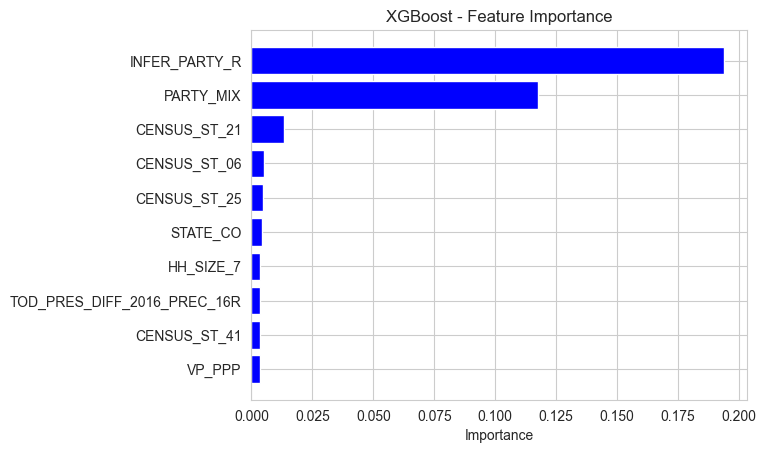

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 55.14 seconds to run.
Running ablation by excluding feature: CH_1617MAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


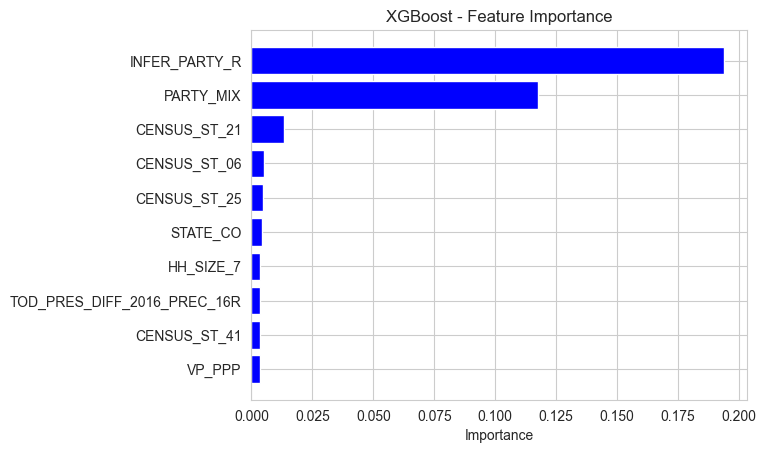

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 57.70 seconds to run.
Running ablation by excluding feature: CH_1617UNK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


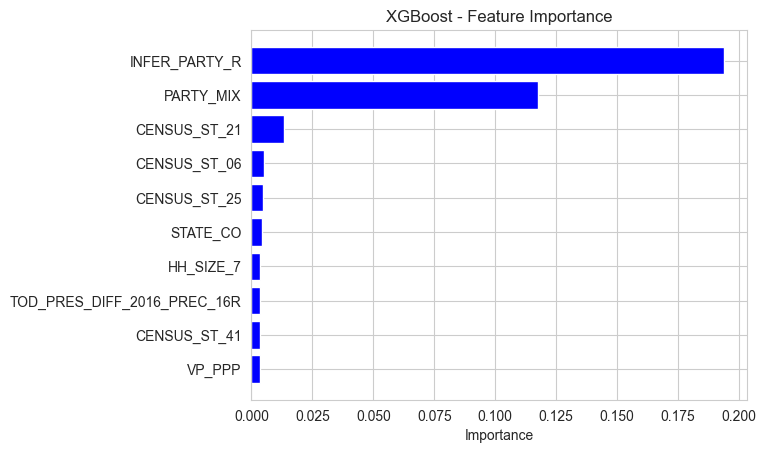

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 57.53 seconds to run.
Running ablation by excluding feature: CHRISTFAM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


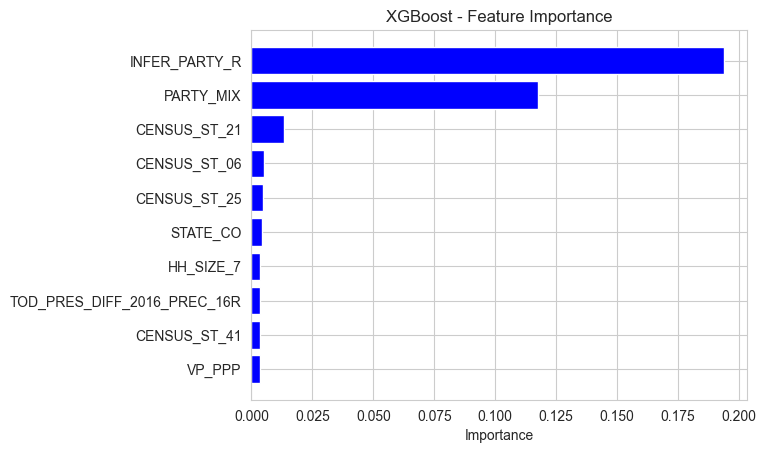

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 57.85 seconds to run.
Running ablation by excluding feature: CNS_MEDINC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


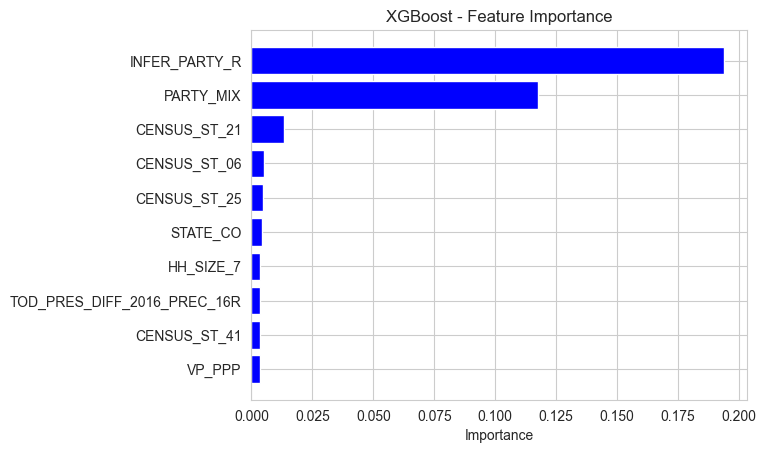

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 58.70 seconds to run.
Running ablation by excluding feature: CNSUS_PCTA
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.18933026492595673
PARTY_MIX: 0.1089252457022667
CENSUS_ST_21: 0.01316143199801445
CENSUS_ST_06: 0.0050318180583417416
STATE_CO: 0.004266773816198111
CENSUS_ST_04: 0.0035673535894602537
VP_PPP: 0.003496244316920638
CENSUS_ST_25: 0.003480936400592327
HH_SIZE_7: 0.0034389146603643894
TOD_PRES_DIFF_2016_PREC_16R: 0.00342061510309577


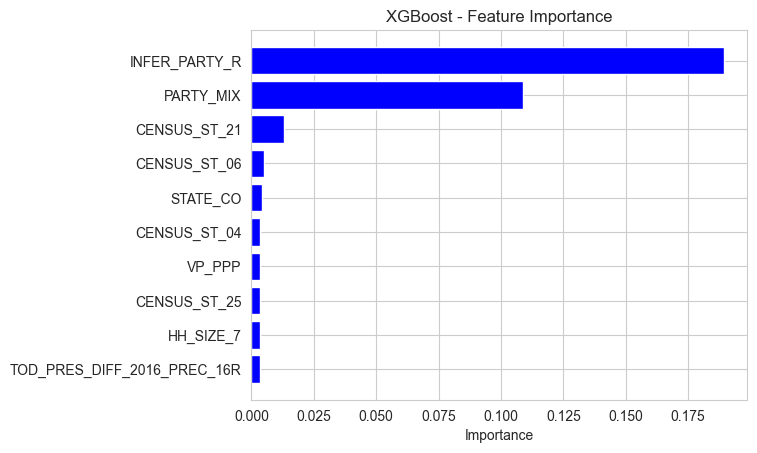

Run 1 - Accuracy: 0.9323, F1 Score: 0.9202681293988835, Recall: 0.9323
Function run_xgboost_all_columns took 58.76 seconds to run.
Running ablation by excluding feature: CNSUS_PCTB
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19561132788658142
PARTY_MIX: 0.10897291451692581
CENSUS_ST_21: 0.013477536849677563
CENSUS_ST_06: 0.0050258757546544075
STATE_CO: 0.004198897164314985
CENSUS_ST_41: 0.003873699577525258
VP_PPP: 0.003699511056765914
HH_SIZE_7: 0.003503776155412197
CENSUS_ST_25: 0.0035026019904762506
TOD_PRES_DIFF_2016_PREC_16R: 0.003487515961751342


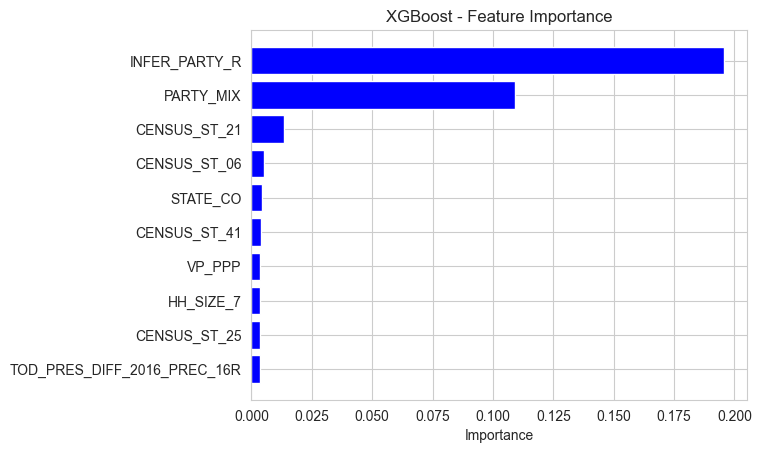

Run 1 - Accuracy: 0.9331, F1 Score: 0.9208438615352729, Recall: 0.9331
Function run_xgboost_all_columns took 58.31 seconds to run.
Running ablation by excluding feature: CNSUS_PCTH
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19365397095680237
PARTY_MIX: 0.11036588996648788
CENSUS_ST_21: 0.013907121494412422
CENSUS_ST_06: 0.004647687077522278
CENSUS_ST_25: 0.004208979196846485
STATE_CO: 0.004183740820735693
CENSUS_ST_41: 0.003675891784951091
VP_PPP: 0.003504664869979024
TOD_PRES_DIFF_2016_PREC_16R: 0.0034720771946012974
CENSUS_ST_04: 0.003402003785595298


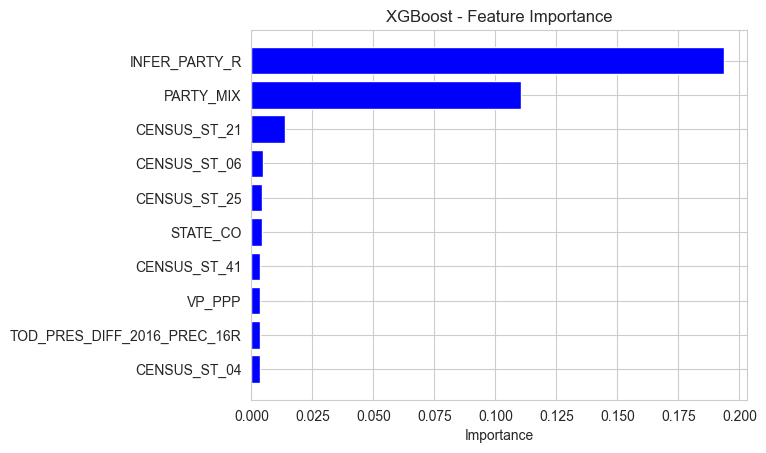

Run 1 - Accuracy: 0.9331, F1 Score: 0.9210643169181091, Recall: 0.9331
Function run_xgboost_all_columns took 58.91 seconds to run.
Running ablation by excluding feature: CNSUS_PCTI
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1957578808069229
PARTY_MIX: 0.112488754093647
CENSUS_ST_21: 0.014058499597012997
CENSUS_ST_06: 0.004855381790548563
CENSUS_ST_25: 0.004290312994271517
STATE_CO: 0.004226746503263712
CENSUS_ST_04: 0.003559825010597706
HH_SIZE_7: 0.0035274969413876534
TOD_PRES_DIFF_2016_PREC_16R: 0.0035096141509711742
VP_PPP: 0.0034417251590639353


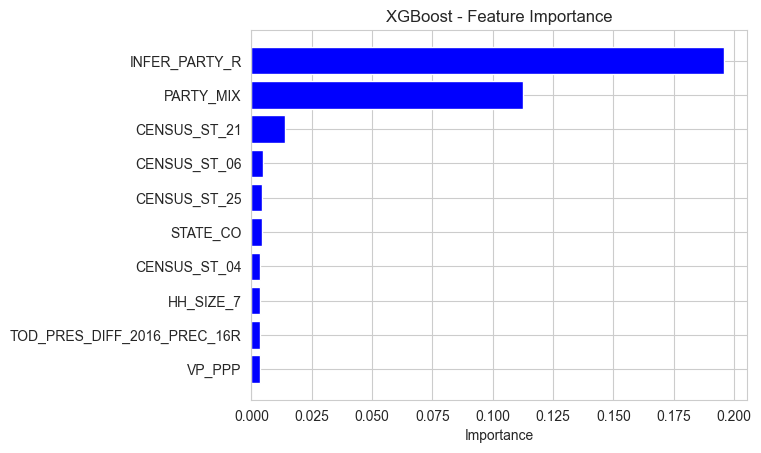

Run 1 - Accuracy: 0.9336, F1 Score: 0.9213664062812466, Recall: 0.9336
Function run_xgboost_all_columns took 59.20 seconds to run.
Running ablation by excluding feature: CNSUS_PCTM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1930537223815918
PARTY_MIX: 0.11287437379360199
CENSUS_ST_21: 0.013864446431398392
CENSUS_ST_06: 0.005777446553111076
STATE_CO: 0.004263476934283972
VP_PPP: 0.0038294652476906776
CENSUS_ST_41: 0.00376072502695024
CENSUS_ST_25: 0.003557247342541814
CENSUS_ST_04: 0.0034958859905600548
HH_SIZE_7: 0.0034787983167916536


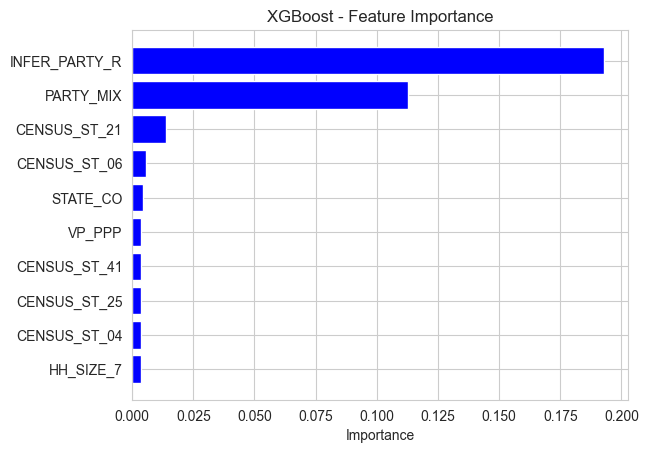

Run 1 - Accuracy: 0.9333, F1 Score: 0.9214786137574682, Recall: 0.9333
Function run_xgboost_all_columns took 58.95 seconds to run.
Running ablation by excluding feature: CNSUS_PCTO
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.195657879114151
PARTY_MIX: 0.11537215113639832
CENSUS_ST_21: 0.014076986350119114
CENSUS_ST_06: 0.004934144206345081
STATE_CO: 0.004223724827170372
CENSUS_ST_25: 0.004164325073361397
CENSUS_ST_04: 0.0035711342934519053
VP_PPP: 0.0035664569586515427
PRFL_MINWAGE: 0.0035079375375062227
TOD_PRES_DIFF_2016_PREC_16R: 0.0035079210065305233


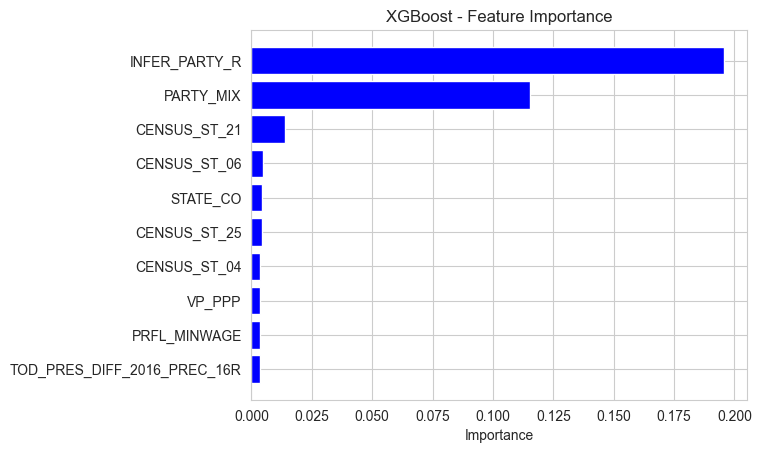

Run 1 - Accuracy: 0.9328, F1 Score: 0.9205363839943081, Recall: 0.9328
Function run_xgboost_all_columns took 59.08 seconds to run.
Running ablation by excluding feature: CNSUS_PCTP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19615530967712402
PARTY_MIX: 0.11269425600767136
CENSUS_ST_21: 0.013999656774103642
CENSUS_ST_06: 0.004960804712027311
CENSUS_ST_25: 0.0042600068263709545
STATE_CO: 0.004211589694023132
VP_PPP: 0.0036585493944585323
HH_SIZE_7: 0.003513460513204336
TOD_PRES_DIFF_2016_PREC_16R: 0.003495648968964815
CENSUS_ST_37: 0.0032550522591918707


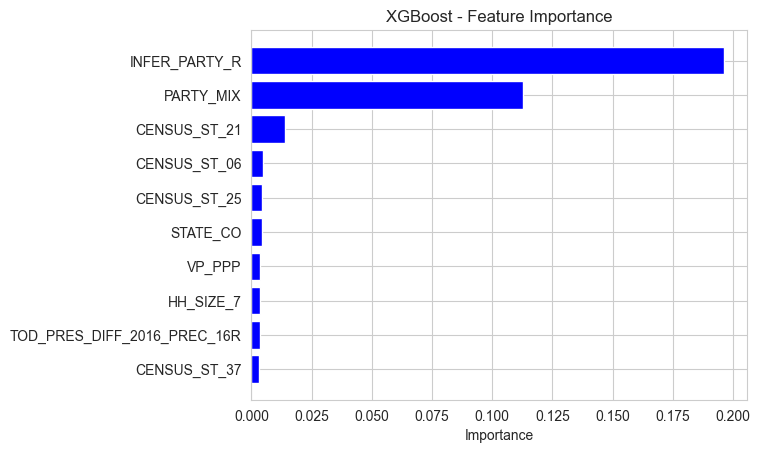

Run 1 - Accuracy: 0.933, F1 Score: 0.9209352704247181, Recall: 0.933
Function run_xgboost_all_columns took 60.19 seconds to run.
Running ablation by excluding feature: CNSUS_PCTW
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19252292811870575
PARTY_MIX: 0.10960427671670914
CENSUS_ST_21: 0.013509227894246578
CENSUS_ST_06: 0.004595245700329542
STATE_CO: 0.004313558805733919
CENSUS_ST_25: 0.004096943885087967
VP_PPP: 0.003967554308474064
CENSUS_ST_24: 0.0038187543395906687
HH_SIZE_7: 0.003518193494528532
PRFL_MINWAGE: 0.0034916531294584274


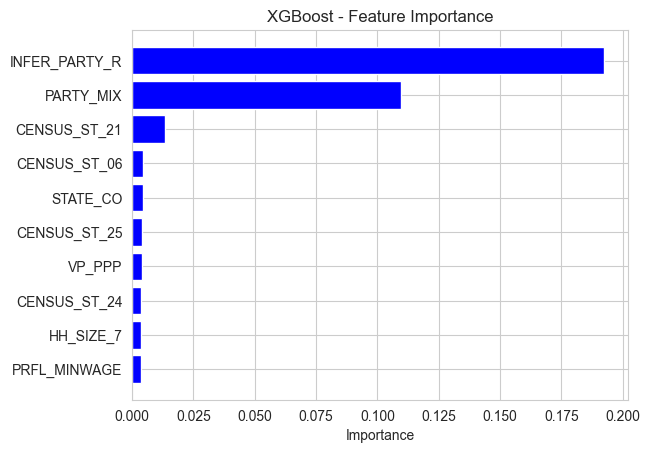

Run 1 - Accuracy: 0.9337, F1 Score: 0.9215381973979303, Recall: 0.9337
Function run_xgboost_all_columns took 60.66 seconds to run.
Running ablation by excluding feature: COL_ANTIQ
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


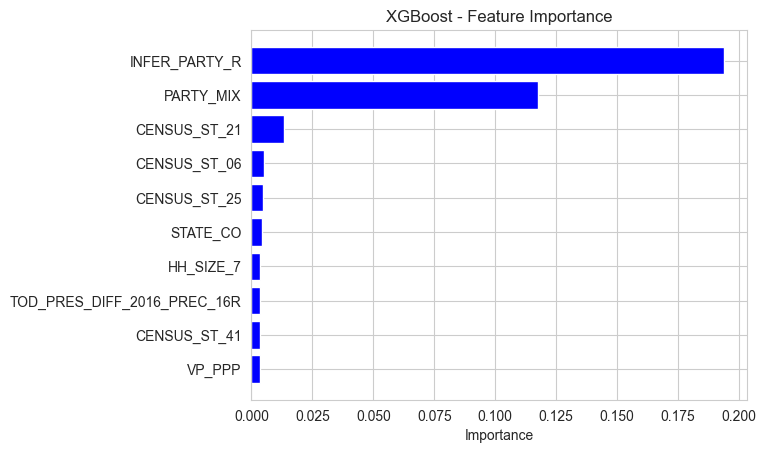

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.99 seconds to run.
Running ablation by excluding feature: COL_ARTS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


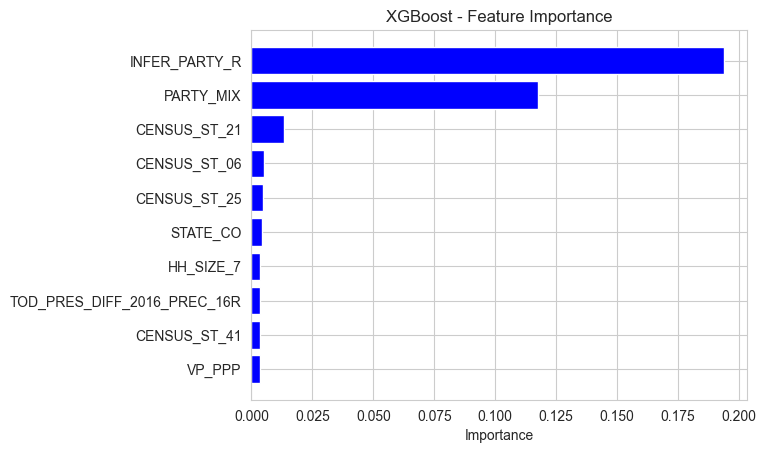

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.46 seconds to run.
Running ablation by excluding feature: COL_COIN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


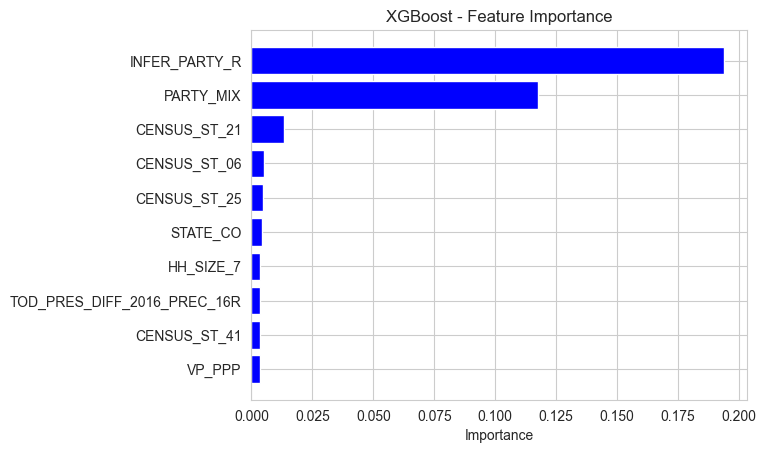

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.05 seconds to run.
Running ablation by excluding feature: COL_SPORT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


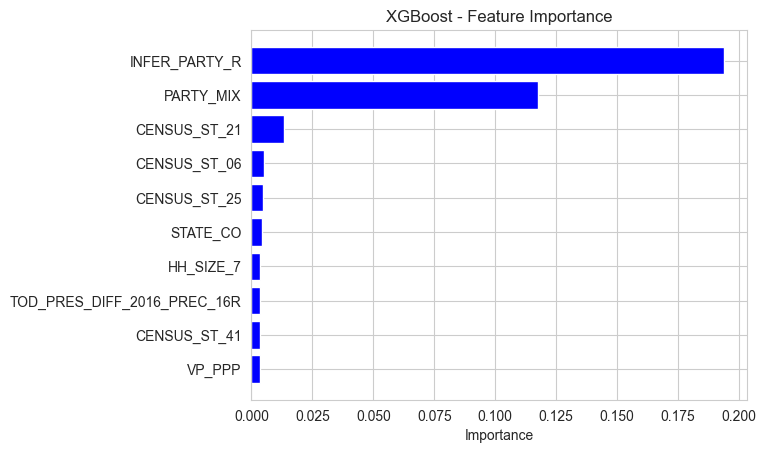

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.20 seconds to run.
Running ablation by excluding feature: COL_STAMP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


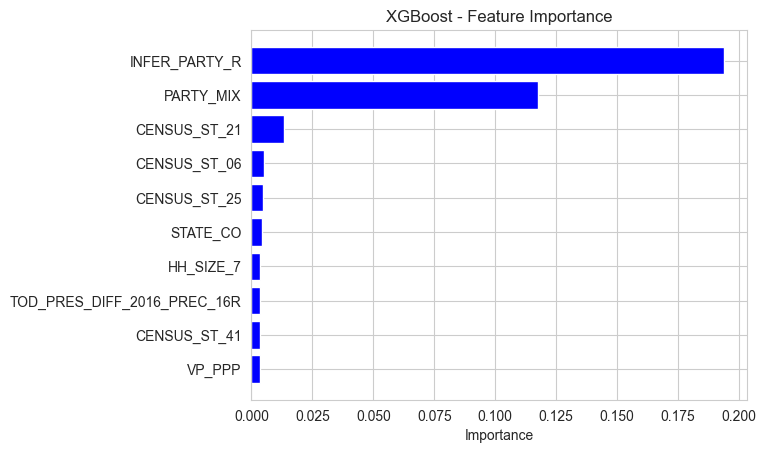

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.50 seconds to run.
Running ablation by excluding feature: COMPHOMOFC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


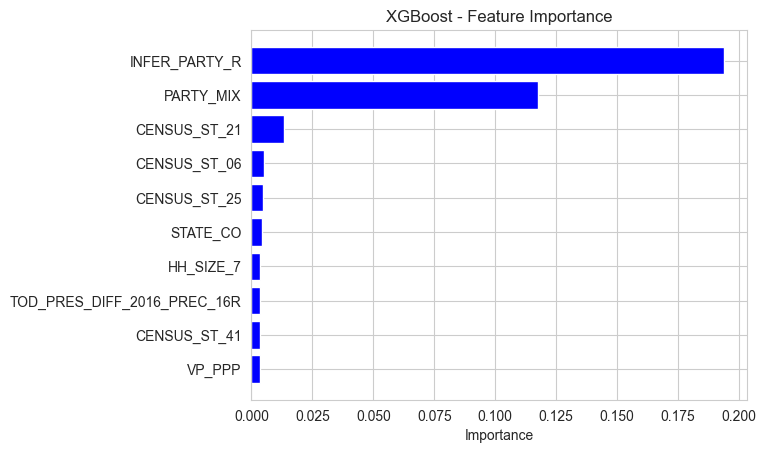

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.87 seconds to run.
Running ablation by excluding feature: COMPUTERS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


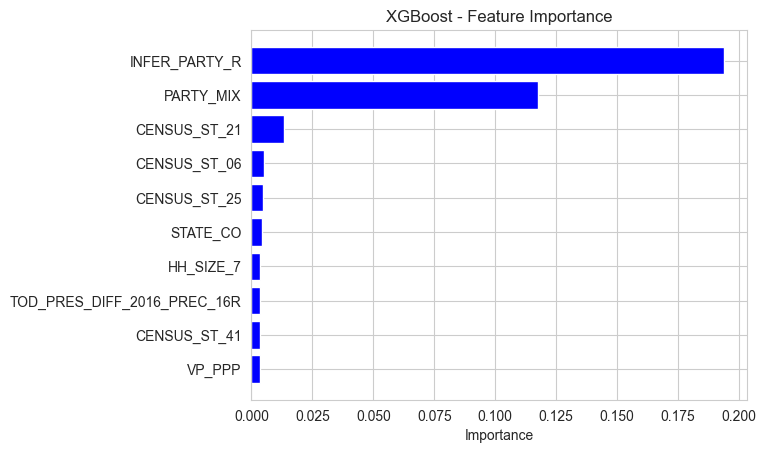

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.97 seconds to run.
Running ablation by excluding feature: CONG_DIST
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


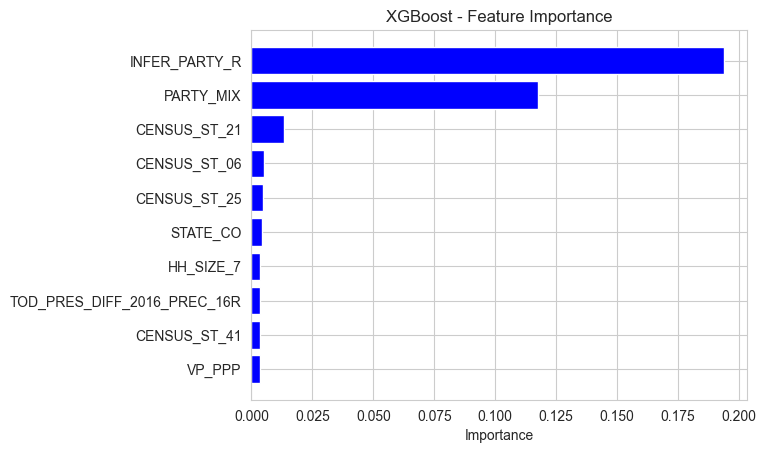

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.49 seconds to run.
Running ablation by excluding feature: COOK_GEN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


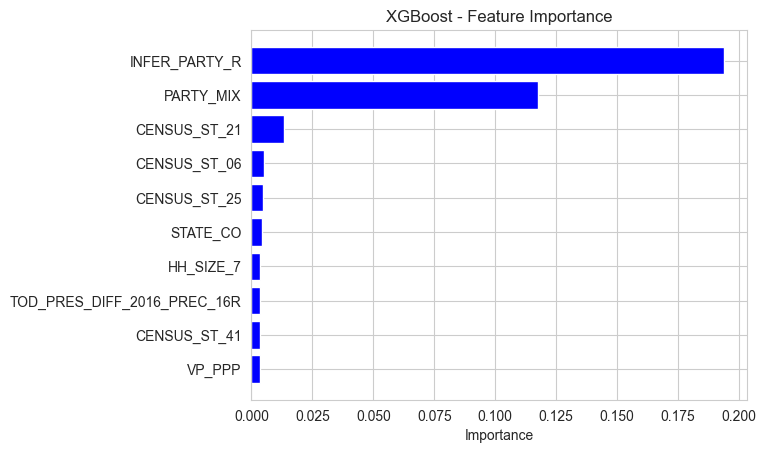

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.73 seconds to run.
Running ablation by excluding feature: COUNTY_ST
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


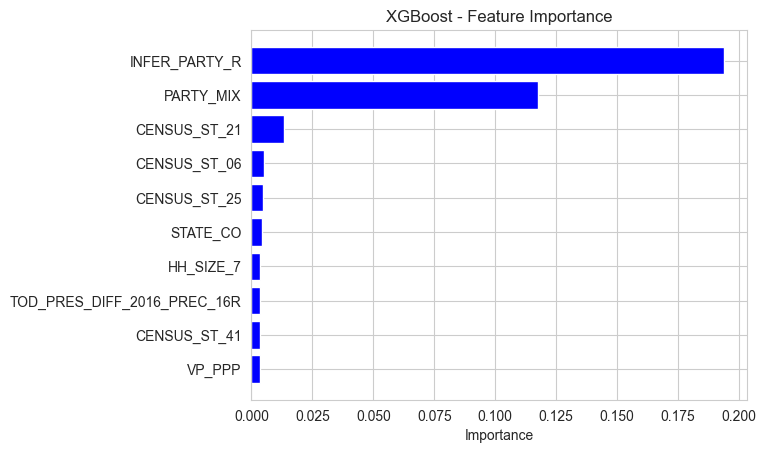

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.26 seconds to run.
Running ablation by excluding feature: COUNTY_TYPE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


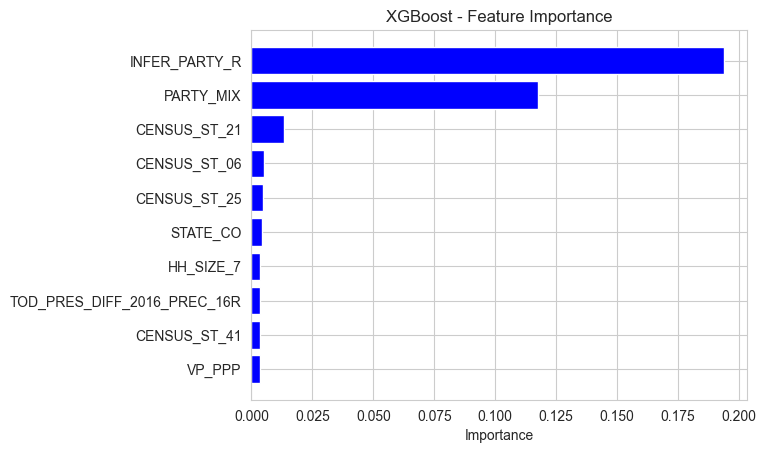

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.49 seconds to run.
Running ablation by excluding feature: CRD_RANGE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


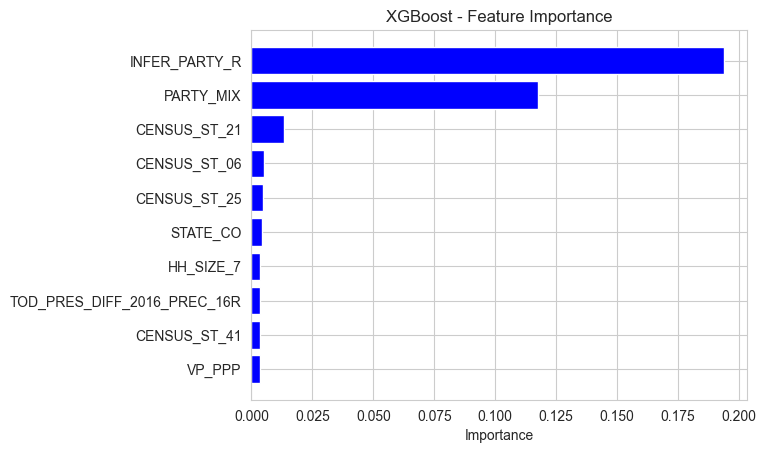

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.45 seconds to run.
Running ablation by excluding feature: CREDRATE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


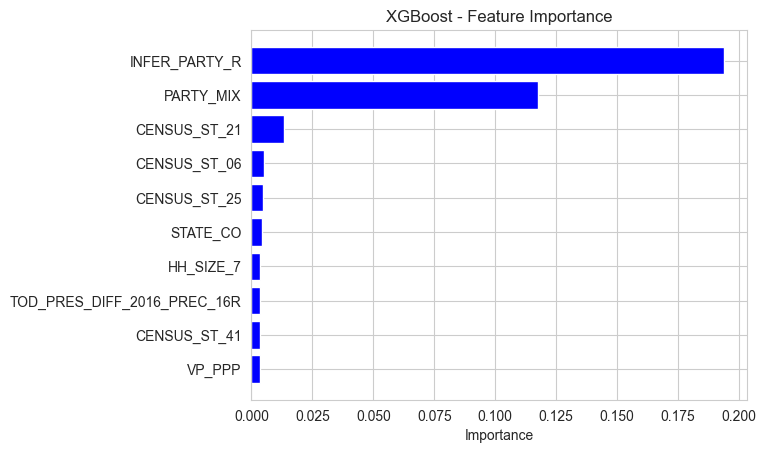

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.82 seconds to run.
Running ablation by excluding feature: CURRAFFAIR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


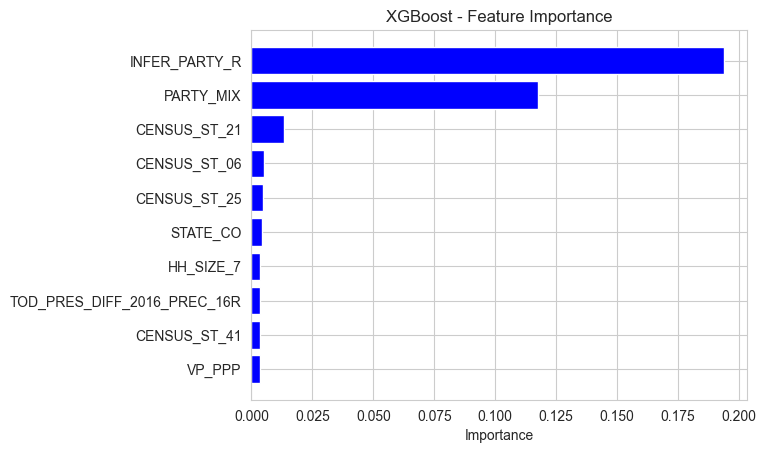

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.45 seconds to run.
Running ablation by excluding feature: DEPTSTCRD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


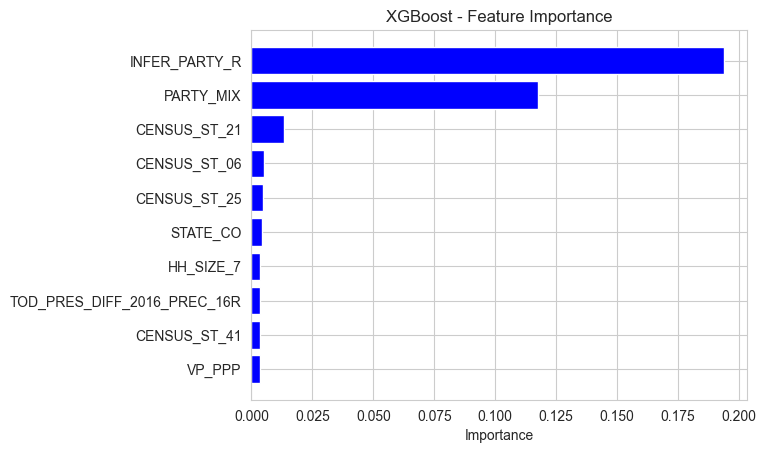

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.08 seconds to run.
Running ablation by excluding feature: DIETING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


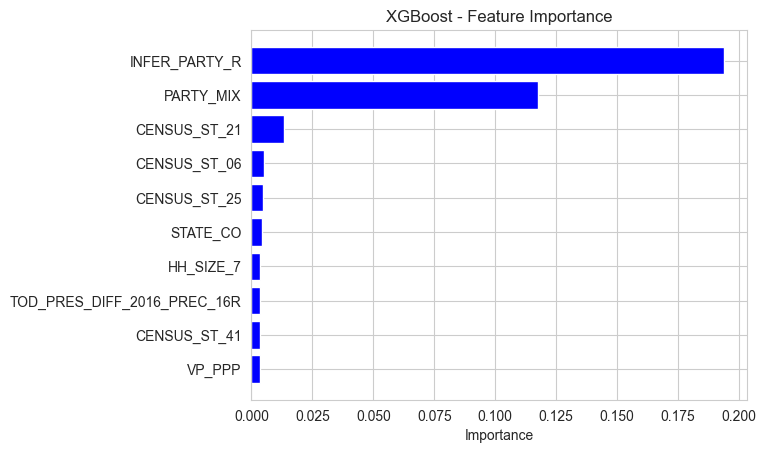

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.03 seconds to run.
Running ablation by excluding feature: DIYLIV
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


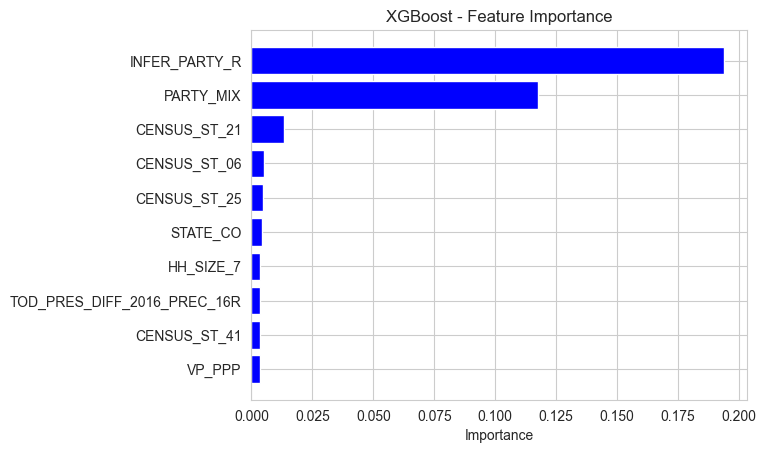

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.32 seconds to run.
Running ablation by excluding feature: DOGOWNER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


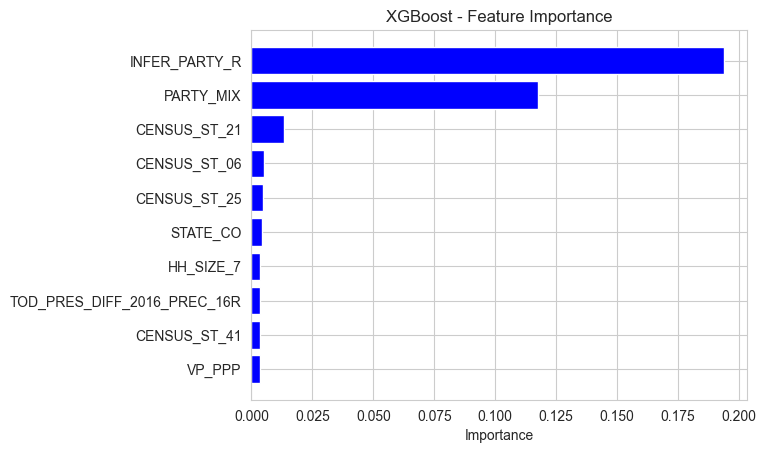

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 62.52 seconds to run.
Running ablation by excluding feature: DON_ANML
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


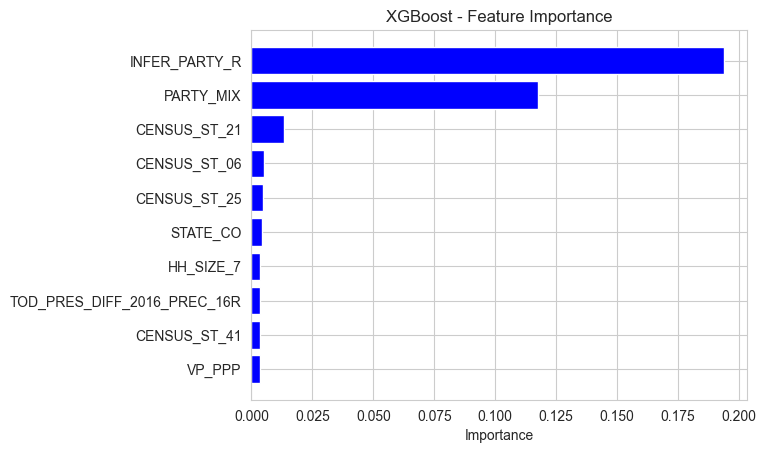

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 63.56 seconds to run.
Running ablation by excluding feature: DON_ARTCUL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


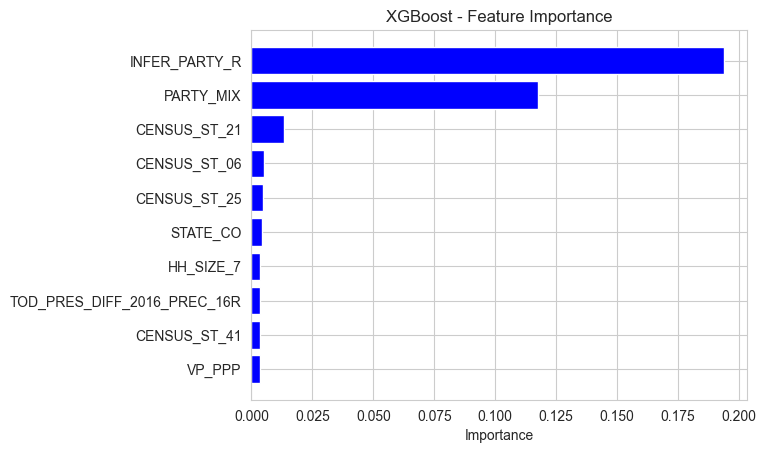

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.17 seconds to run.
Running ablation by excluding feature: DON_CHARIT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


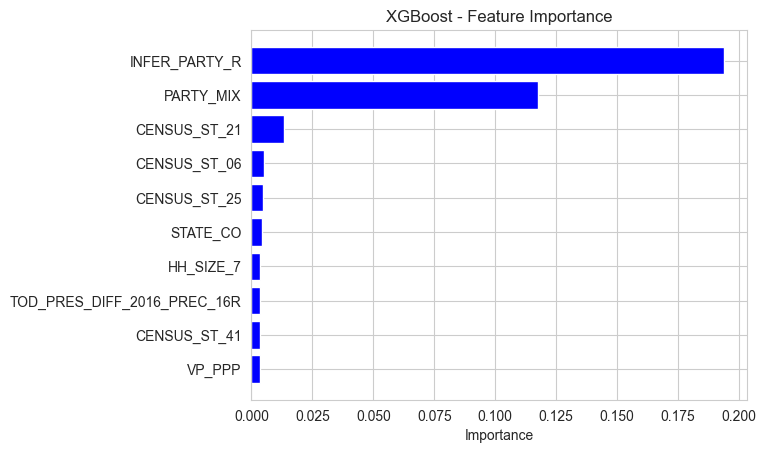

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.35 seconds to run.
Running ablation by excluding feature: DON_CHILD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


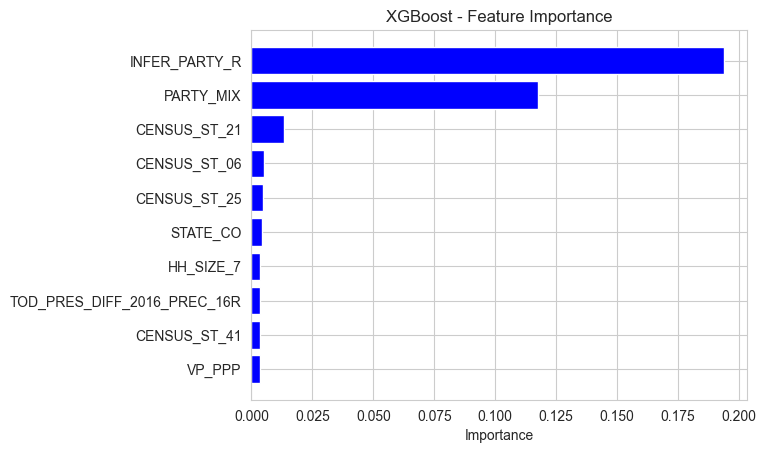

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.24 seconds to run.
Running ablation by excluding feature: DON_ENVIR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


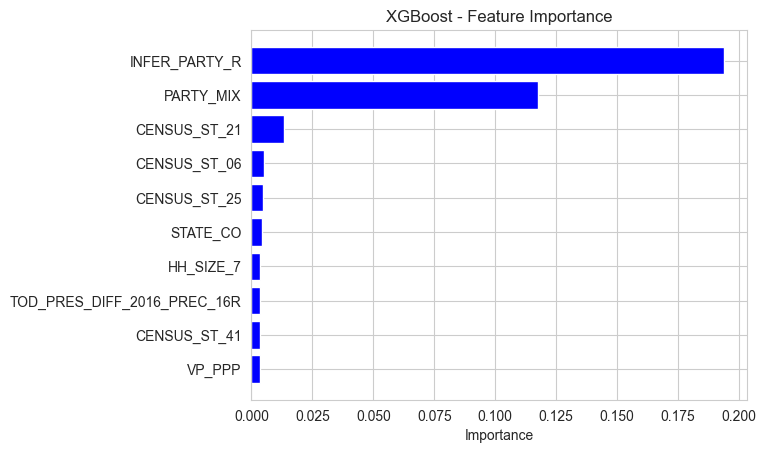

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.84 seconds to run.
Running ablation by excluding feature: DON_ENVWLD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


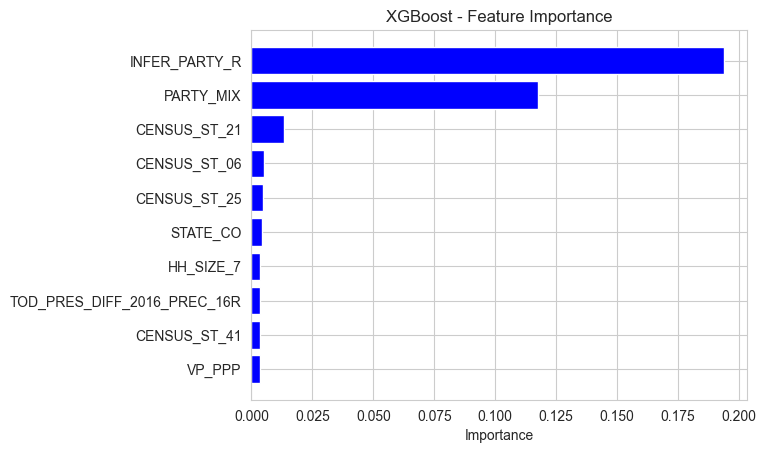

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 62.18 seconds to run.
Running ablation by excluding feature: DON_HEALTH
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


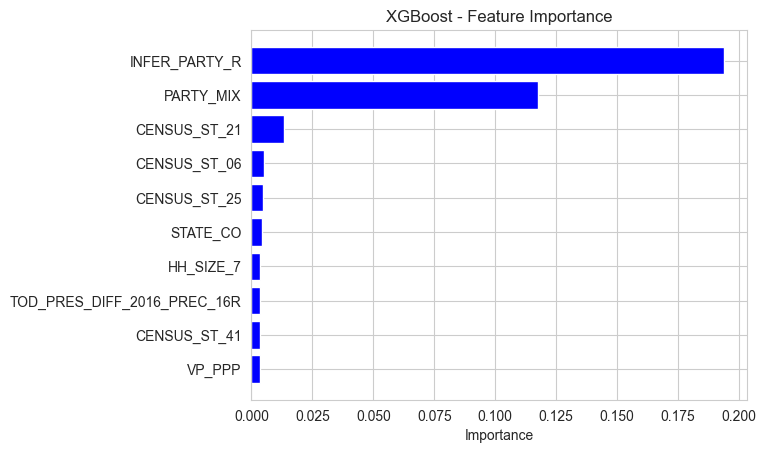

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 62.08 seconds to run.
Running ablation by excluding feature: DON_INTAID
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


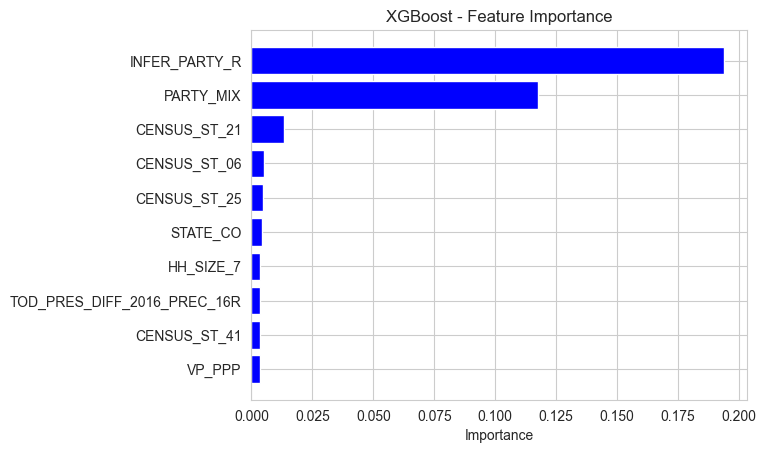

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 7307.20 seconds to run.
Running ablation by excluding feature: DON_OTHER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


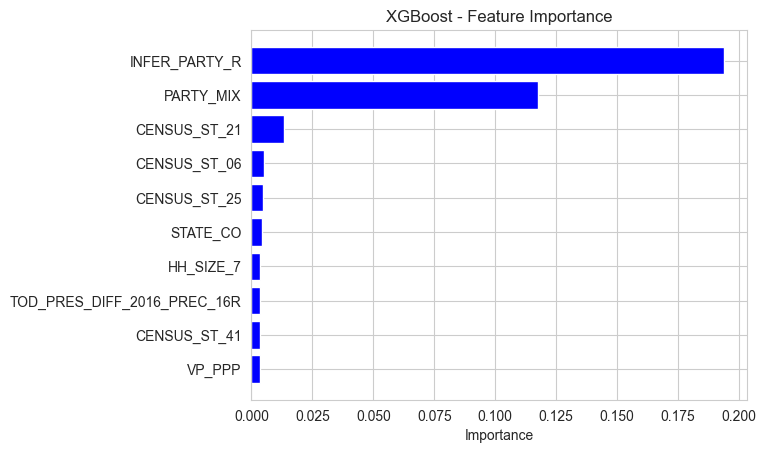

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 17716.45 seconds to run.
Running ablation by excluding feature: DON_POLCONS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


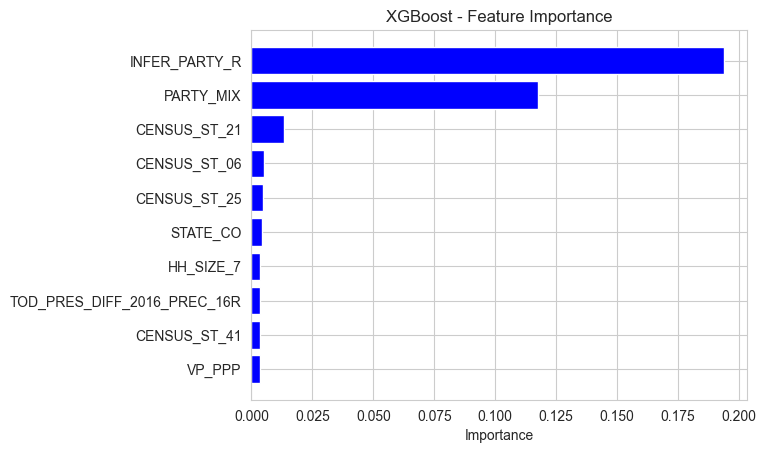

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 3731.87 seconds to run.
Running ablation by excluding feature: DON_POLIT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


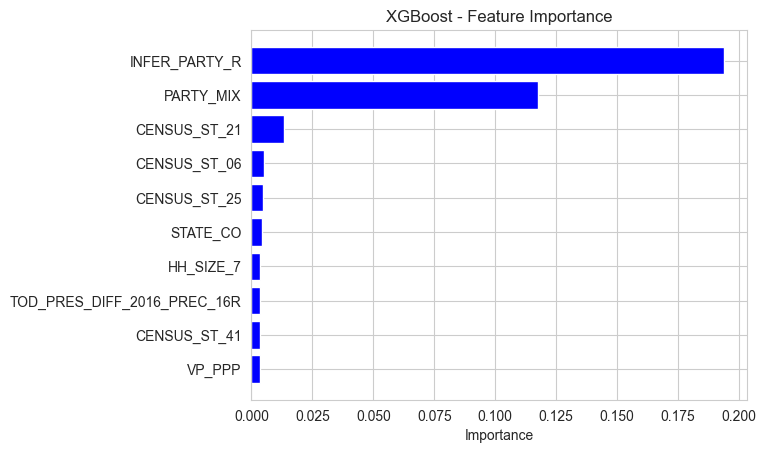

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 1099.58 seconds to run.
Running ablation by excluding feature: DON_POLLIB
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


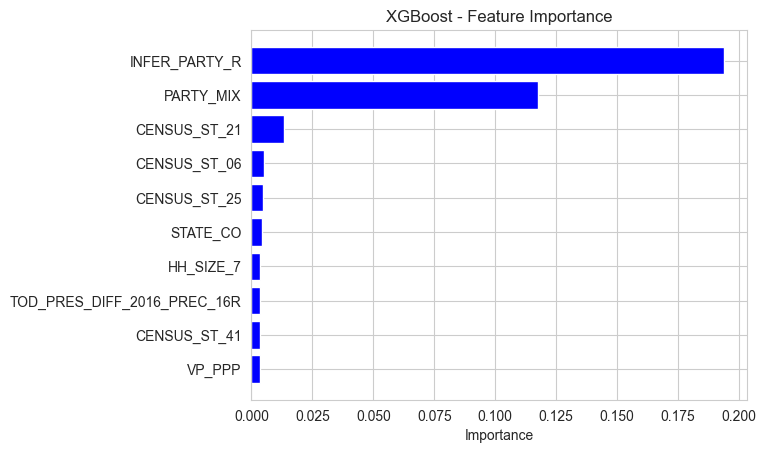

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 2922.82 seconds to run.
Running ablation by excluding feature: DON_RELIG
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


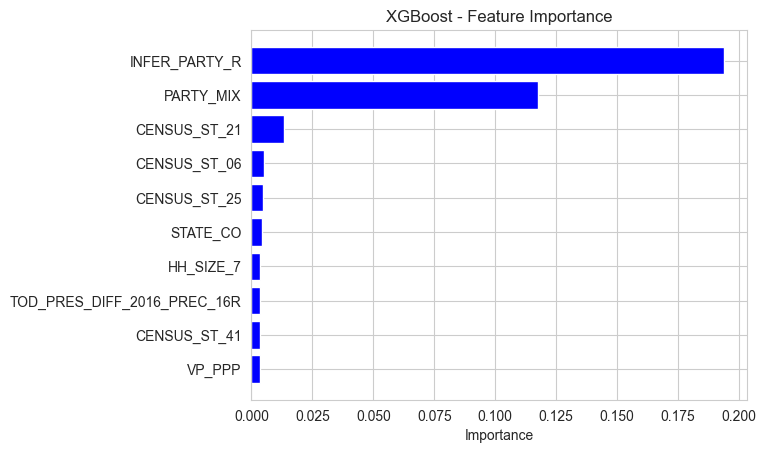

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 920.03 seconds to run.
Running ablation by excluding feature: DON_VET
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


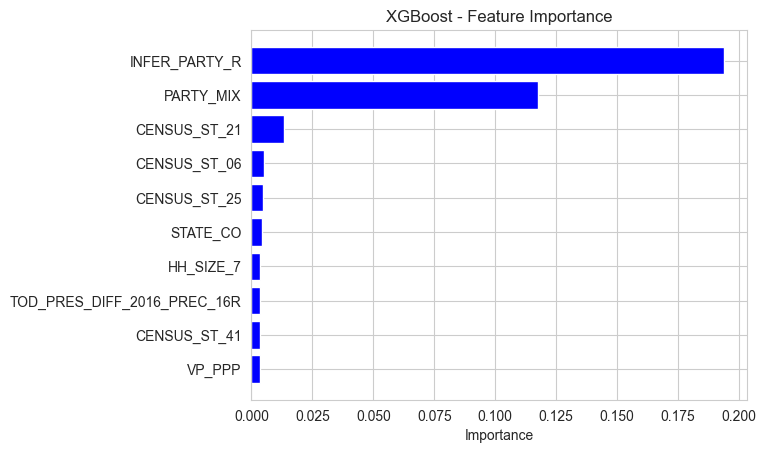

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 49.53 seconds to run.
Running ablation by excluding feature: DONATION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


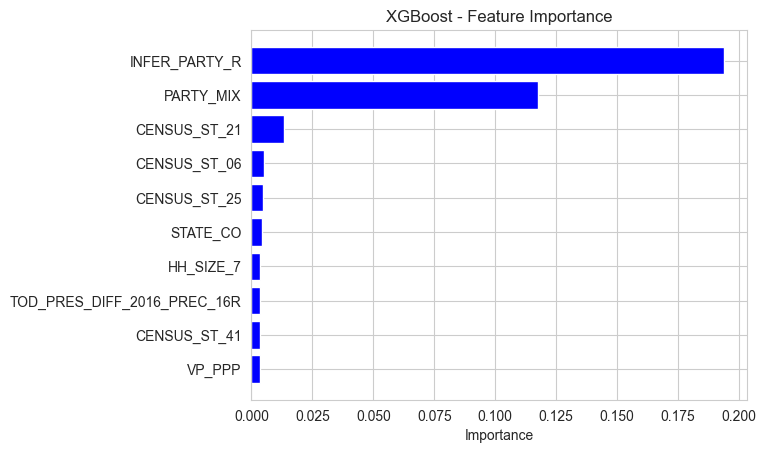

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 48.33 seconds to run.
Running ablation by excluding feature: EDU_ONLINE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


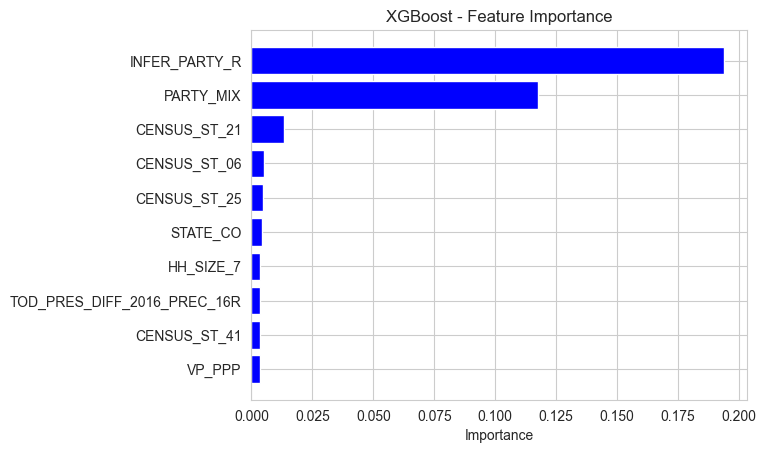

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 49.93 seconds to run.
Running ablation by excluding feature: EDUCATION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


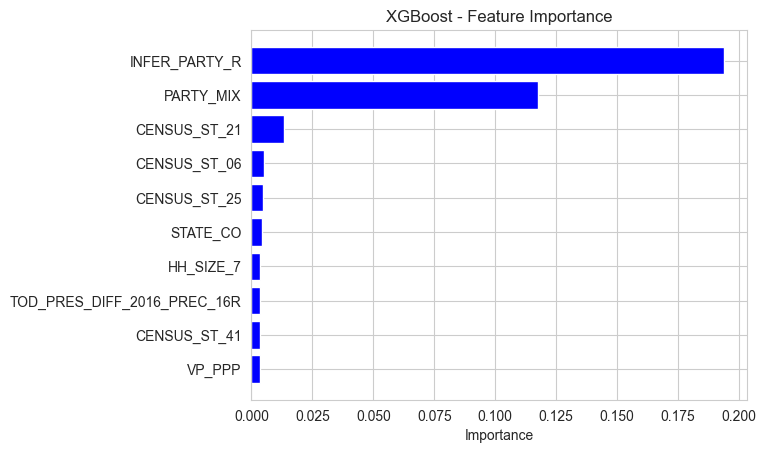

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 47.83 seconds to run.
Running ablation by excluding feature: EQUESTRIAN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


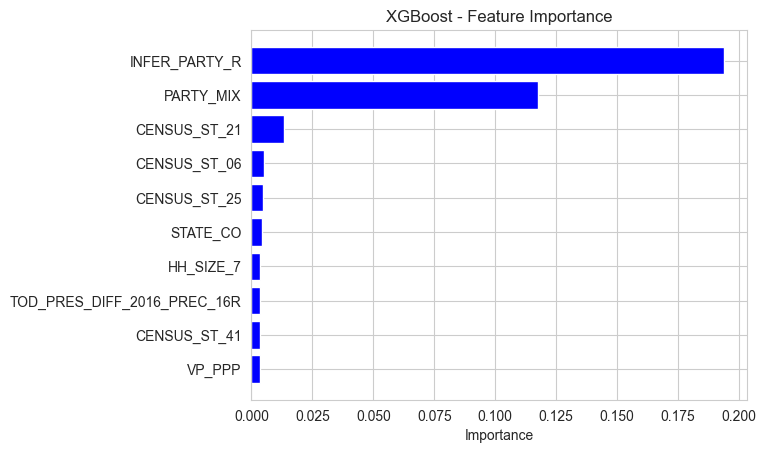

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 49.81 seconds to run.
Running ablation by excluding feature: ETHNIC_INFER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


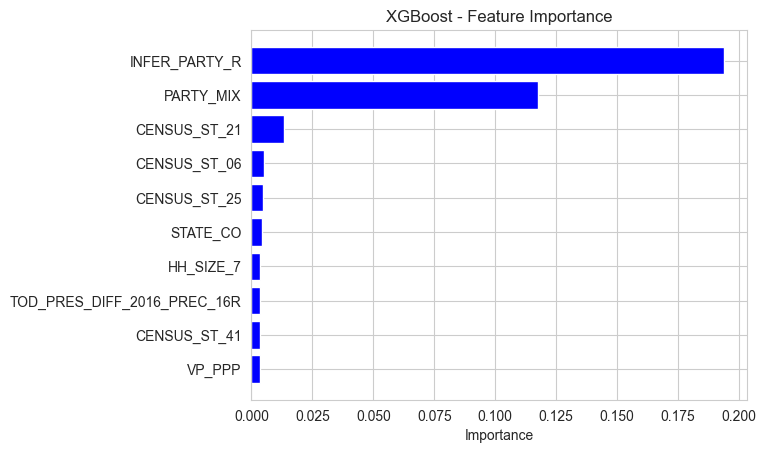

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 49.02 seconds to run.
Running ablation by excluding feature: ETHNICCODE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


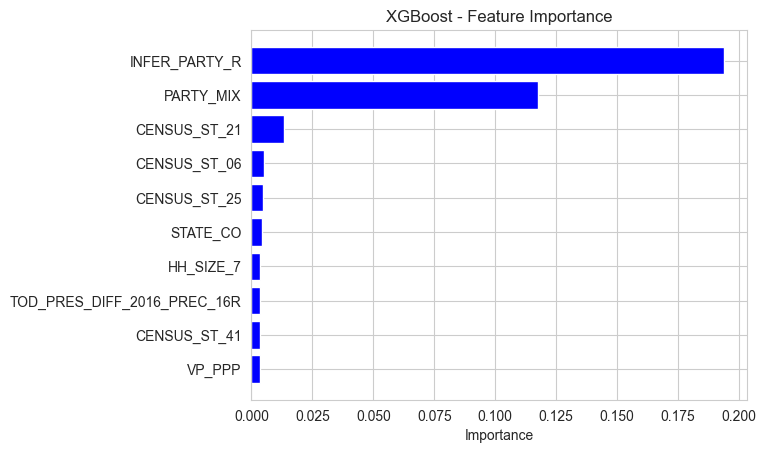

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 50.14 seconds to run.
Running ablation by excluding feature: ETHNICCONF
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


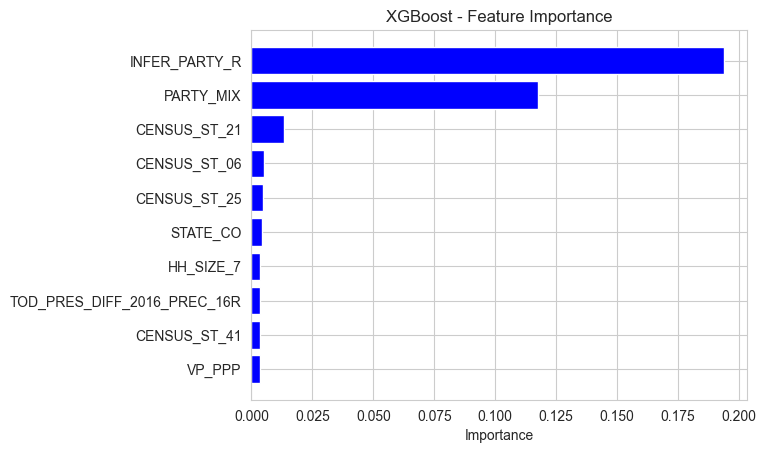

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 49.57 seconds to run.
Running ablation by excluding feature: ETHNICGRP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


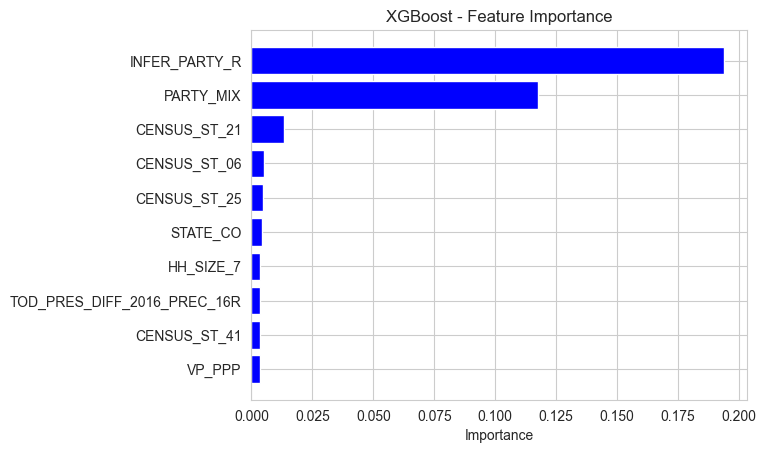

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 48.57 seconds to run.
Running ablation by excluding feature: EXER_GROUP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


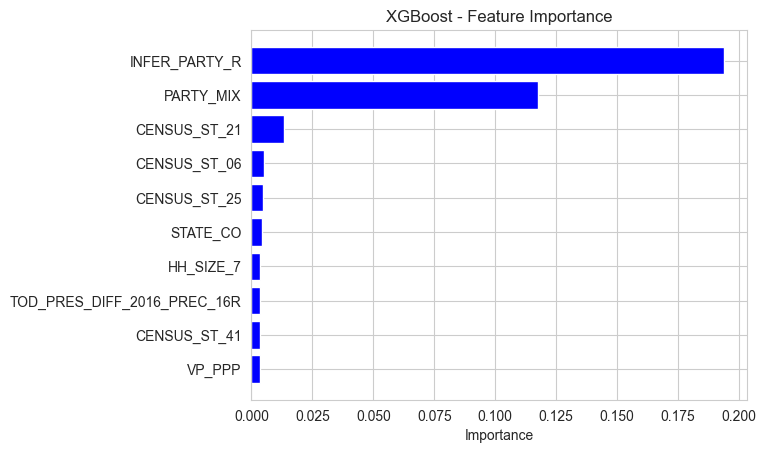

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 49.29 seconds to run.
Running ablation by excluding feature: FUND_POLIT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


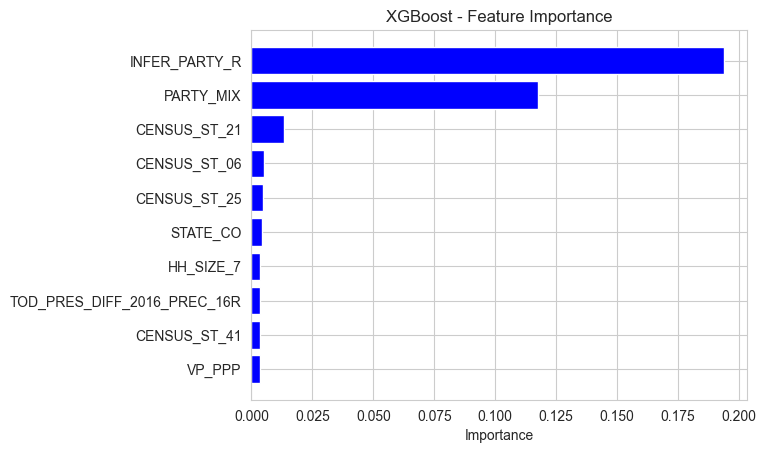

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 48.95 seconds to run.
Running ablation by excluding feature: GAMING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


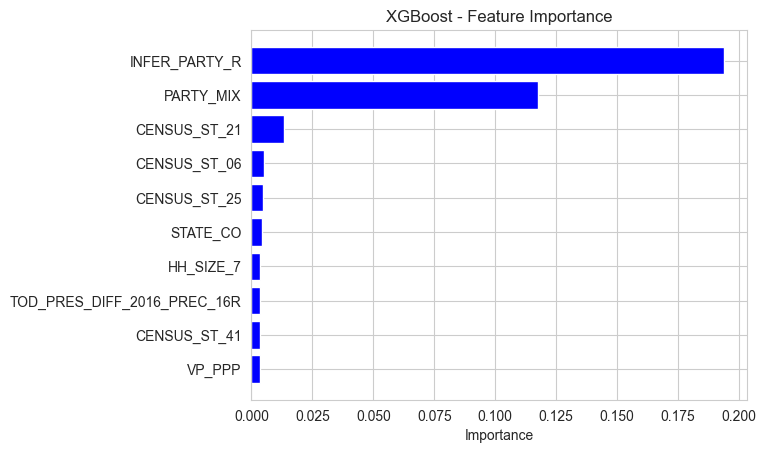

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 52.51 seconds to run.
Running ablation by excluding feature: GARDENER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


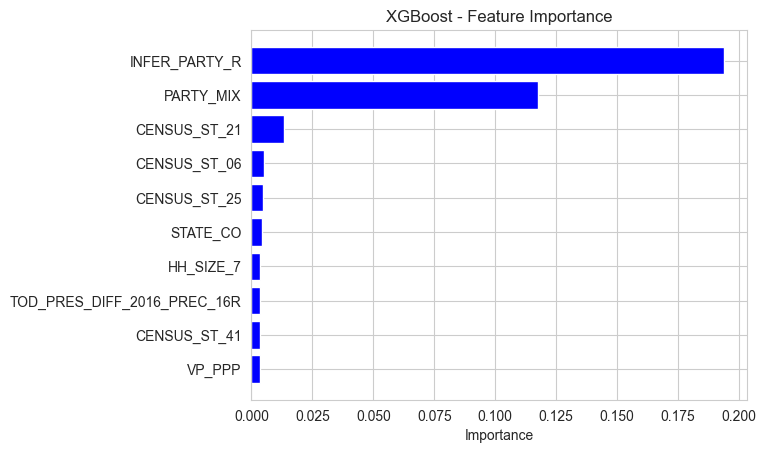

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 52.50 seconds to run.
Running ablation by excluding feature: GENDER_MIX
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


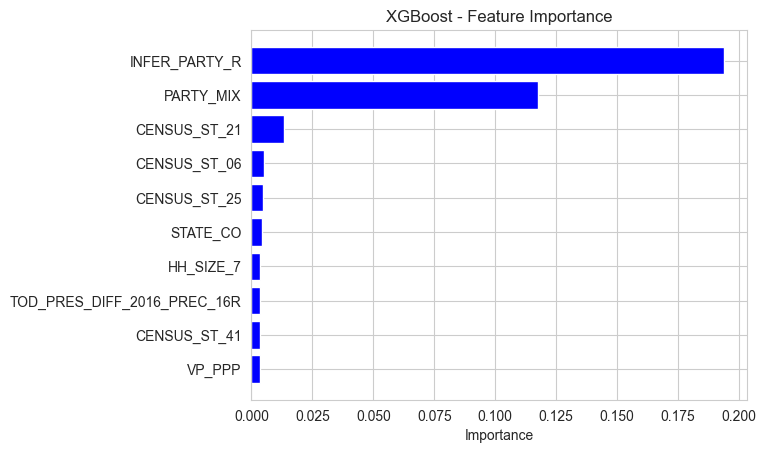

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 51.86 seconds to run.
Running ablation by excluding feature: GENERATION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


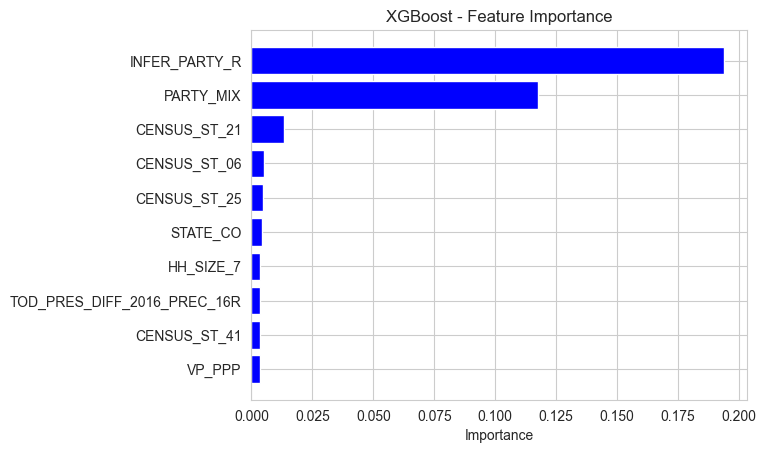

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 51.10 seconds to run.
Running ablation by excluding feature: GOLF
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


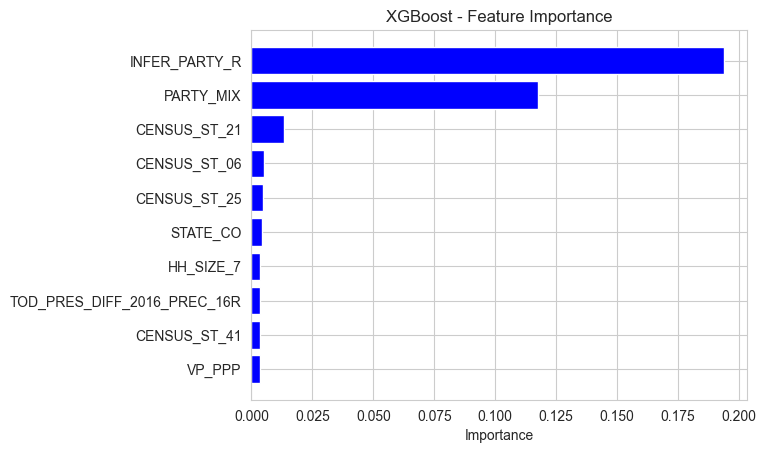

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 53.25 seconds to run.
Running ablation by excluding feature: GRANDCHLD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


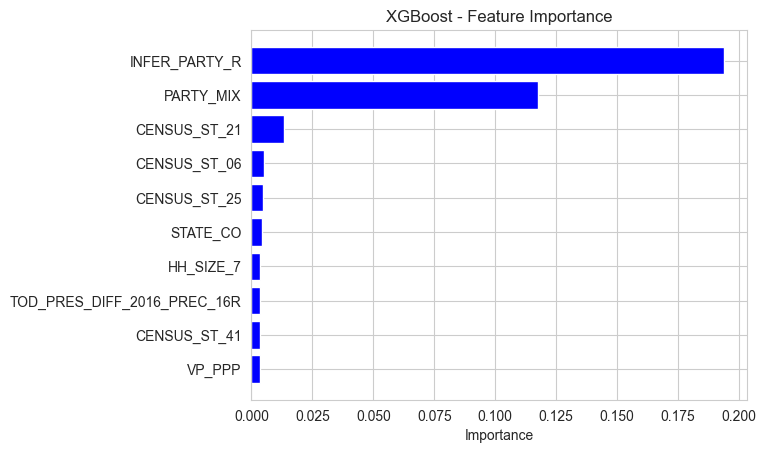

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 56.70 seconds to run.
Running ablation by excluding feature: HEALTHBEAU
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


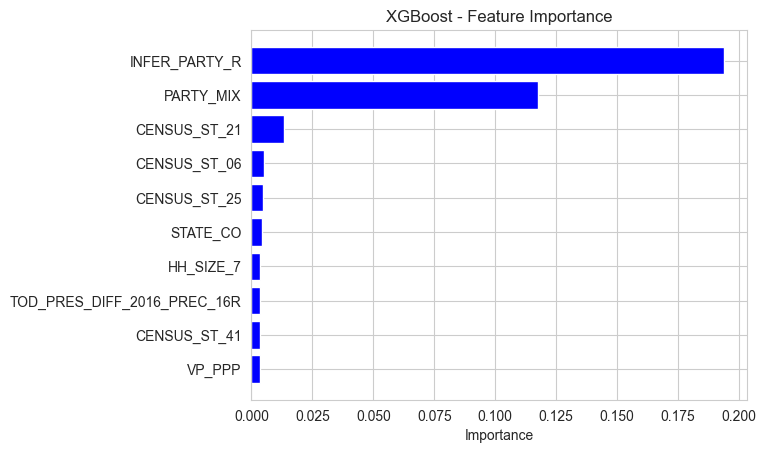

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 58.96 seconds to run.
Running ablation by excluding feature: HEATHMED
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


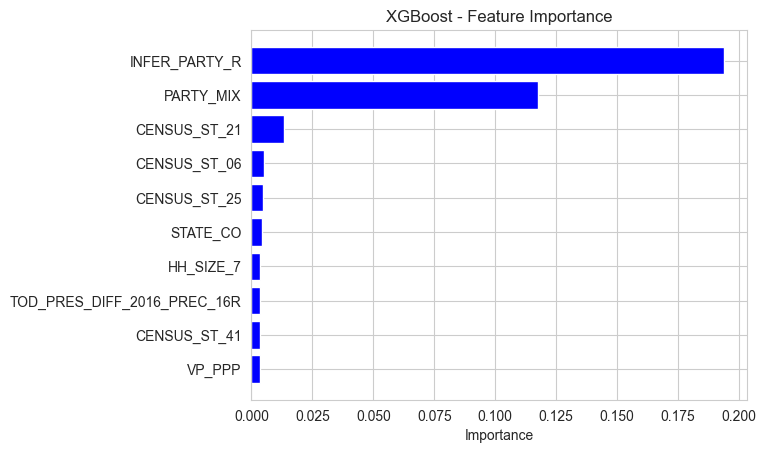

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 57.25 seconds to run.
Running ablation by excluding feature: HH_NUMGEN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


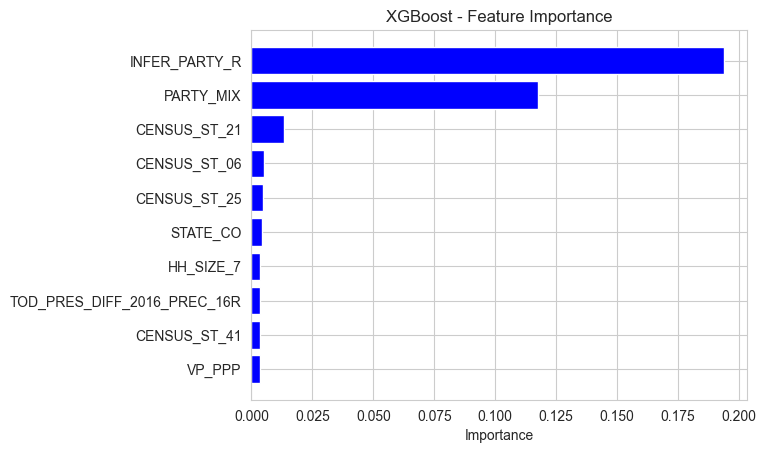

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 63.13 seconds to run.
Running ablation by excluding feature: HH_SENIOR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


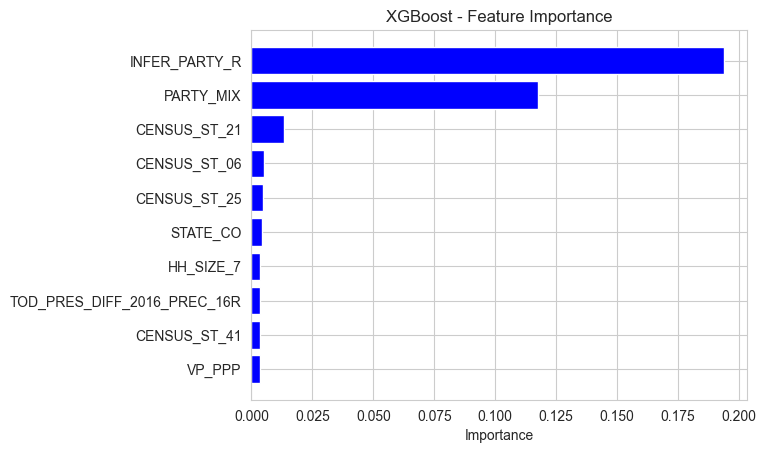

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 56.56 seconds to run.
Running ablation by excluding feature: HH_SIZE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


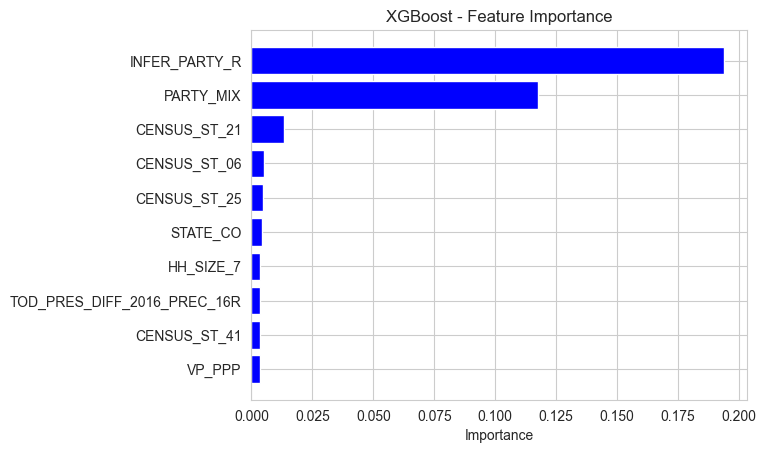

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 56.22 seconds to run.
Running ablation by excluding feature: HH_VETERAN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


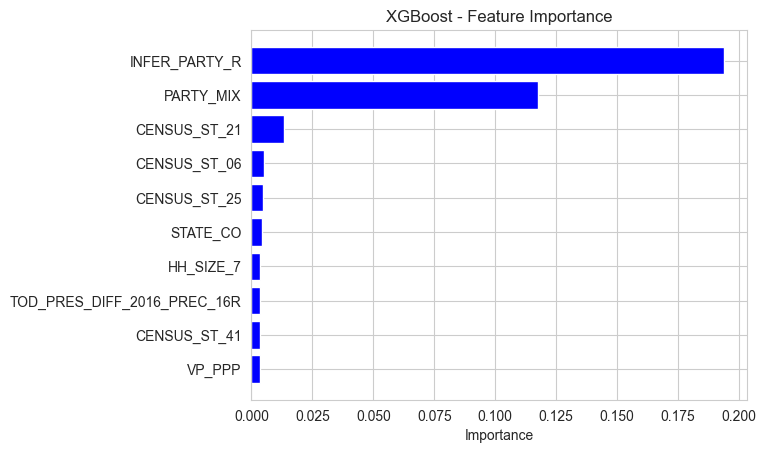

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.22 seconds to run.
Running ablation by excluding feature: HH_YOUNGAD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


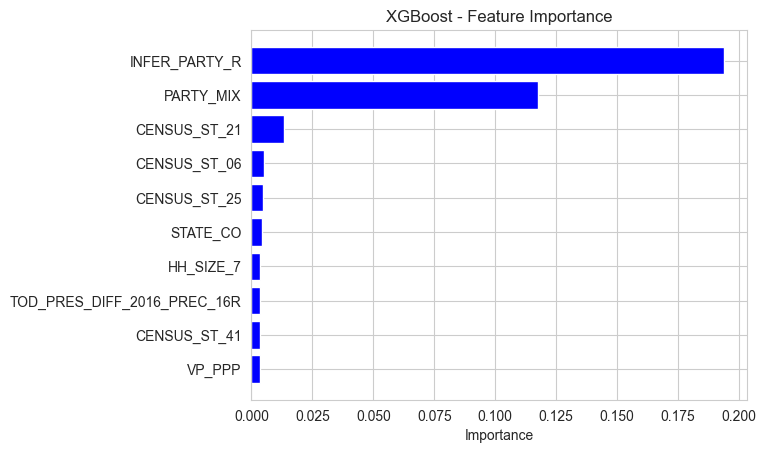

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.05 seconds to run.
Running ablation by excluding feature: HIGHBROW
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


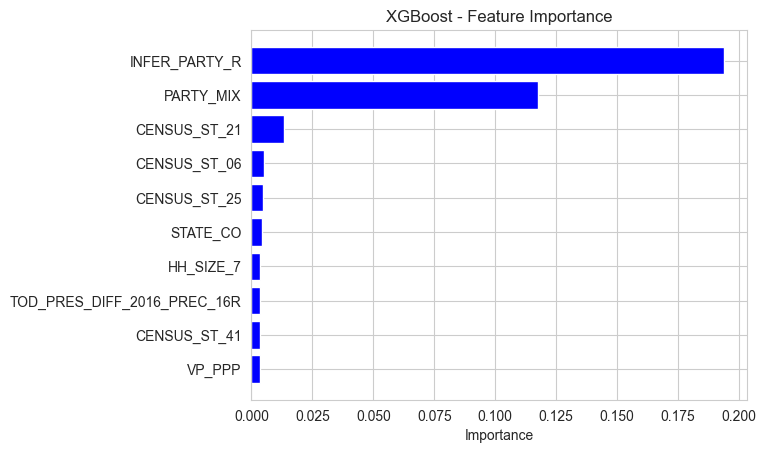

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 76.09 seconds to run.
Running ablation by excluding feature: HIGHENDAPP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


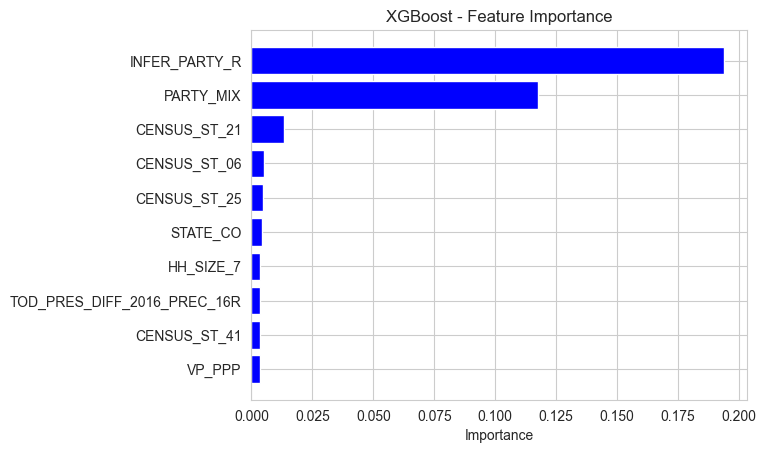

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 66.83 seconds to run.
Running ablation by excluding feature: HISTMIL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


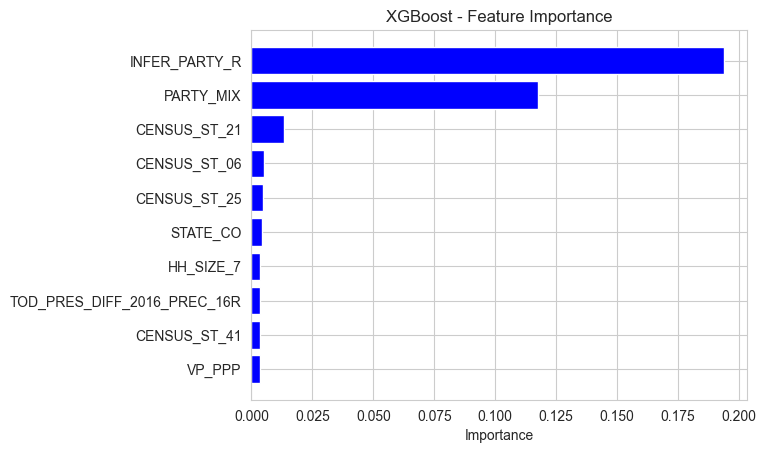

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.94 seconds to run.
Running ablation by excluding feature: HITECHLIV
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


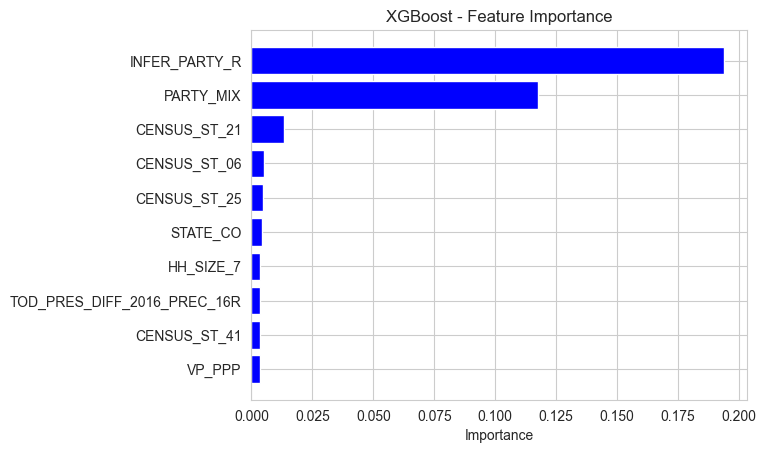

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.61 seconds to run.
Running ablation by excluding feature: HOME_DECOR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


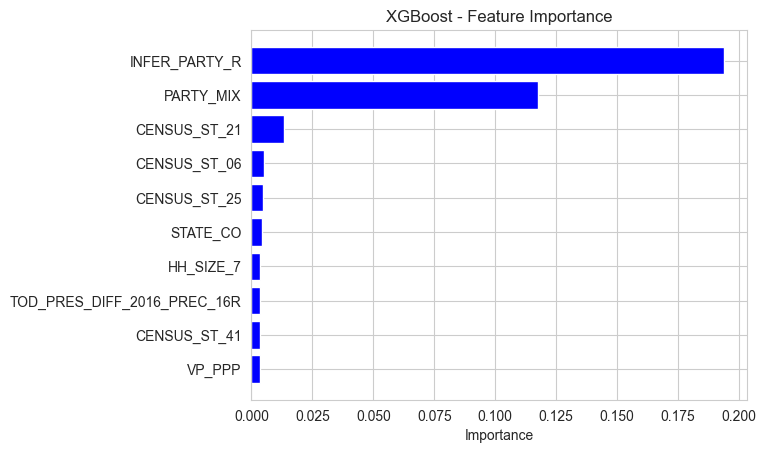

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 62.77 seconds to run.
Running ablation by excluding feature: HOMEMKTVAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


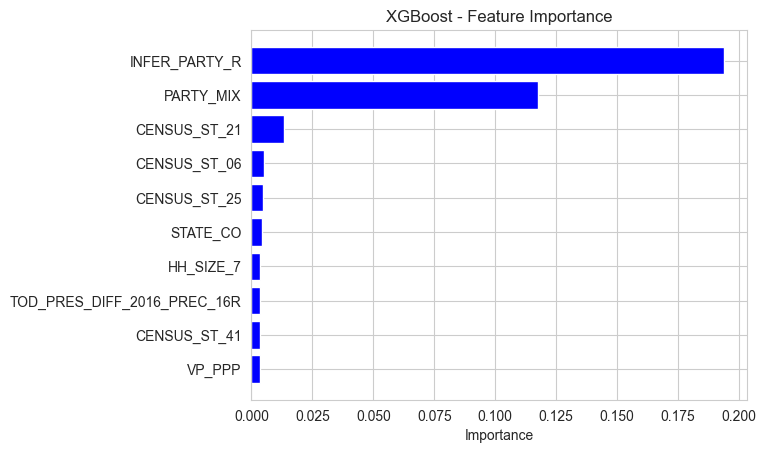

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 65.32 seconds to run.
Running ablation by excluding feature: HOMEOFFICE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


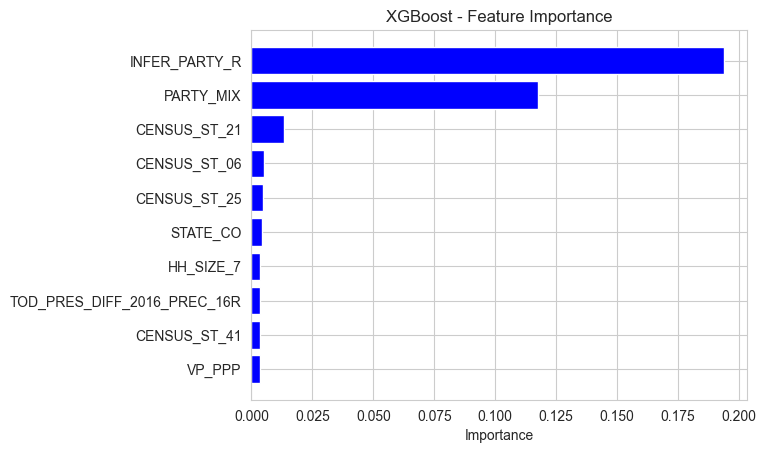

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.13 seconds to run.
Running ablation by excluding feature: HOMEOWNER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


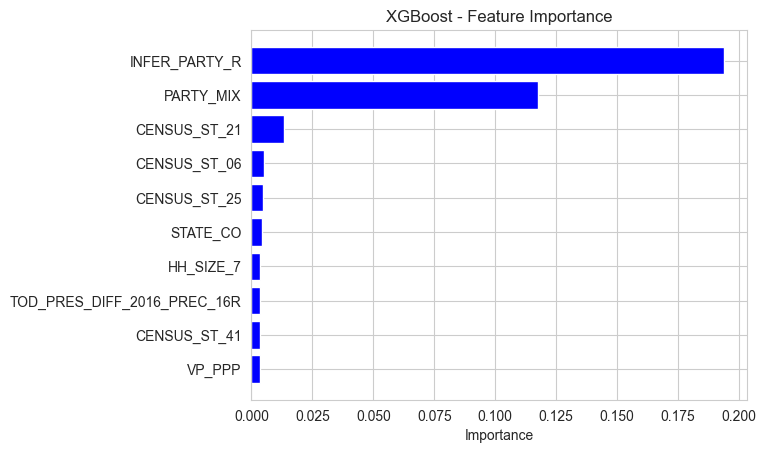

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 59.72 seconds to run.
Running ablation by excluding feature: HOMEOWNRNT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


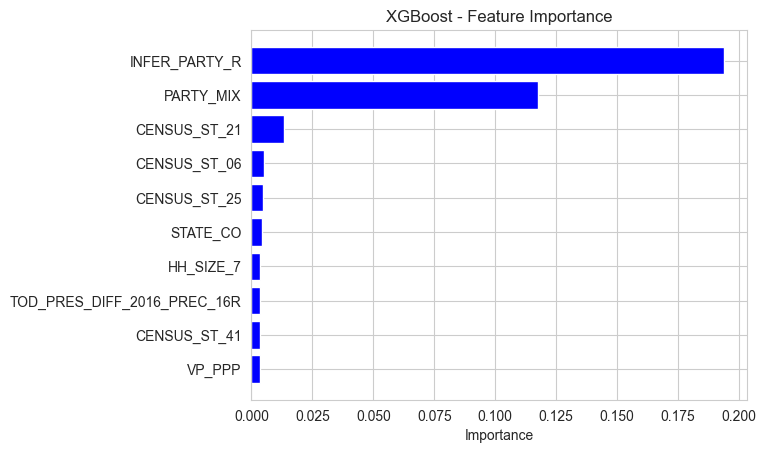

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 66.42 seconds to run.
Running ablation by excluding feature: HUNTING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


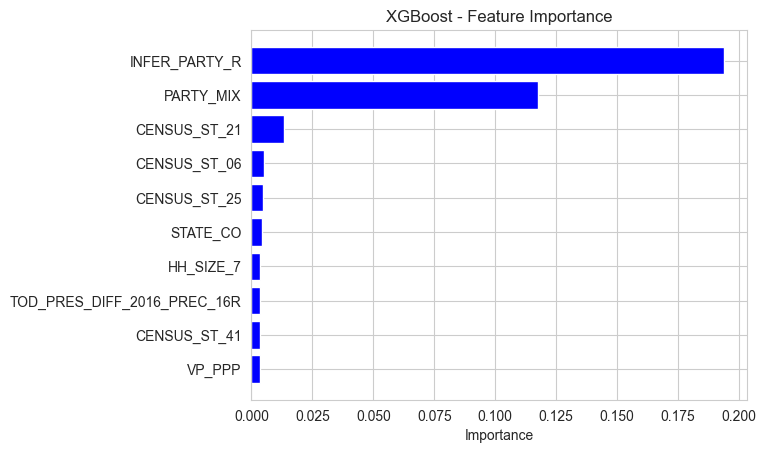

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 64.25 seconds to run.
Running ablation by excluding feature: HUNTSHOOT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


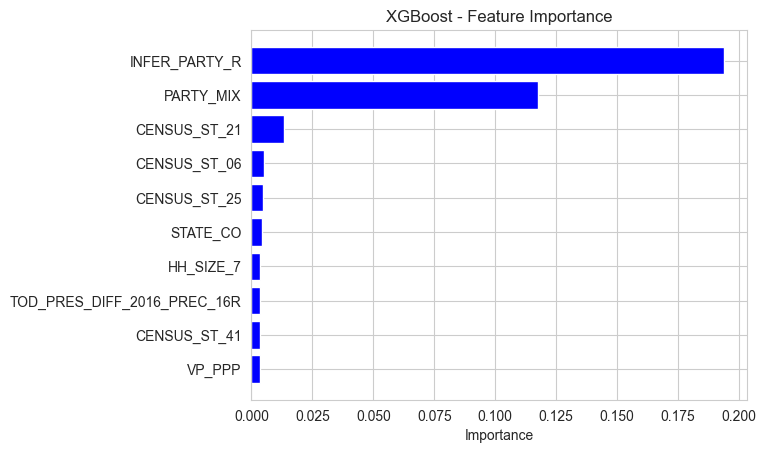

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 63.65 seconds to run.
Running ablation by excluding feature: INCOMESTHH
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


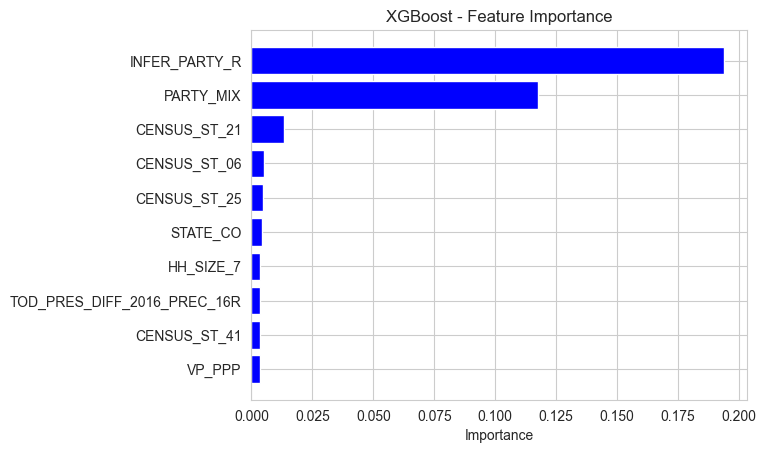

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.68 seconds to run.
Running ablation by excluding feature: INV_ACTIVE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


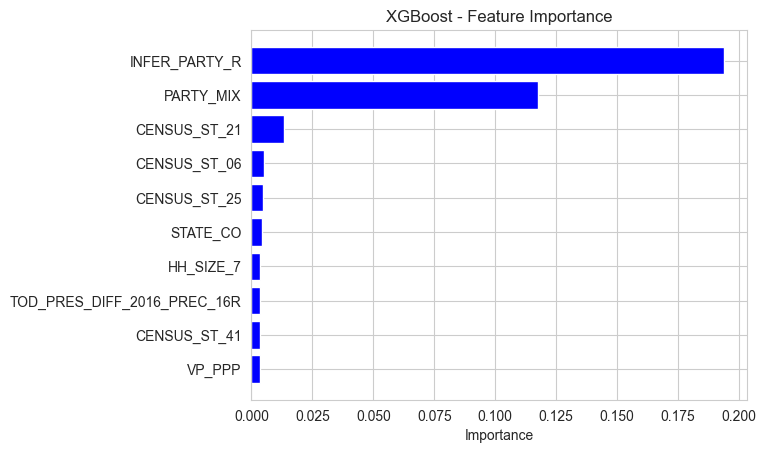

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 60.80 seconds to run.
Running ablation by excluding feature: LANGUAGE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


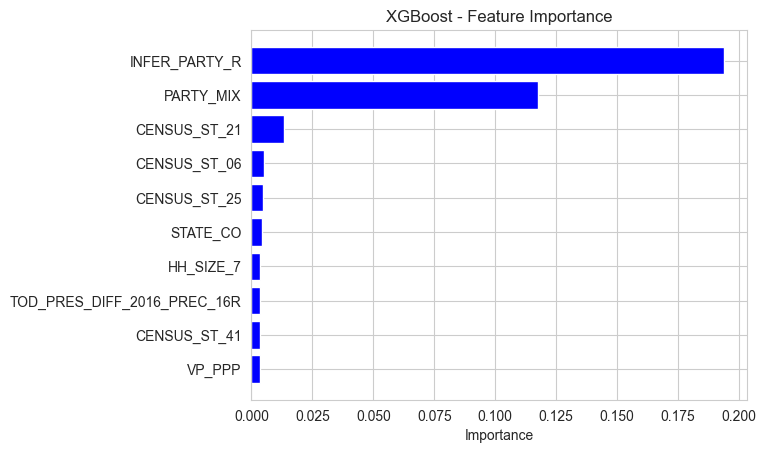

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.21 seconds to run.
Running ablation by excluding feature: LENGTH_RES
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


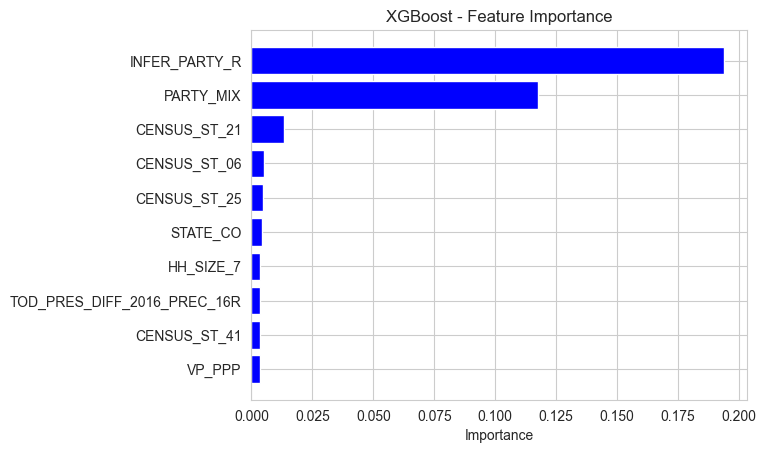

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 62.95 seconds to run.
Running ablation by excluding feature: LIFESTAGE_CLUSTER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


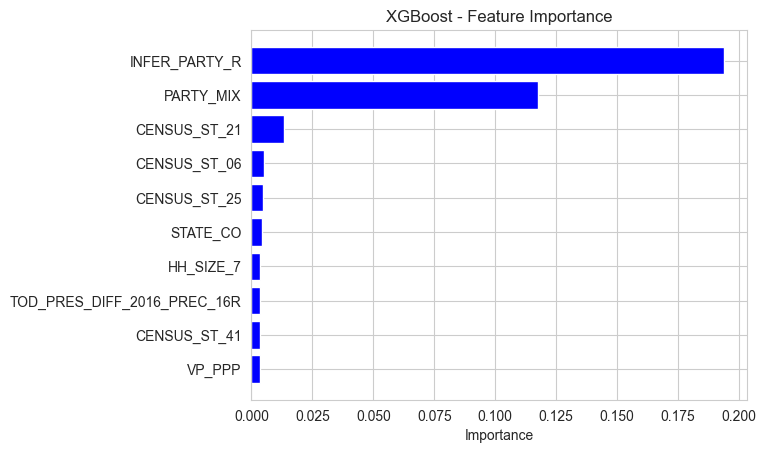

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 147.80 seconds to run.
Running ablation by excluding feature: MAIL_DONOR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


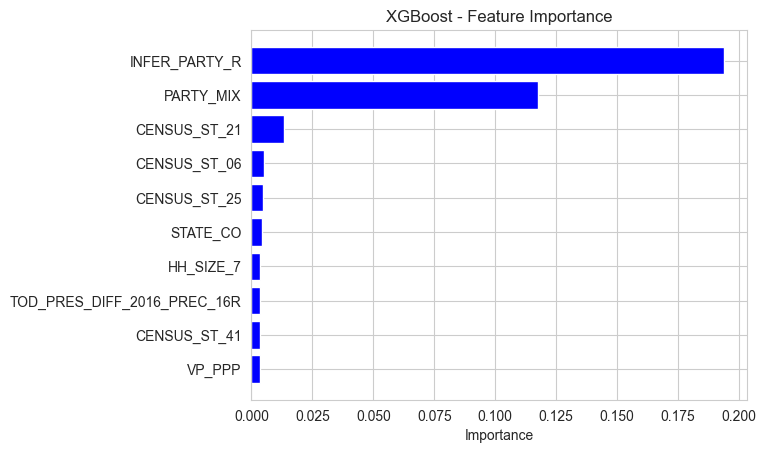

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 147.33 seconds to run.
Running ablation by excluding feature: MAILORDBUY
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


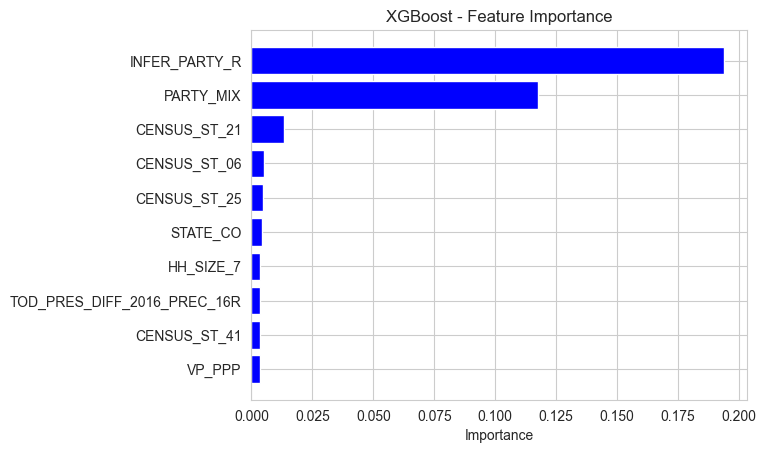

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 115.13 seconds to run.
Running ablation by excluding feature: MAILORDRSP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


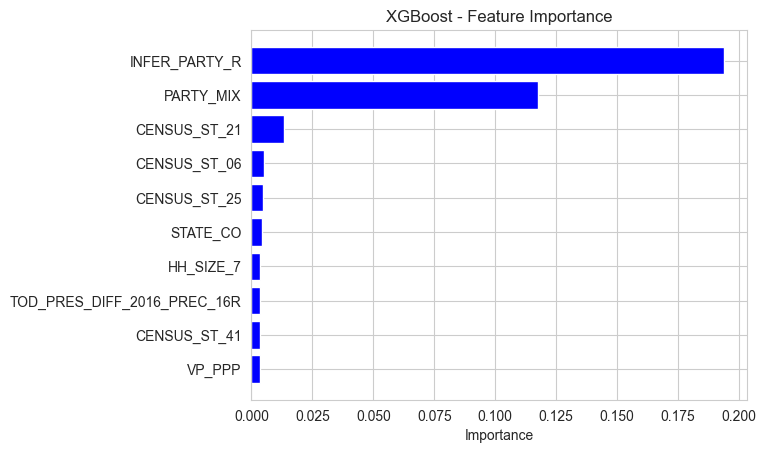

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 112.56 seconds to run.
Running ablation by excluding feature: MOTORCYCLE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


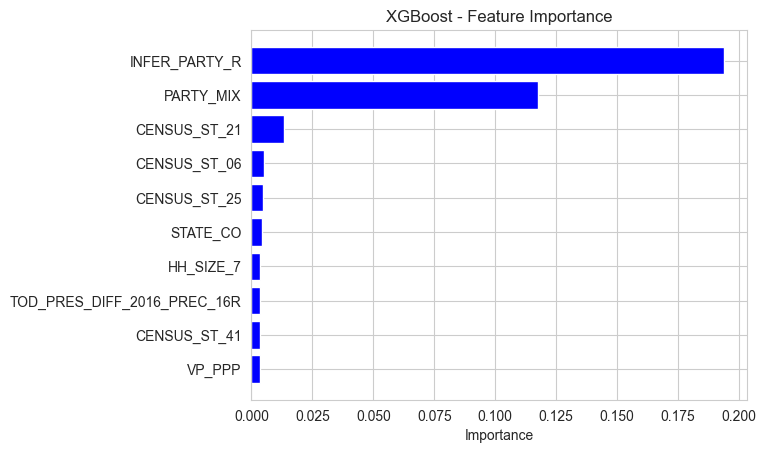

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 107.14 seconds to run.
Running ablation by excluding feature: NASCAR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


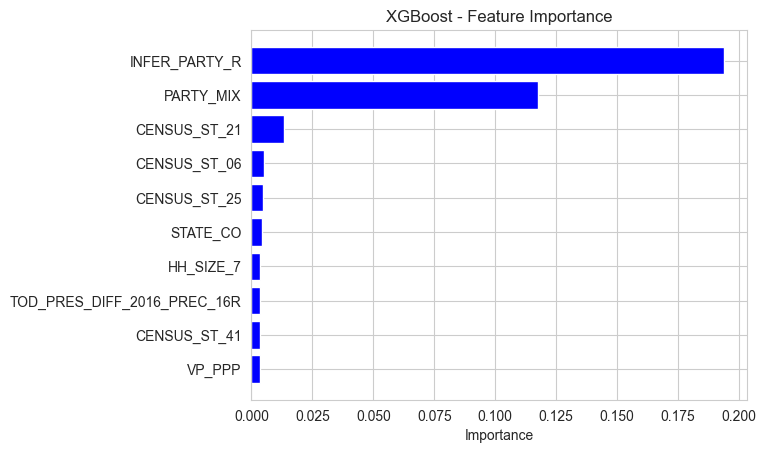

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 143.52 seconds to run.
Running ablation by excluding feature: NETWORTH
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


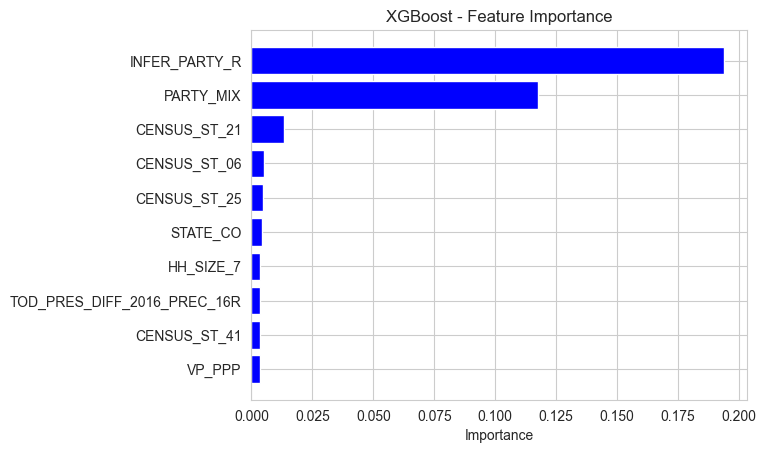

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 166.31 seconds to run.
Running ablation by excluding feature: NUMCHILD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


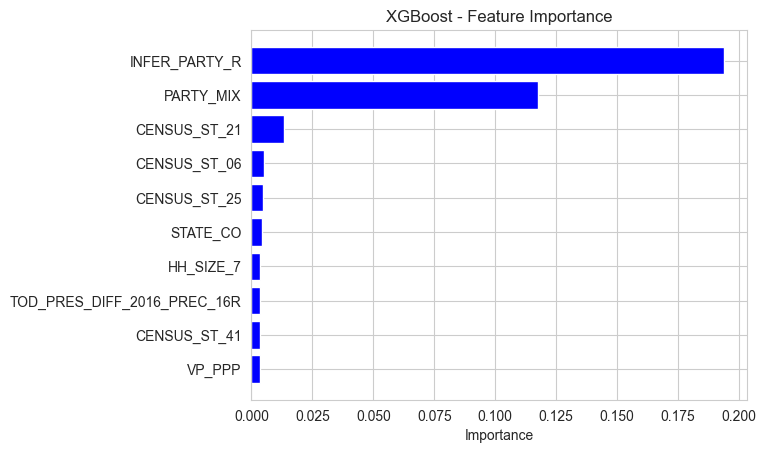

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 169.12 seconds to run.
Running ablation by excluding feature: OCCDETAIL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


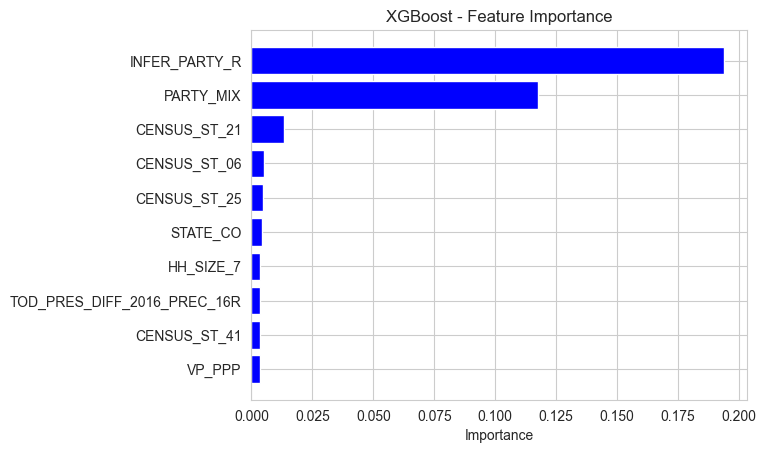

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 172.93 seconds to run.
Running ablation by excluding feature: OCCUPATION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


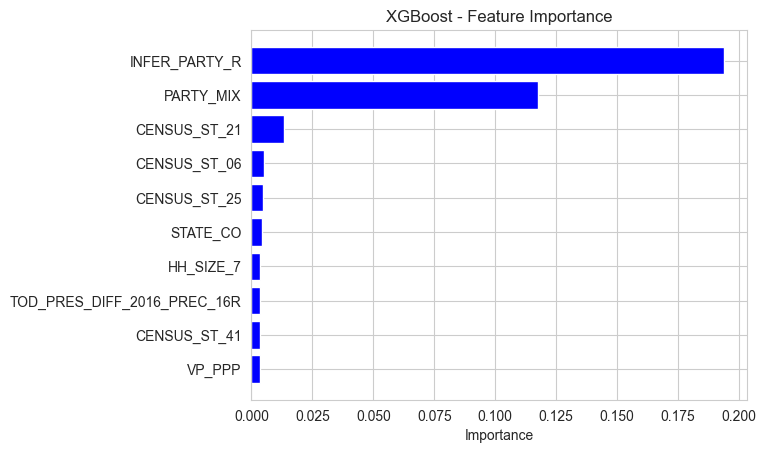

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 173.43 seconds to run.
Running ablation by excluding feature: PARENTING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


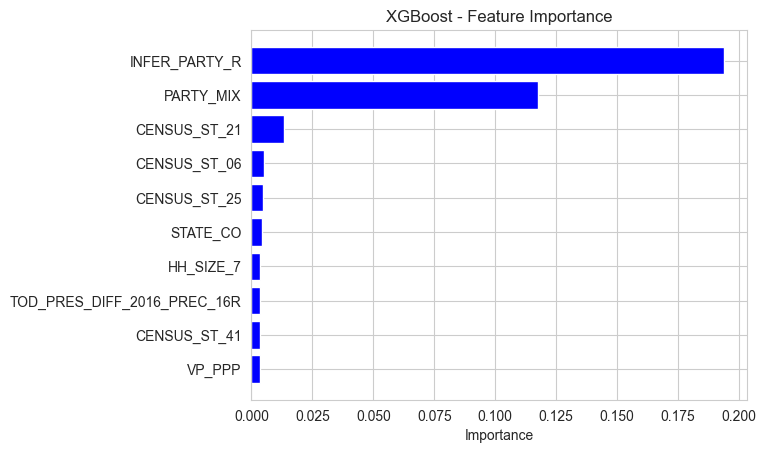

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 184.13 seconds to run.
Running ablation by excluding feature: PARTY_MIX
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.23336485028266907
STATE_CO: 0.017048301175236702
VP_PPP: 0.016903625801205635
CENSUS_ST_25: 0.011735673993825912
CENSUS_ST_21: 0.010432830080389977
PRFL_MINWAGE: 0.010006058029830456
CENSUS_ST_42: 0.007864449173212051
CENSUS_ST_37: 0.006560212466865778
ETHNIC_INFER_B: 0.005770729389041662
AI_COUNTY_NAME_ALAMEDA: 0.002899216255173087


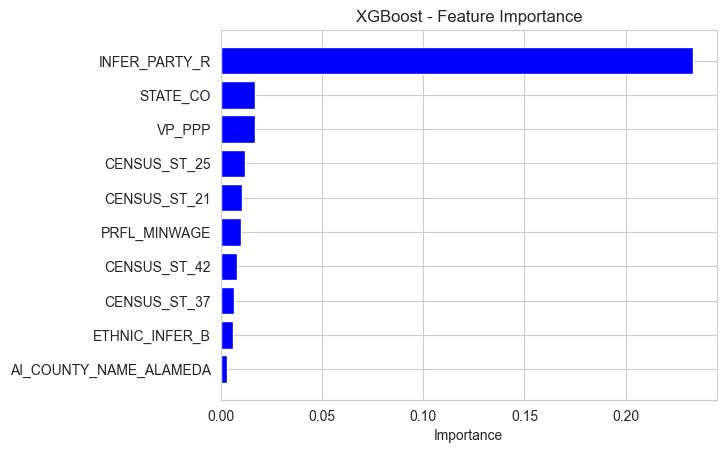

Run 1 - Accuracy: 0.7891, F1 Score: 0.7770394756057757, Recall: 0.7891
Function run_xgboost_all_columns took 159.50 seconds to run.
Running ablation by excluding feature: PERSONS_HH
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


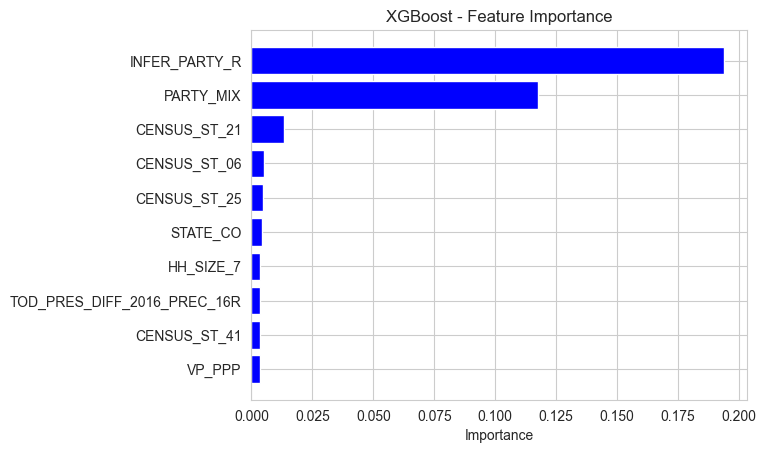

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 129.26 seconds to run.
Running ablation by excluding feature: PETS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


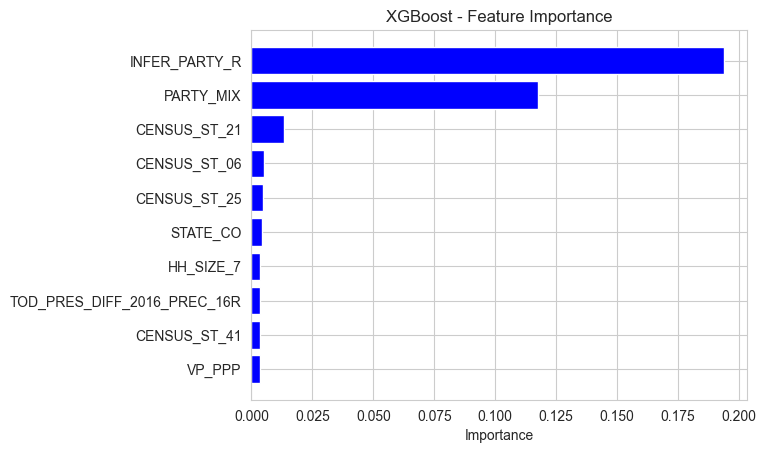

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 151.23 seconds to run.
Running ablation by excluding feature: POOL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


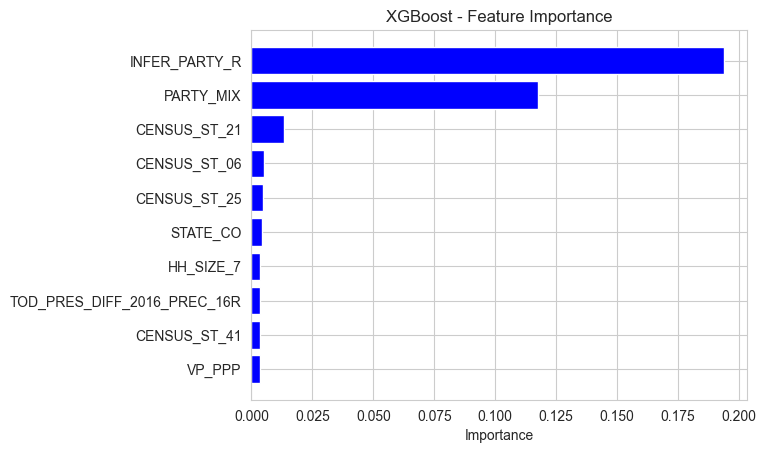

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 151.89 seconds to run.
Running ablation by excluding feature: PRESENCHLD
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


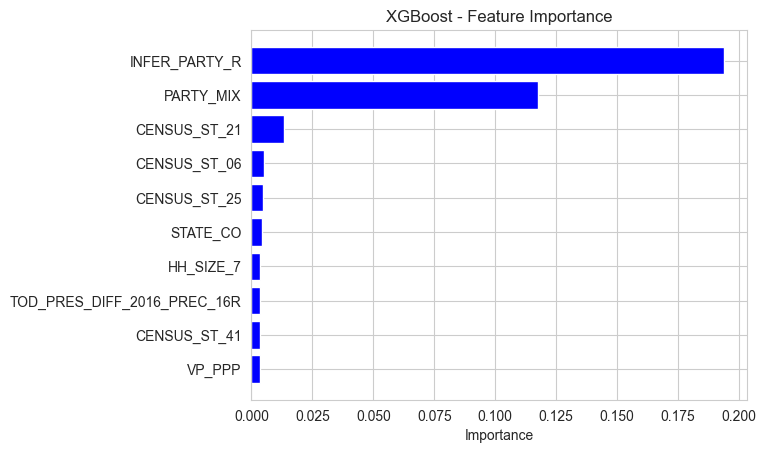

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 148.14 seconds to run.
Running ablation by excluding feature: PRFL_2NDAMEND
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


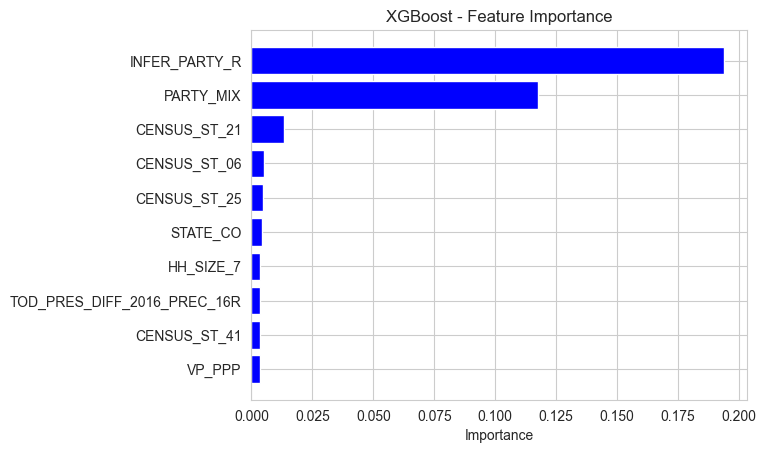

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 143.46 seconds to run.
Running ablation by excluding feature: PRFL_ACTIVE_MIL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


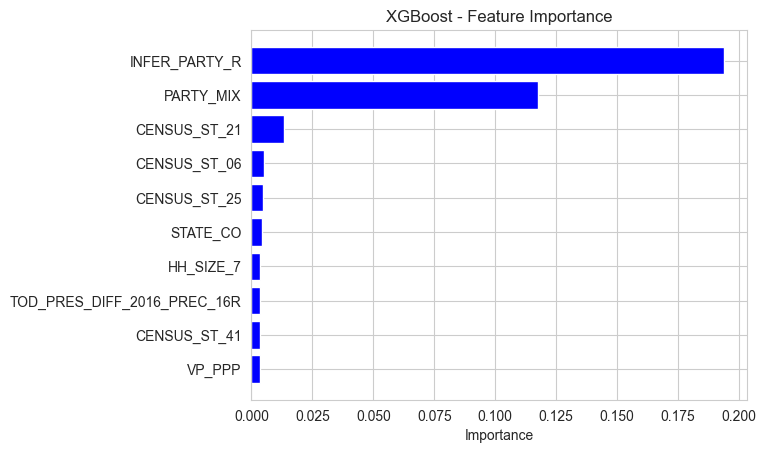

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 151.96 seconds to run.
Running ablation by excluding feature: PRFL_AMZN_PRIME
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


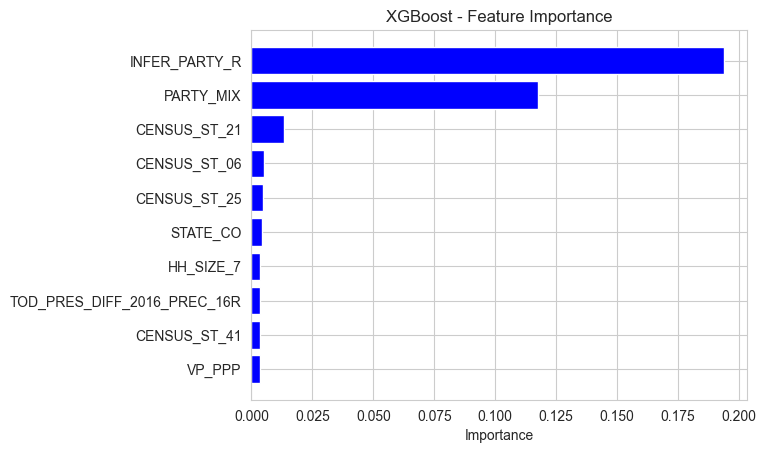

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 118.99 seconds to run.
Running ablation by excluding feature: PRFL_ANML_RIGHTS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


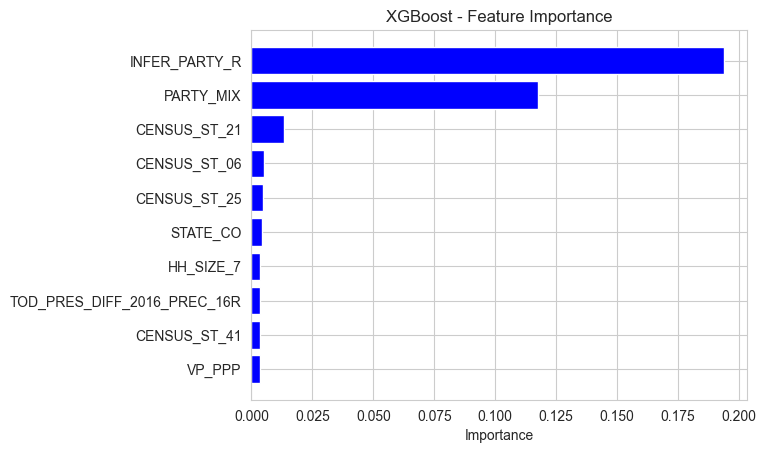

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 119.74 seconds to run.
Running ablation by excluding feature: PRFL_BLM_SUPPORT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


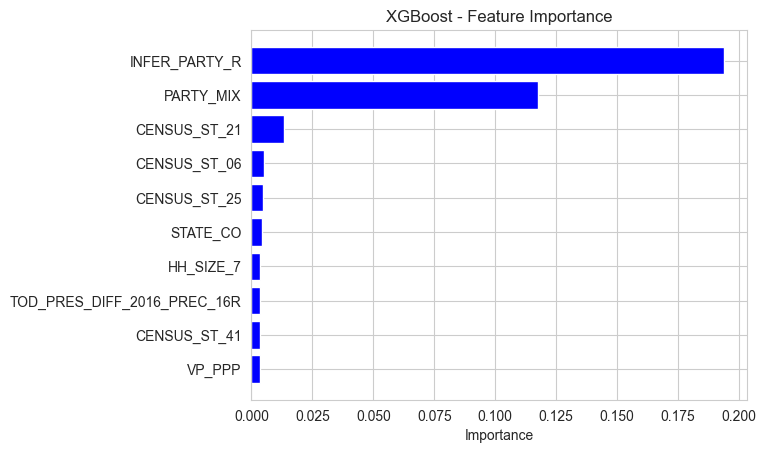

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 121.33 seconds to run.
Running ablation by excluding feature: PRFL_CHOICELIFE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.18981006741523743
PARTY_MIX: 0.1129443421959877
CENSUS_ST_21: 0.013708432205021381
CENSUS_ST_06: 0.004941815976053476
STATE_CO: 0.0041247522458434105
CENSUS_ST_25: 0.003958378452807665
VP_PPP: 0.003494508098810911
HH_SIZE_7: 0.0034411775413900614
TOD_PRES_DIFF_2016_PREC_16R: 0.0034237324725836515
CENSUS_ST_41: 0.003296623006463051


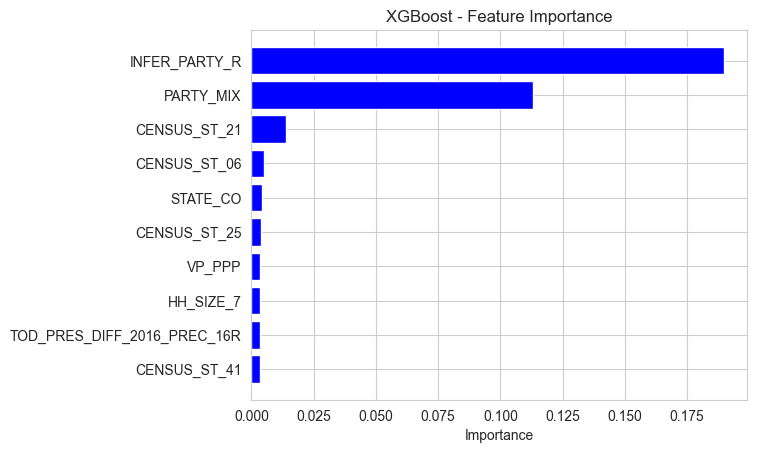

Run 1 - Accuracy: 0.9345, F1 Score: 0.9222808089495931, Recall: 0.9345
Function run_xgboost_all_columns took 121.01 seconds to run.
Running ablation by excluding feature: PRFL_CLINTON_SUPPORT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


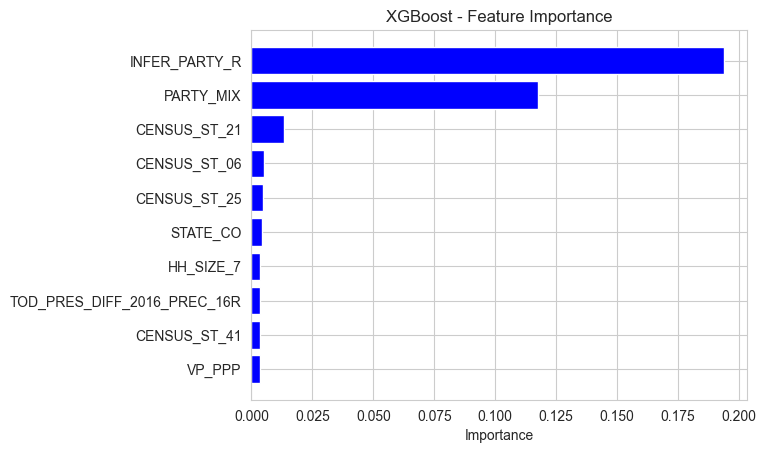

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 205.38 seconds to run.
Running ablation by excluding feature: PRFL_EDUCATION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


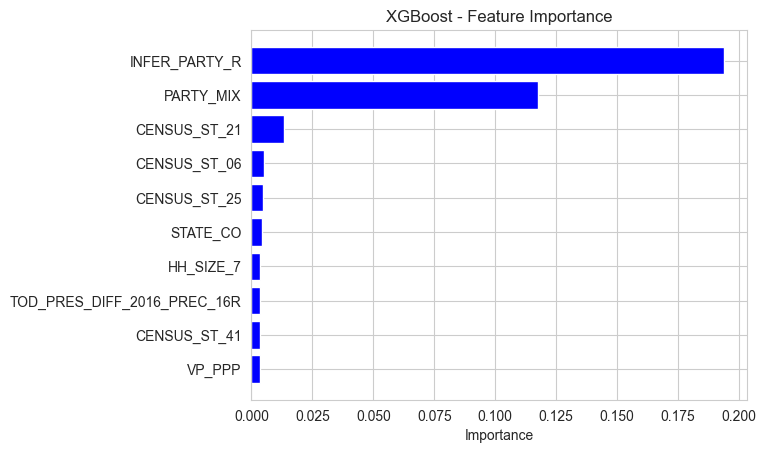

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 202.03 seconds to run.
Running ablation by excluding feature: PRFL_ENVIRONMENT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


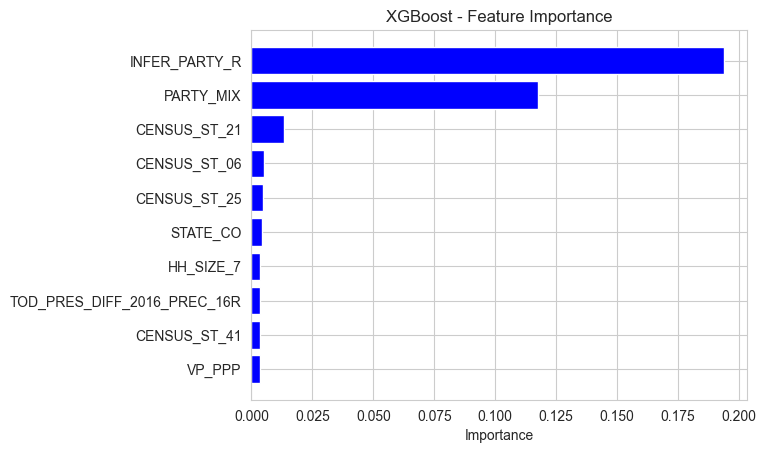

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 224.88 seconds to run.
Running ablation by excluding feature: PRFL_EVANGELICAL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


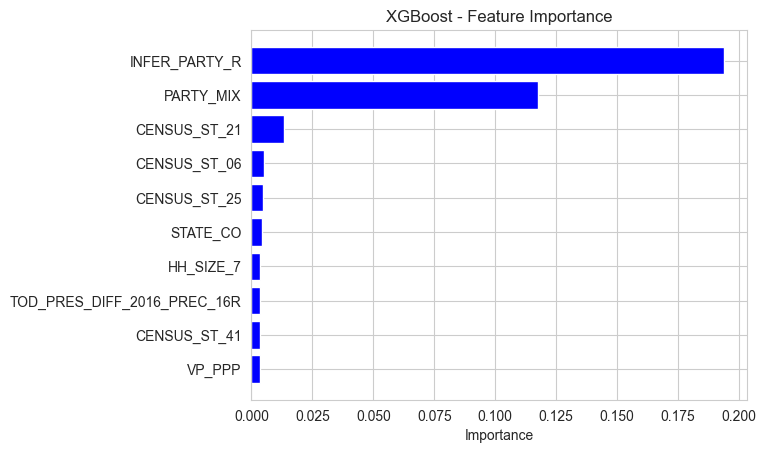

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 106.96 seconds to run.
Running ablation by excluding feature: PRFL_FENCE_SITTER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


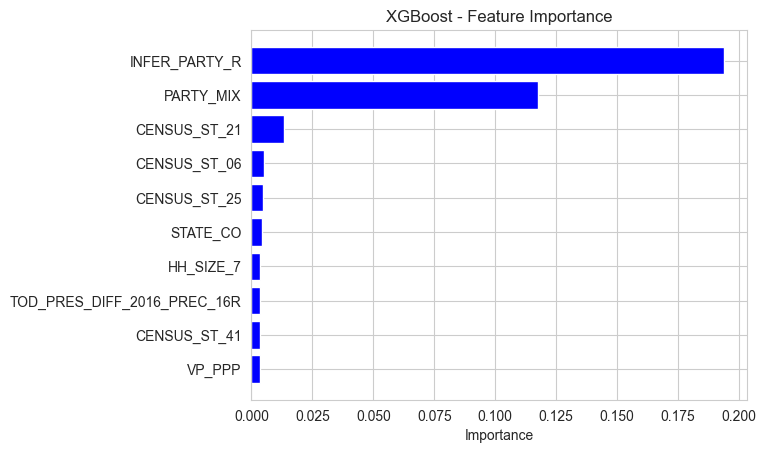

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 104.83 seconds to run.
Running ablation by excluding feature: PRFL_GUN_CONTROL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


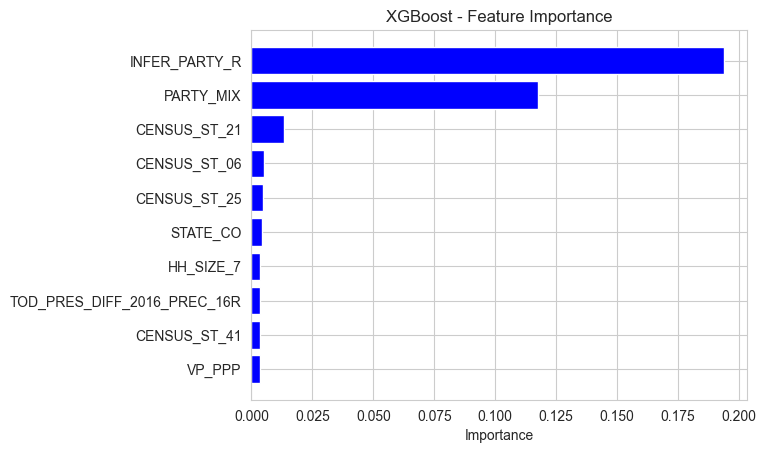

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 116.87 seconds to run.
Running ablation by excluding feature: PRFL_HEALTHCARE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


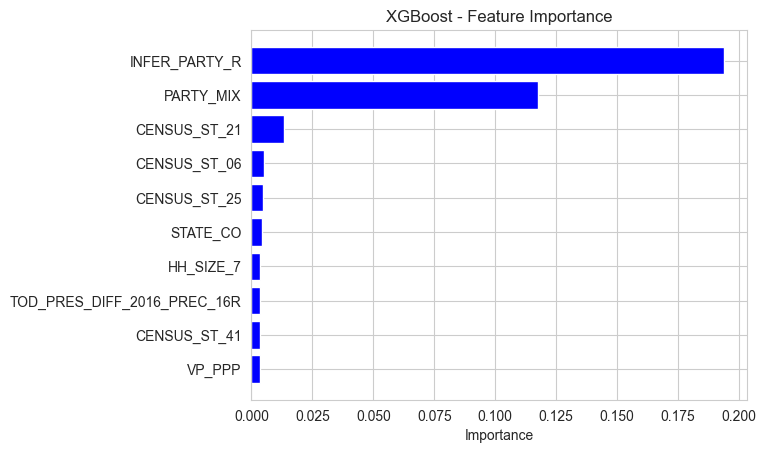

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 110.16 seconds to run.
Running ablation by excluding feature: PRFL_HEALTHCARE_REFORM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1929665207862854
PARTY_MIX: 0.11027251183986664
CENSUS_ST_21: 0.013852556236088276
CENSUS_ST_06: 0.004898872692137957
CENSUS_ST_24: 0.004878222476691008
STATE_CO: 0.004168117884546518
CENSUS_ST_25: 0.00396684417501092
HH_SIZE_7: 0.0034773561637848616
TOD_PRES_DIFF_2016_PREC_16R: 0.0034597276244312525
VP_PPP: 0.003401361871510744


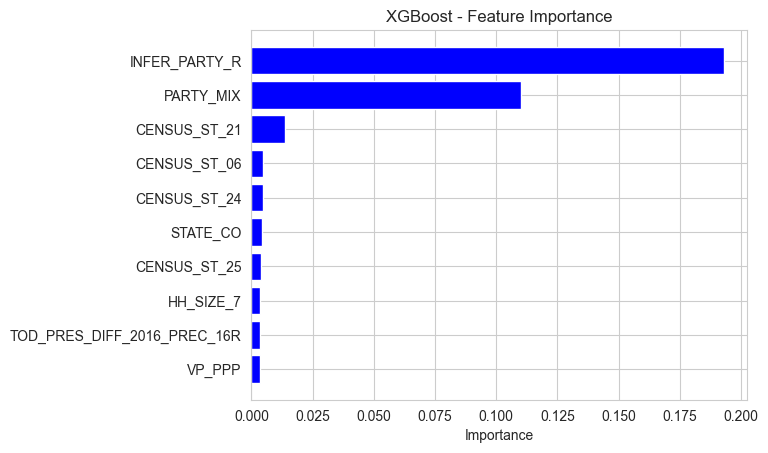

Run 1 - Accuracy: 0.9331, F1 Score: 0.9209716148204421, Recall: 0.9331
Function run_xgboost_all_columns took 122.64 seconds to run.
Running ablation by excluding feature: PRFL_INFLUENCER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


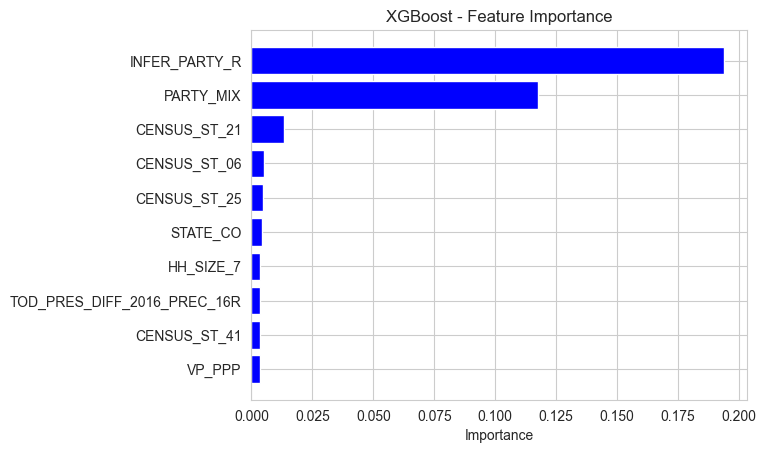

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 101.99 seconds to run.
Running ablation by excluding feature: PRFL_INSURANCE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


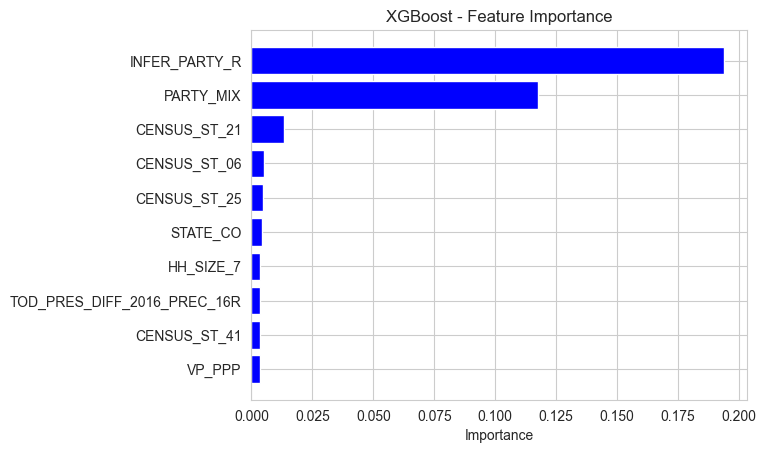

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 100.22 seconds to run.
Running ablation by excluding feature: PRFL_LABOR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


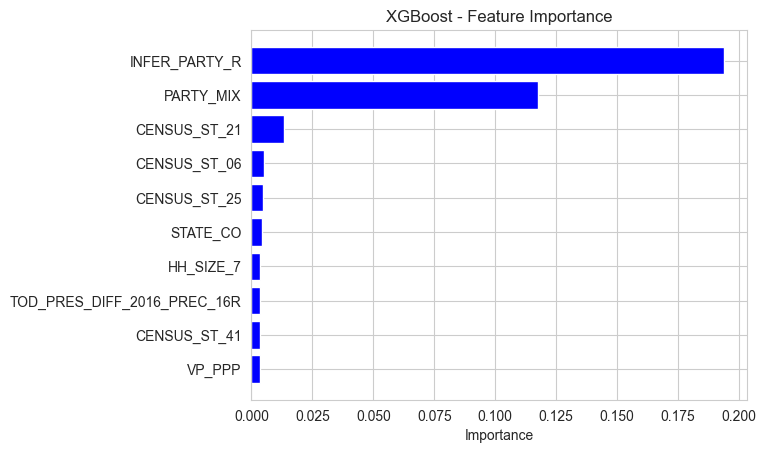

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 129.46 seconds to run.
Running ablation by excluding feature: PRFL_MARRIAGE_EQUALITY
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


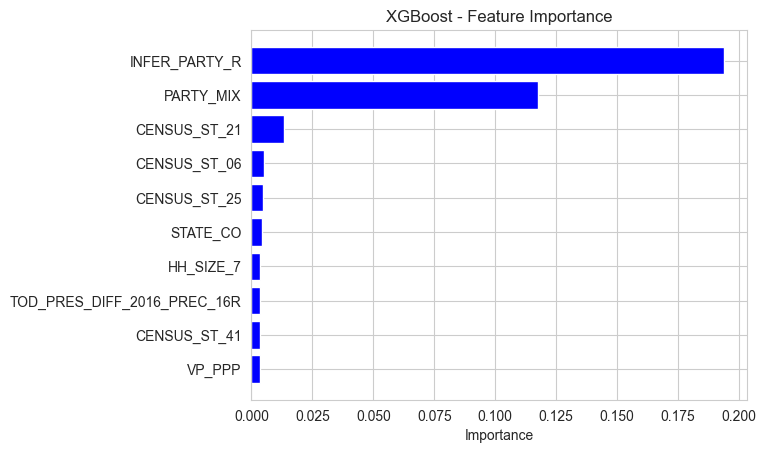

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 106.04 seconds to run.
Running ablation by excluding feature: PRFL_METOO_SUPPORT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


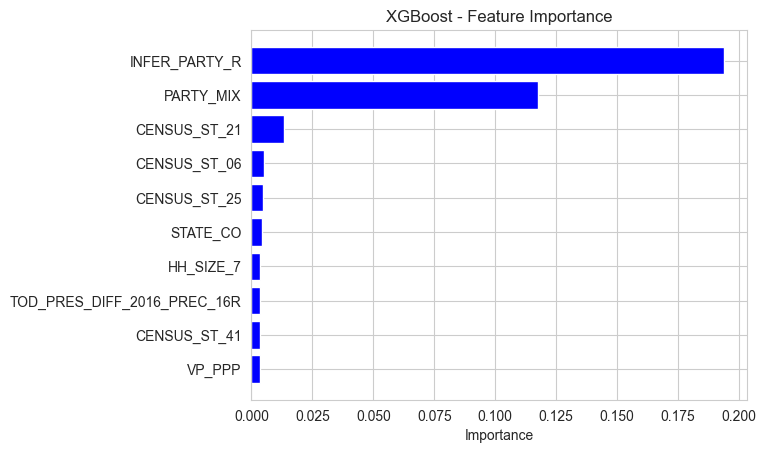

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 104.06 seconds to run.
Running ablation by excluding feature: PRFL_MIL_SUPPORT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


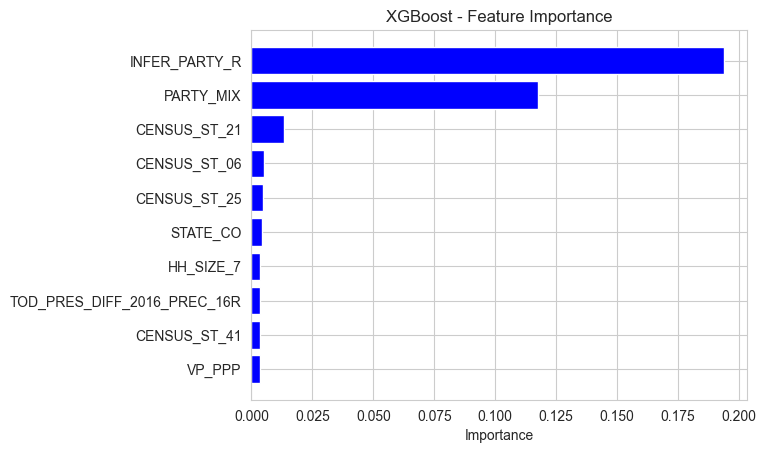

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 106.20 seconds to run.
Running ablation by excluding feature: PRFL_MINWAGE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19683469831943512
PARTY_MIX: 0.11507401615381241
CENSUS_ST_21: 0.013672002591192722
CENSUS_ST_06: 0.0058602942153811455
STATE_CO: 0.004667253233492374
CENSUS_ST_25: 0.004040498286485672
VP_PPP: 0.003981768619269133
CENSUS_ST_04: 0.0036085229367017746
HH_SIZE_7: 0.0035681251902133226
FUND_POLIT_2: 0.0032851260621100664


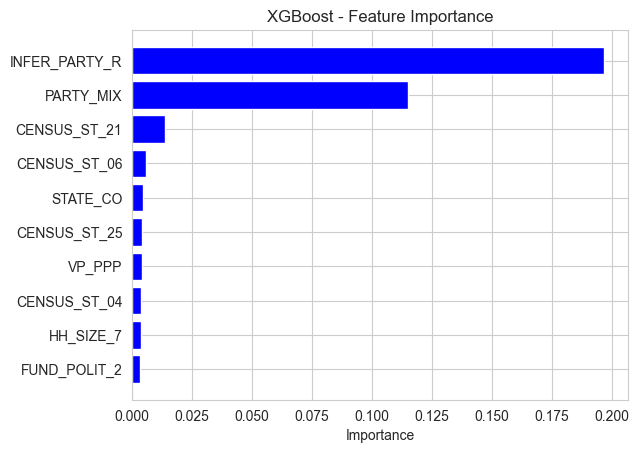

Run 1 - Accuracy: 0.9317, F1 Score: 0.9193940851484933, Recall: 0.9317
Function run_xgboost_all_columns took 117.28 seconds to run.
Running ablation by excluding feature: PRFL_TAXES
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


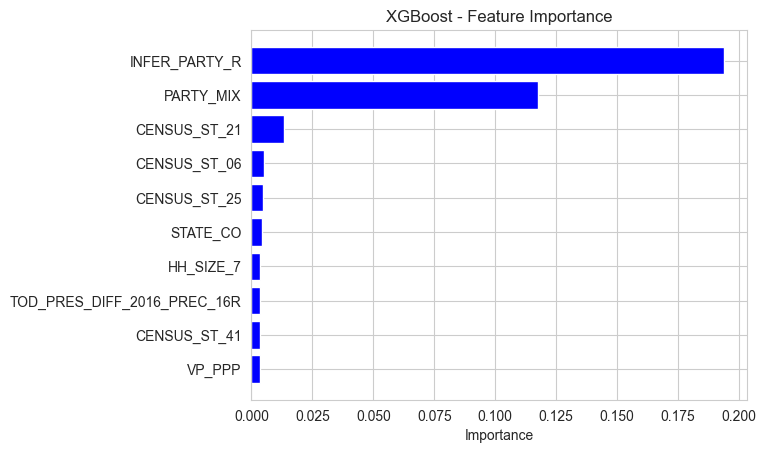

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 119.83 seconds to run.
Running ablation by excluding feature: PRFL_TEACHERS_UNION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


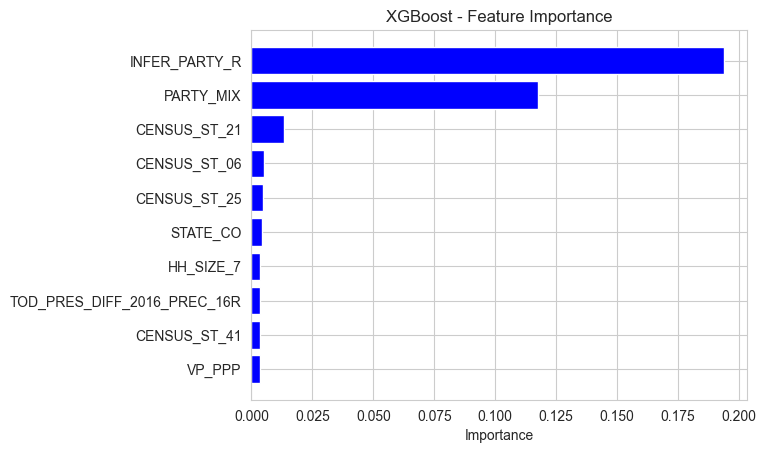

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 106.24 seconds to run.
Running ablation by excluding feature: PRFL_TEAPARTY
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


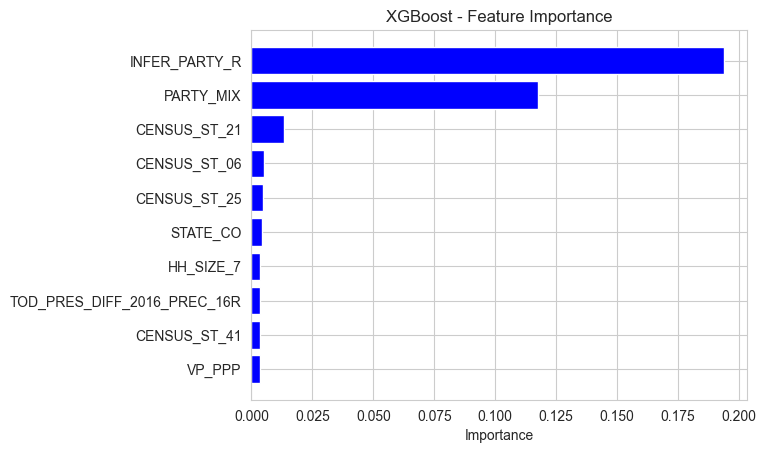

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 121.53 seconds to run.
Running ablation by excluding feature: PRFL_VETERAN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


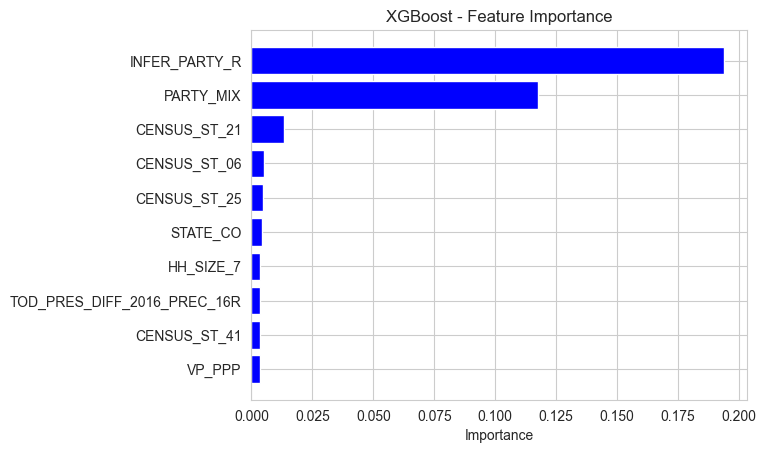

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 114.18 seconds to run.
Running ablation by excluding feature: RD_FINNEWS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


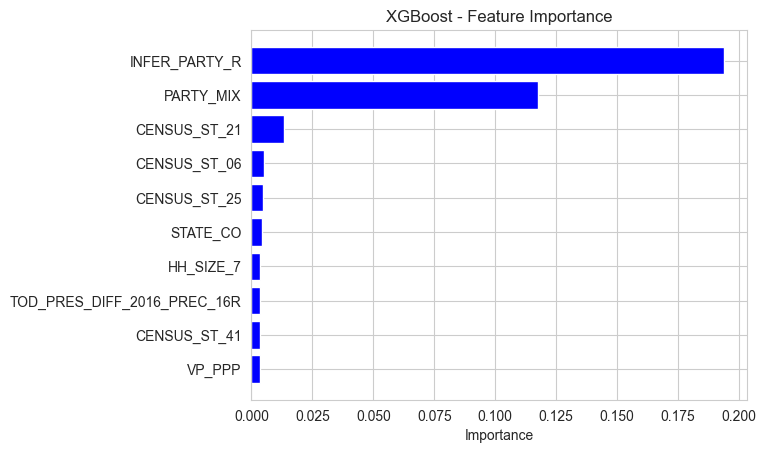

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 100.73 seconds to run.
Running ablation by excluding feature: RD_GEN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


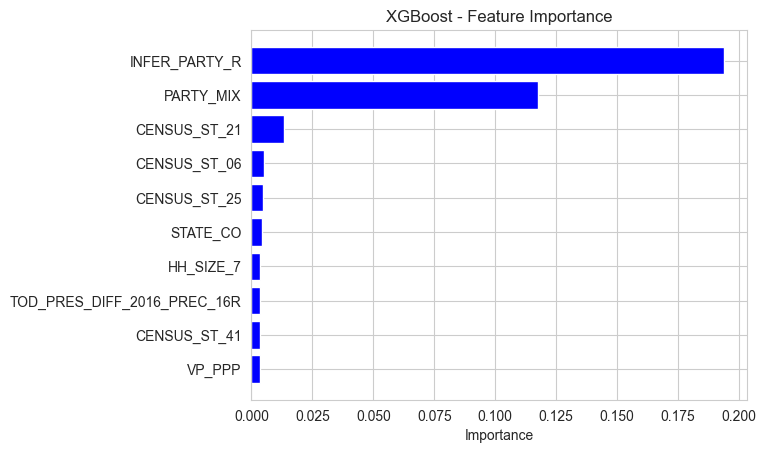

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 106.31 seconds to run.
Running ablation by excluding feature: RD_RELIG
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


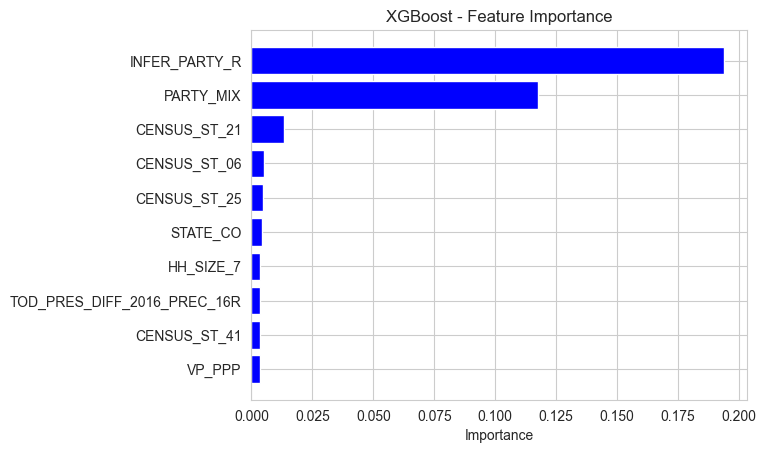

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 102.27 seconds to run.
Running ablation by excluding feature: RD_SCIFI
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


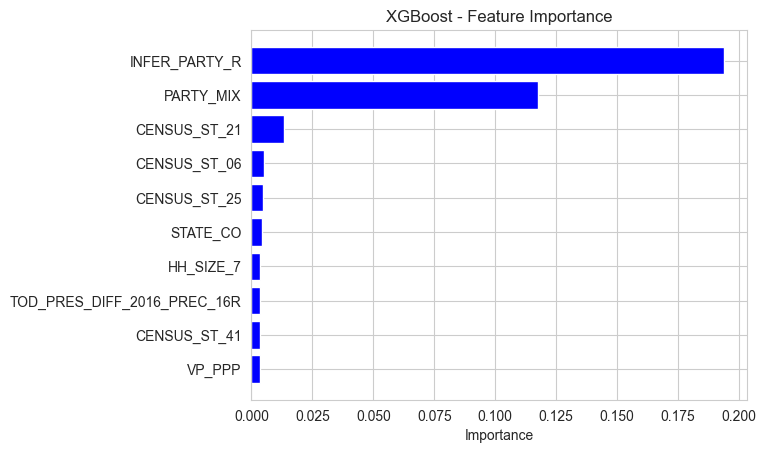

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 90.18 seconds to run.
Running ablation by excluding feature: RELIGINSP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


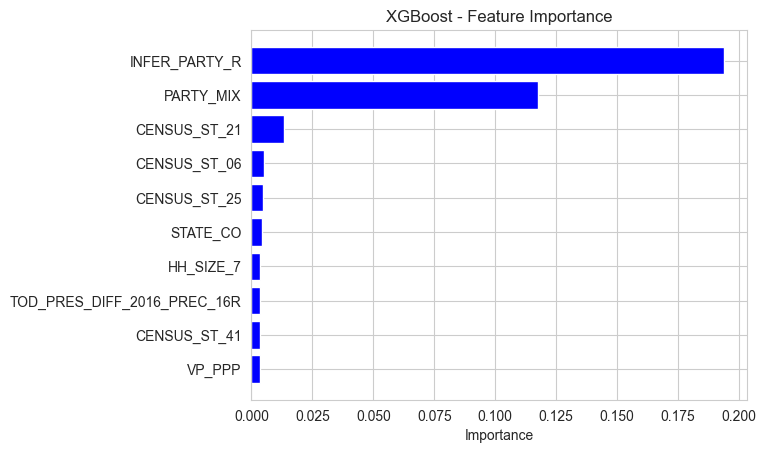

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 92.73 seconds to run.
Running ablation by excluding feature: RELIGION
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


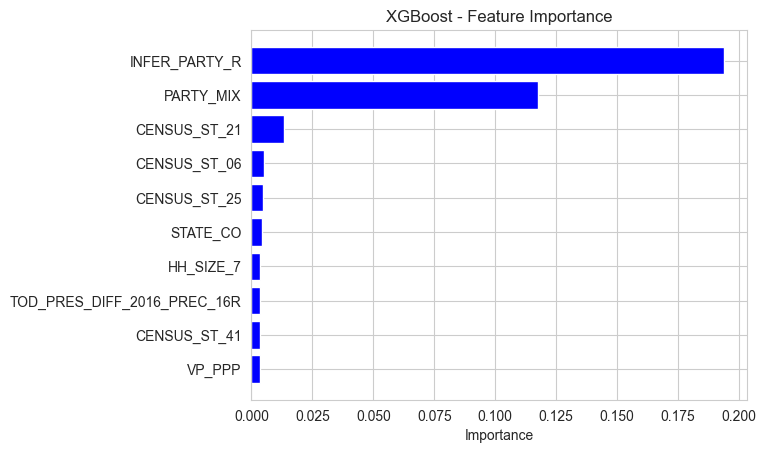

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 93.05 seconds to run.
Running ablation by excluding feature: SCISPACE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


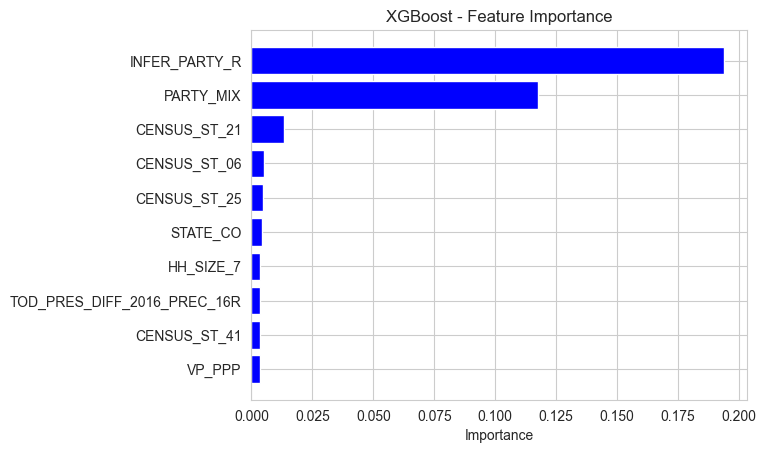

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 95.45 seconds to run.
Running ablation by excluding feature: SCUBADIVER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


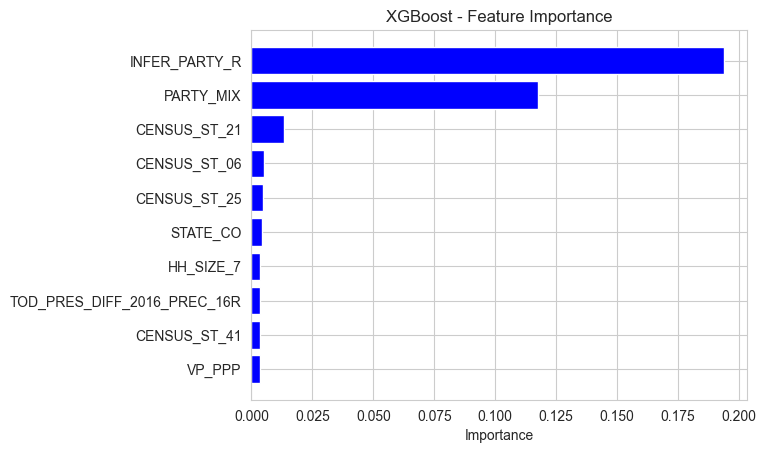

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 90.82 seconds to run.
Running ablation by excluding feature: SELFIMP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


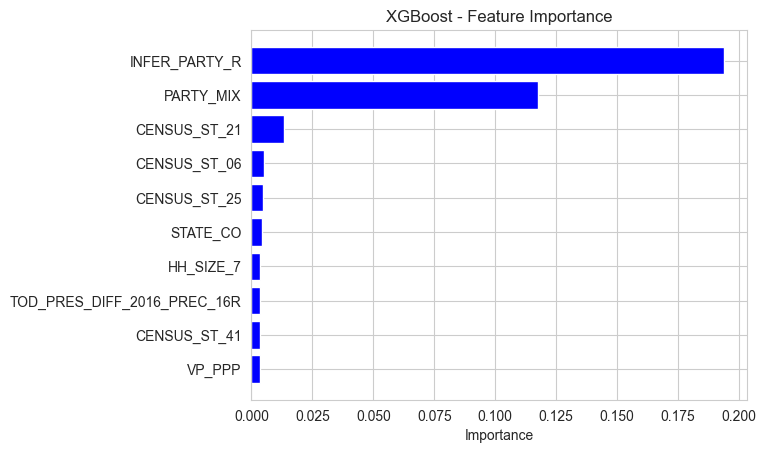

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 87.26 seconds to run.
Running ablation by excluding feature: SEX
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


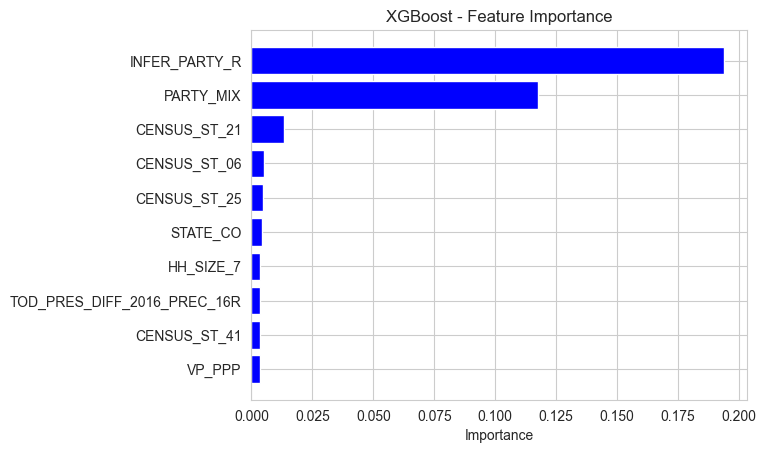

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 63.69 seconds to run.
Running ablation by excluding feature: SINGPARENT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


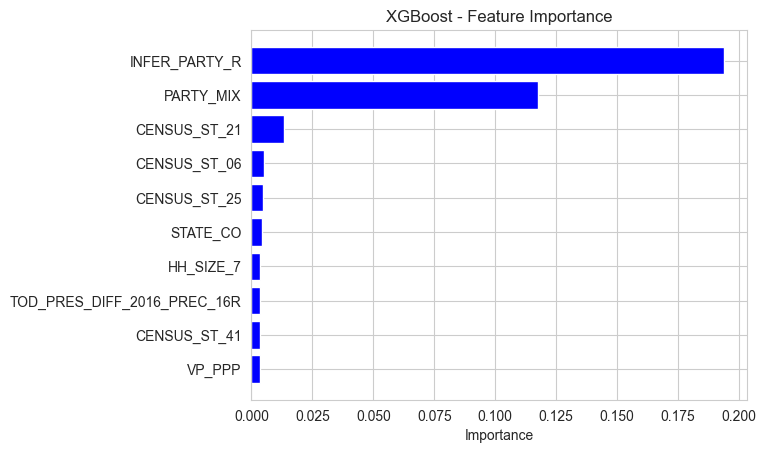

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 61.79 seconds to run.
Running ablation by excluding feature: SMOKING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


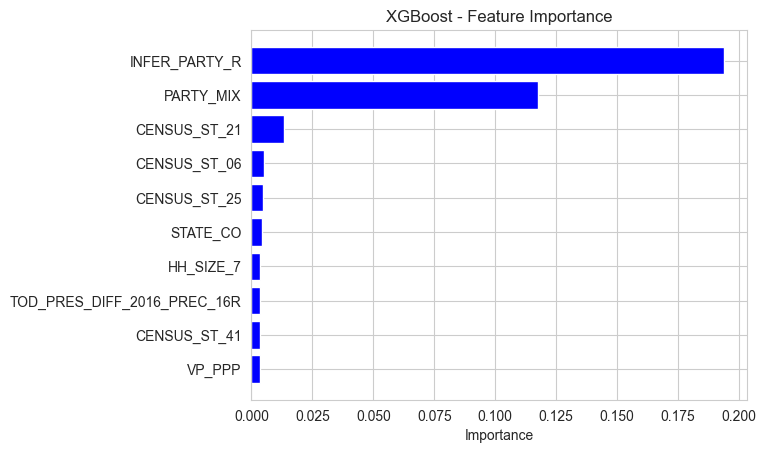

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 69.59 seconds to run.
Running ablation by excluding feature: SPEC_AUTO
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


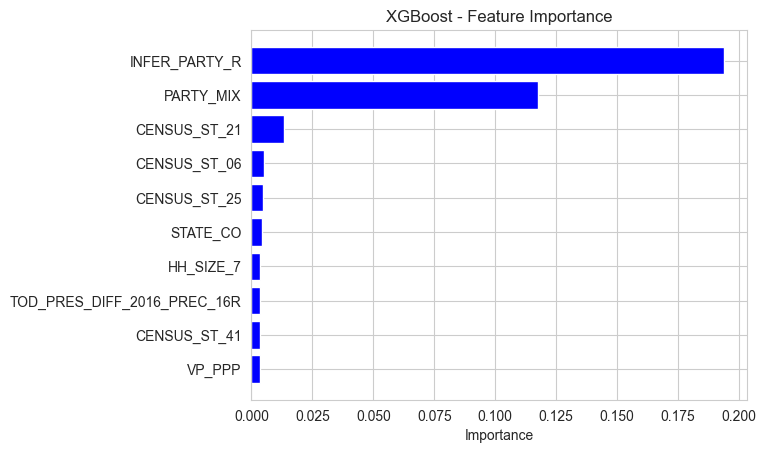

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 78.83 seconds to run.
Running ablation by excluding feature: SPEC_BASE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


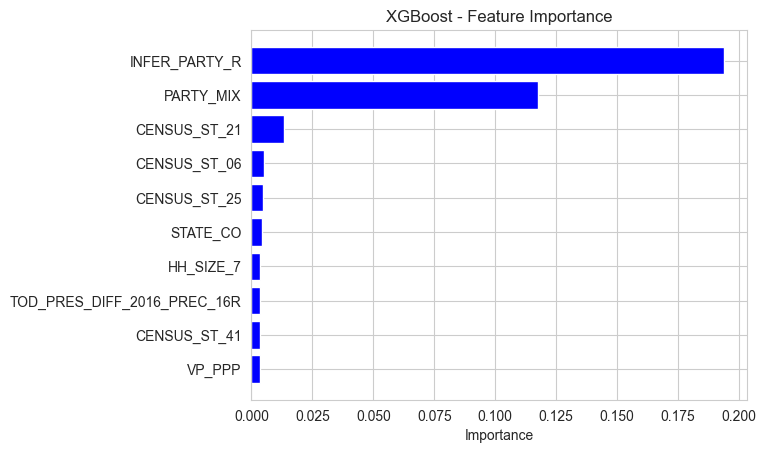

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 96.43 seconds to run.
Running ablation by excluding feature: SPEC_BASK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


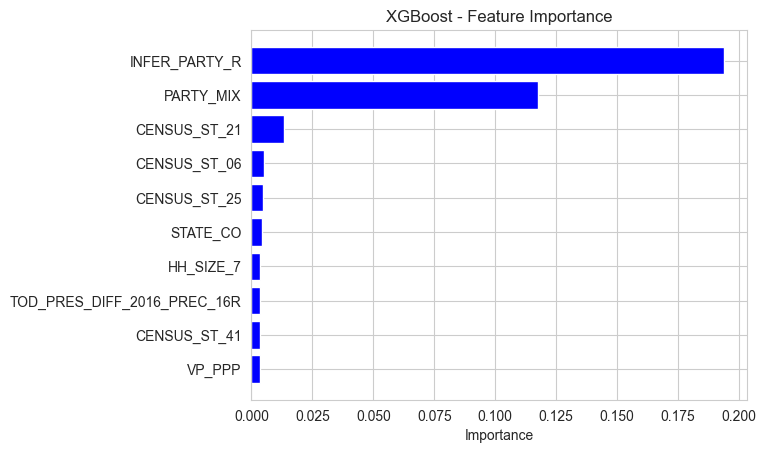

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 102.80 seconds to run.
Running ablation by excluding feature: SPEC_FOOT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


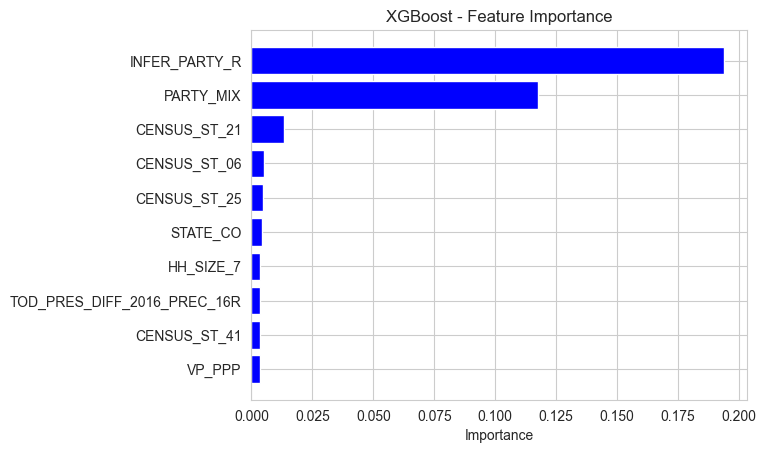

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 93.01 seconds to run.
Running ablation by excluding feature: SPEC_HOCK
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


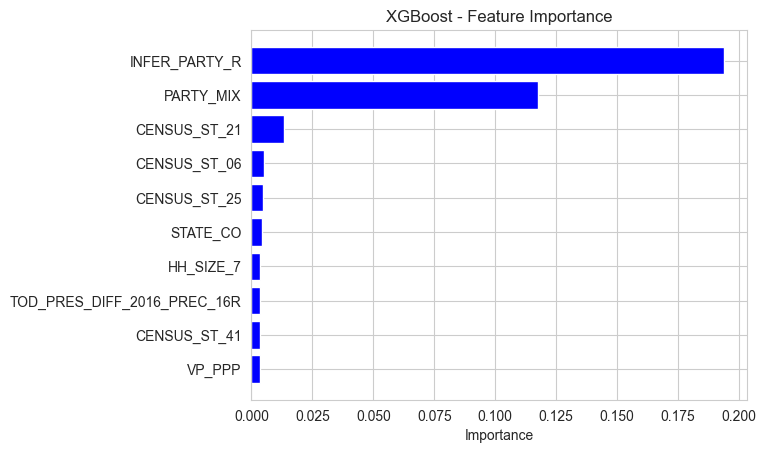

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 99.38 seconds to run.
Running ablation by excluding feature: SPEC_SOCC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


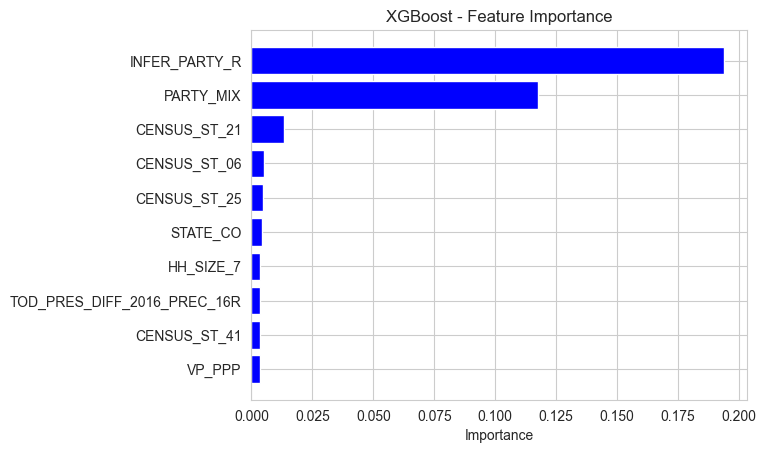

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 104.53 seconds to run.
Running ablation by excluding feature: SPORTLEIS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


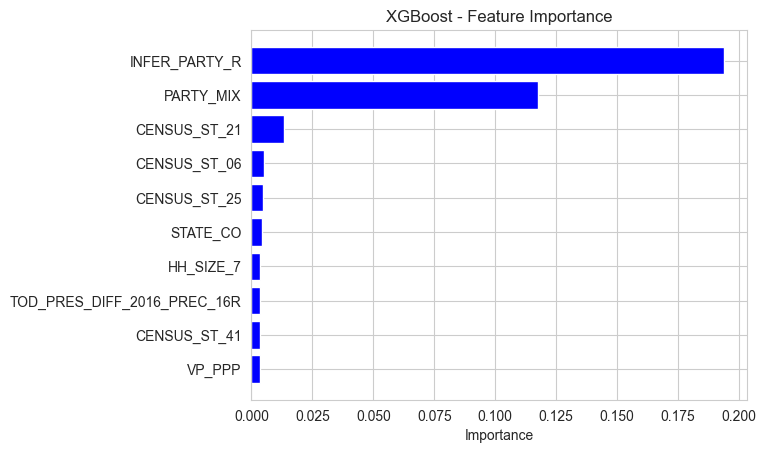

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 105.24 seconds to run.
Running ablation by excluding feature: ST_LO_HOUS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


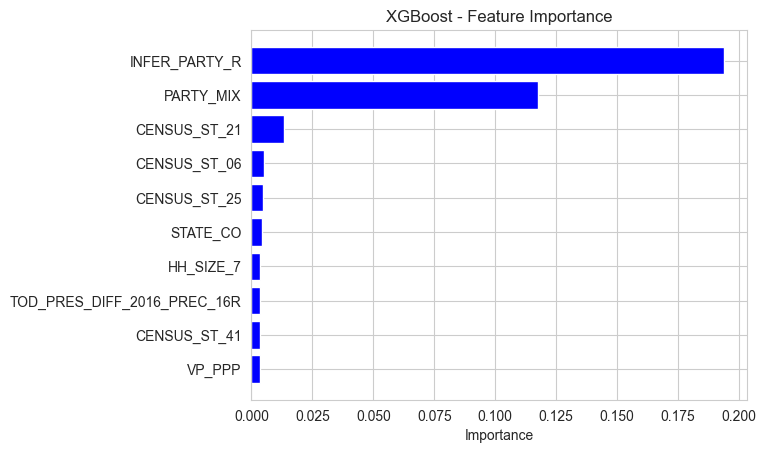

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 107.42 seconds to run.
Running ablation by excluding feature: ST_UP_HOUS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


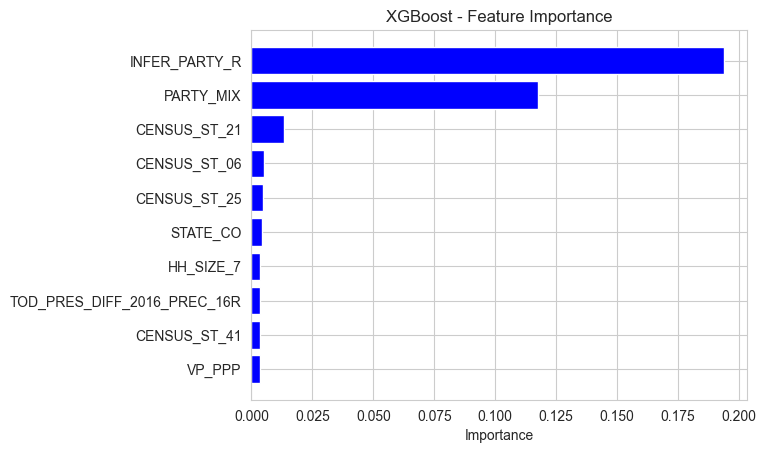

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 123.00 seconds to run.
Running ablation by excluding feature: STATE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


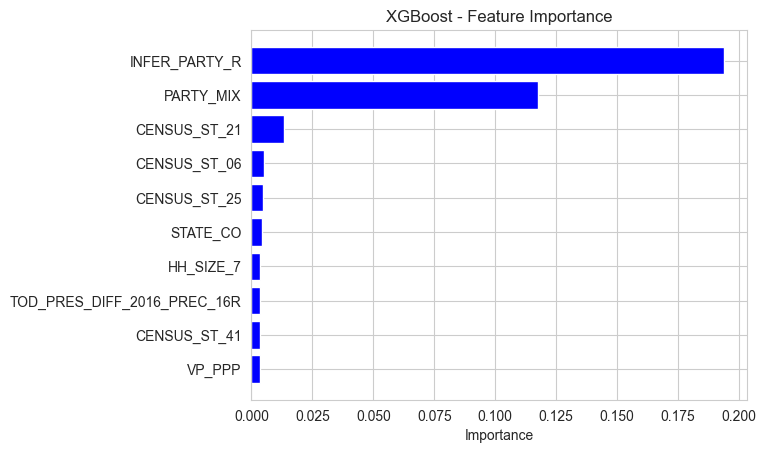

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 98.44 seconds to run.
Running ablation by excluding feature: STATUS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


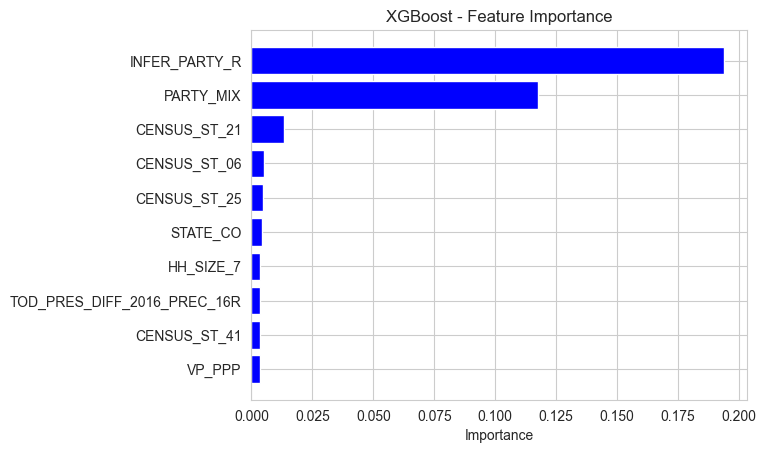

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 117.77 seconds to run.
Running ablation by excluding feature: SWEEPSTAKE
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


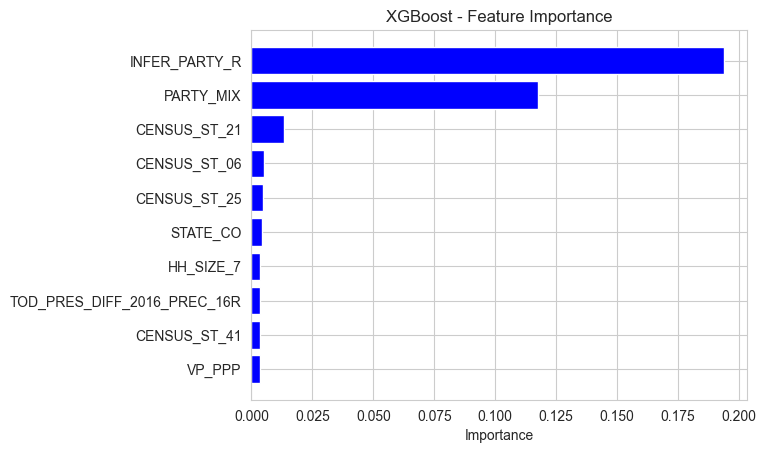

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 96.35 seconds to run.
Running ablation by excluding feature: TELECOM
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


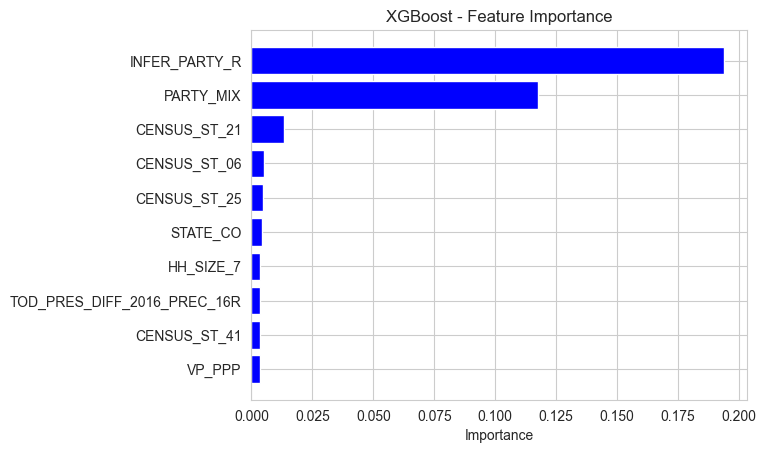

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 94.47 seconds to run.
Running ablation by excluding feature: TENNIS
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


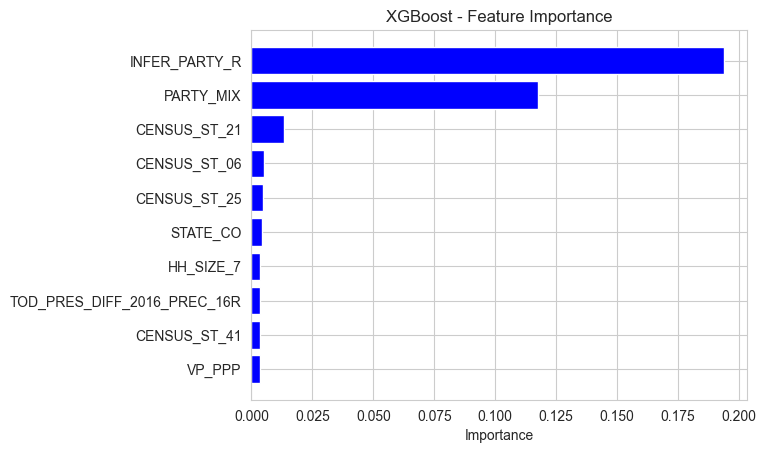

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 96.24 seconds to run.
Running ablation by excluding feature: THEATER
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


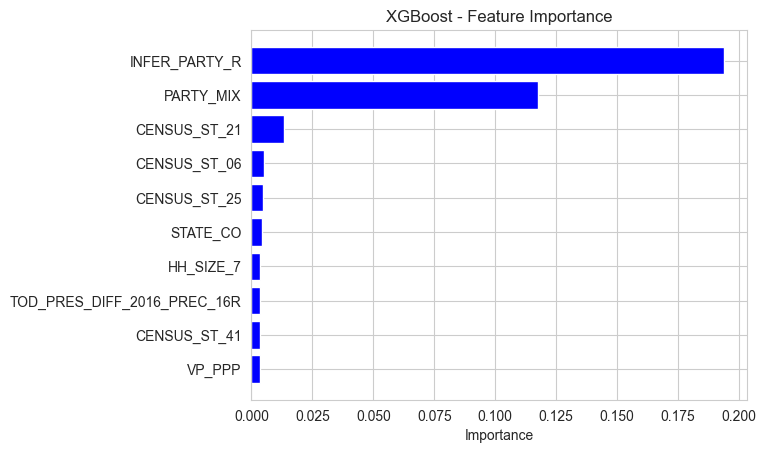

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 97.05 seconds to run.
Running ablation by excluding feature: TOD_PRES_D_2016
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1933746188879013
PARTY_MIX: 0.11208116263151169
CENSUS_ST_21: 0.013414752669632435
CENSUS_ST_06: 0.005255867261439562
CENSUS_ST_24: 0.004138844087719917
CENSUS_ST_25: 0.0038728429935872555
HH_SIZE_7: 0.0034846444614231586
TOD_PRES_DIFF_2016_PREC_16R: 0.0034669789019972086
VP_PPP: 0.0034129845444113016
CENSUS_ST_41: 0.0033776822965592146


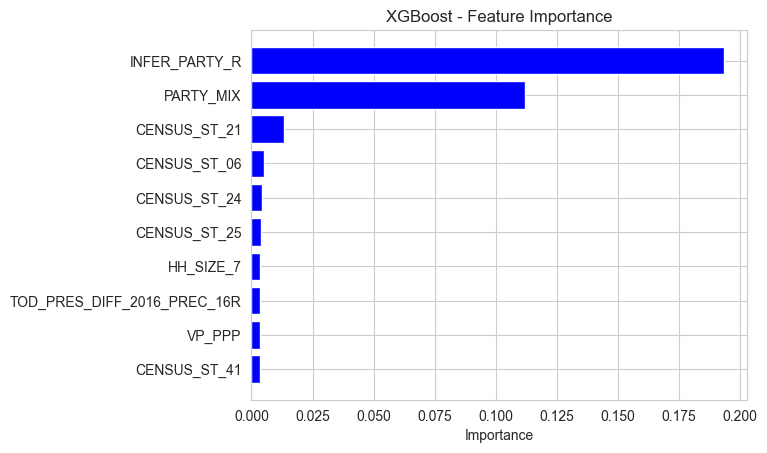

Run 1 - Accuracy: 0.9328, F1 Score: 0.9208475808070667, Recall: 0.9328
Function run_xgboost_all_columns took 103.14 seconds to run.
Running ablation by excluding feature: TOD_PRES_D_2016_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1915498524904251
PARTY_MIX: 0.1129281148314476
CENSUS_ST_21: 0.013202869333326817
CENSUS_ST_06: 0.005257831420749426
CENSUS_ST_25: 0.004133174195885658
STATE_CO: 0.004106663167476654
CENSUS_ST_04: 0.00342361512593925
TOD_PRES_DIFF_2016_PREC_16R: 0.0034137859474867582
CENSUS_ST_37: 0.003392264014109969
CENSUS_ST_41: 0.0033634298015385866


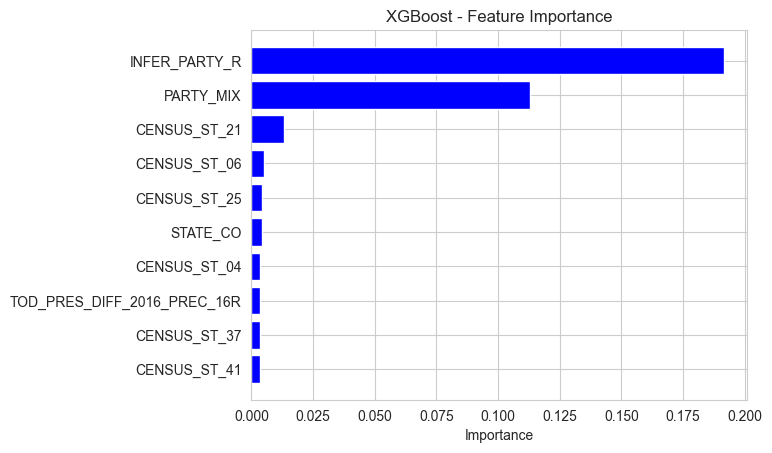

Run 1 - Accuracy: 0.9339, F1 Score: 0.9217920708145709, Recall: 0.9339
Function run_xgboost_all_columns took 120.10 seconds to run.
Running ablation by excluding feature: TOD_PRES_D_2020_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19345030188560486
PARTY_MIX: 0.10862117260694504
CENSUS_ST_21: 0.01380428671836853
CENSUS_ST_06: 0.005416407715529203
CENSUS_ST_24: 0.00486030476167798
STATE_CO: 0.004152518697082996
CENSUS_ST_25: 0.003973457030951977
VP_PPP: 0.0036880779080092907
CENSUS_ST_41: 0.003585554426535964
CENSUS_ST_08: 0.0032057352364063263


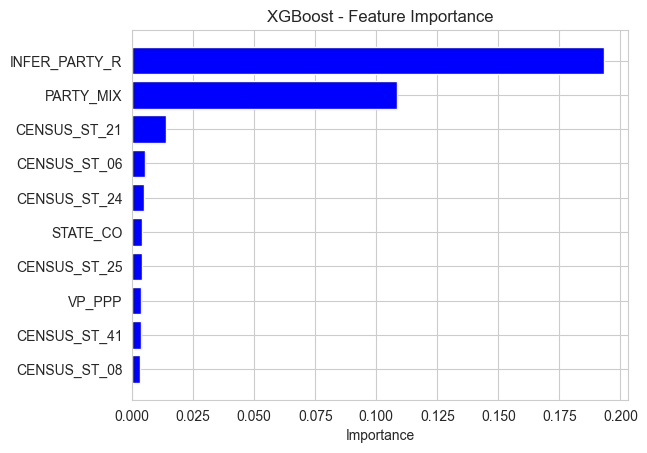

Run 1 - Accuracy: 0.9332, F1 Score: 0.9211815171237205, Recall: 0.9332
Function run_xgboost_all_columns took 107.53 seconds to run.
Running ablation by excluding feature: TOD_PRES_DIFF_2016
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


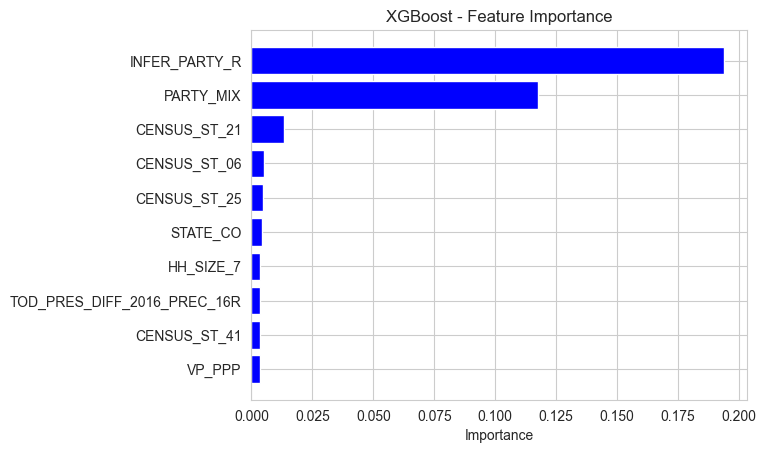

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 94.55 seconds to run.
Running ablation by excluding feature: TOD_PRES_DIFF_2016_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


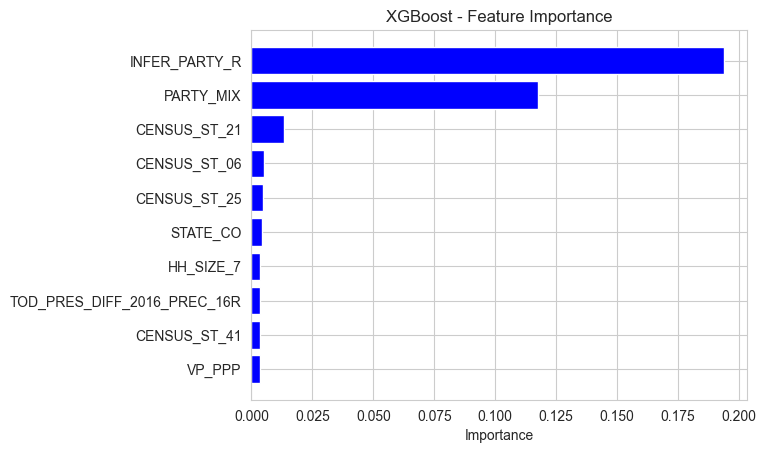

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 94.92 seconds to run.
Running ablation by excluding feature: TOD_PRES_DIFF_2020_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


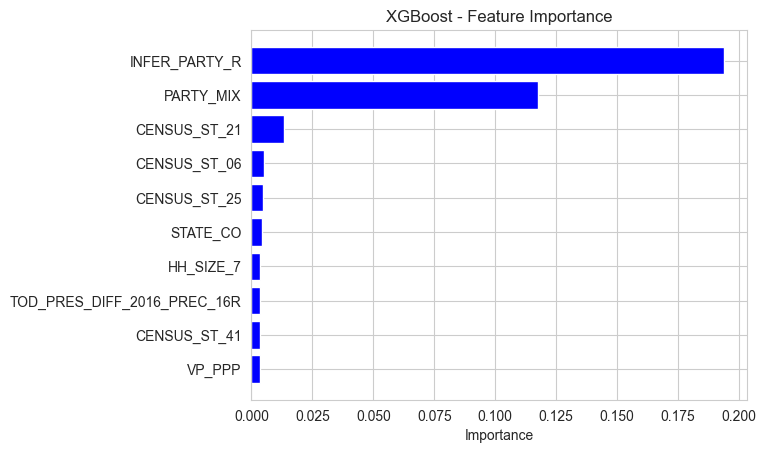

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 95.05 seconds to run.
Running ablation by excluding feature: TOD_PRES_O_2016
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19274061918258667
PARTY_MIX: 0.1120549663901329
CENSUS_ST_21: 0.012482374906539917
CENSUS_ST_06: 0.004824847914278507
STATE_CO: 0.004283570218831301
CENSUS_ST_25: 0.003836939577013254
CENSUS_ST_41: 0.0035367896780371666
HH_SIZE_7: 0.00349418050609529
CENSUS_ST_08: 0.003230814356356859
FUND_POLIT_2: 0.0032170461490750313


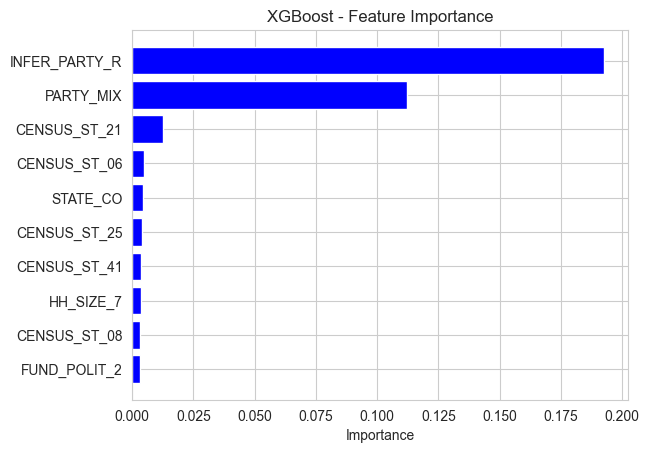

Run 1 - Accuracy: 0.9338, F1 Score: 0.9218577052732068, Recall: 0.9338
Function run_xgboost_all_columns took 97.22 seconds to run.
Running ablation by excluding feature: TOD_PRES_O_2016_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.18989449739456177
PARTY_MIX: 0.1086447462439537
CENSUS_ST_21: 0.013220764696598053
CENSUS_ST_24: 0.006863012909889221
CENSUS_ST_06: 0.005346397403627634
STATE_CO: 0.004131945315748453
CENSUS_ST_25: 0.004086533561348915
CENSUS_ST_32: 0.003941885661333799
CENSUS_ST_04: 0.0036217065062373877
HH_SIZE_7: 0.003449059324339032


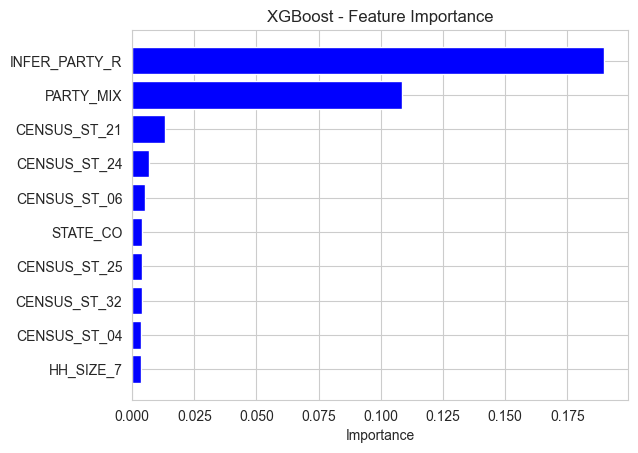

Run 1 - Accuracy: 0.9335, F1 Score: 0.9211781972921315, Recall: 0.9335
Function run_xgboost_all_columns took 102.35 seconds to run.
Running ablation by excluding feature: TOD_PRES_O_2020_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1897939294576645
PARTY_MIX: 0.11203896254301071
CENSUS_ST_21: 0.014205023646354675
CENSUS_ST_06: 0.004566174931824207
STATE_CO: 0.0044623855501413345
CENSUS_ST_25: 0.0042146653868258
VP_PPP: 0.003554856637492776
CENSUS_ST_04: 0.0034476895816624165
HH_SIZE_7: 0.0034474520944058895
CENSUS_ST_41: 0.0034459398593753576


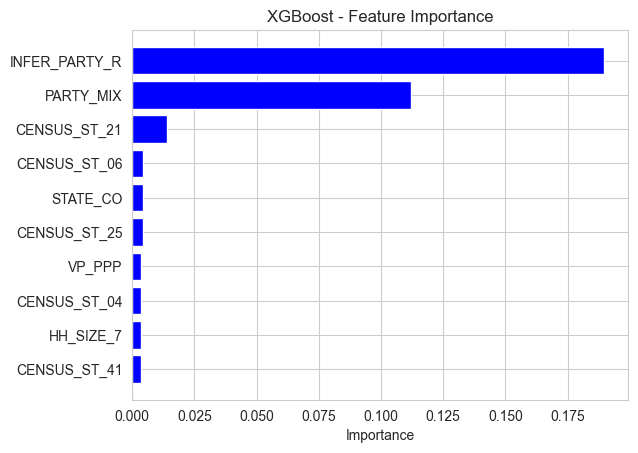

Run 1 - Accuracy: 0.9326, F1 Score: 0.9203957849229406, Recall: 0.9326
Function run_xgboost_all_columns took 109.55 seconds to run.
Running ablation by excluding feature: TOD_PRES_R_2016
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19387520849704742
PARTY_MIX: 0.11237453669309616
CENSUS_ST_21: 0.012912329286336899
CENSUS_ST_06: 0.005350205581635237
CENSUS_ST_25: 0.004252316430211067
STATE_CO: 0.004187844227999449
VP_PPP: 0.003692582016810775
HH_SIZE_7: 0.0034935472067445517
TOD_PRES_DIFF_2016_PREC_16R: 0.0034758364781737328
CENSUS_ST_41: 0.0034473566338419914


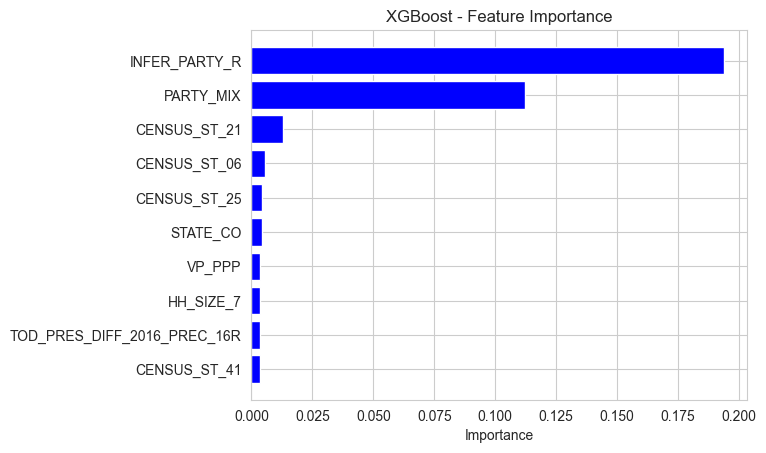

Run 1 - Accuracy: 0.9345, F1 Score: 0.9222151266346802, Recall: 0.9345
Function run_xgboost_all_columns took 104.99 seconds to run.
Running ablation by excluding feature: TOD_PRES_R_2016_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19543172419071198
PARTY_MIX: 0.11013547331094742
CENSUS_ST_21: 0.01403607428073883
CENSUS_ST_06: 0.005263883154839277
STATE_CO: 0.004197398666292429
TOD_PRES_DIFF_2016_PREC_16R: 0.003503890475258231
VP_PPP: 0.00343998521566391
CENSUS_ST_25: 0.003399563254788518
CENSUS_ST_04: 0.0033096938859671354
FUND_POLIT_2: 0.003242430742830038


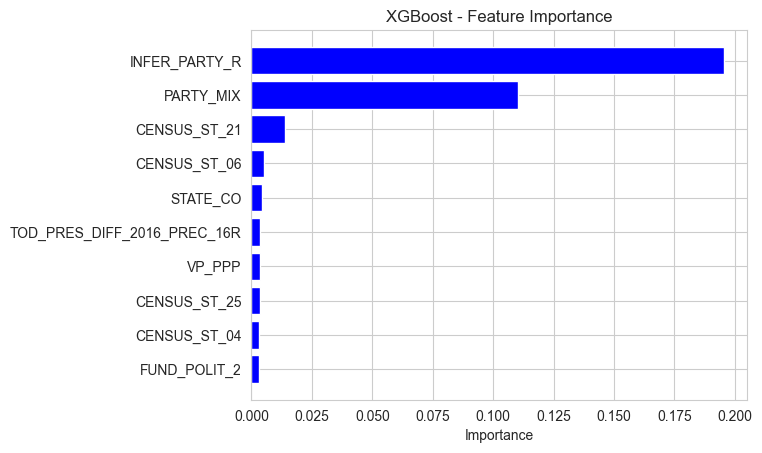

Run 1 - Accuracy: 0.934, F1 Score: 0.921705533866654, Recall: 0.934
Function run_xgboost_all_columns took 105.26 seconds to run.
Running ablation by excluding feature: TOD_PRES_R_2020_PREC
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.1929597705602646
PARTY_MIX: 0.10847063362598419
CENSUS_ST_21: 0.013924443162977695
CENSUS_ST_06: 0.004819686058908701
STATE_CO: 0.004260348621755838
CENSUS_ST_25: 0.0039459108375012875
CENSUS_ST_04: 0.0037202814128249884
VP_PPP: 0.0037109411787241697
HH_SIZE_7: 0.0034979202318936586
CENSUS_ST_24: 0.003448864445090294


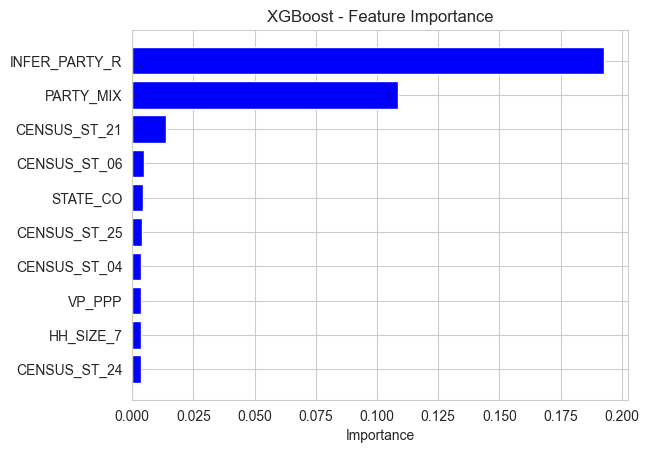

Run 1 - Accuracy: 0.9338, F1 Score: 0.9215523621947467, Recall: 0.9338
Function run_xgboost_all_columns took 115.08 seconds to run.
Running ablation by excluding feature: TRAIL_CNT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19894054532051086
PARTY_MIX: 0.11261284351348877
CENSUS_ST_21: 0.013112341985106468
CENSUS_ST_06: 0.005172626115381718
CENSUS_ST_25: 0.0036867873277515173
VP_PPP: 0.0035671647638082504
CENSUS_ST_41: 0.0034911958500742912
CENSUS_ST_08: 0.003441727254539728
STATE_CO: 0.003133666468784213
CENSUS_ST_37: 0.0030928386840969324


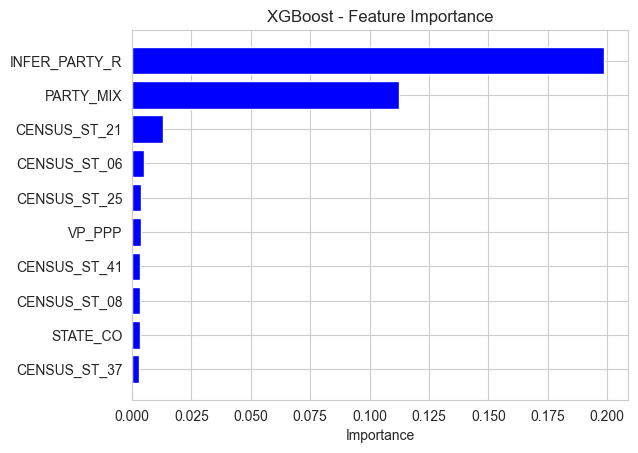

Run 1 - Accuracy: 0.9335, F1 Score: 0.9212121109814597, Recall: 0.9335
Function run_xgboost_all_columns took 116.62 seconds to run.
Running ablation by excluding feature: TRAVEL
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


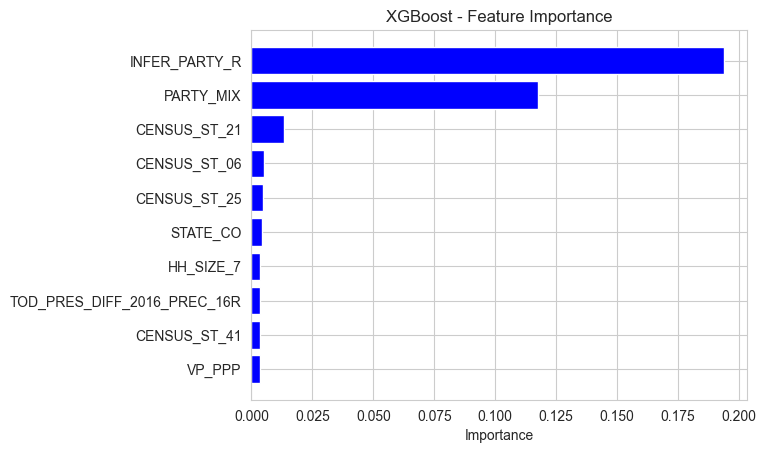

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 111.03 seconds to run.
Running ablation by excluding feature: VOTER_CNT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


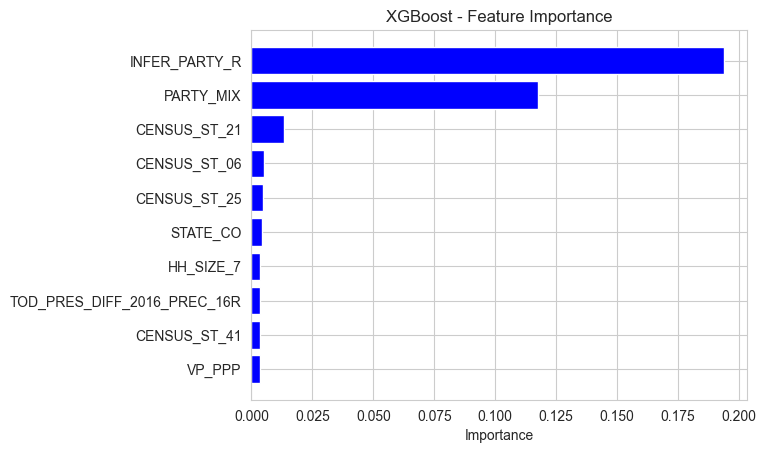

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 106.22 seconds to run.
Running ablation by excluding feature: VOTER_TRLR
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


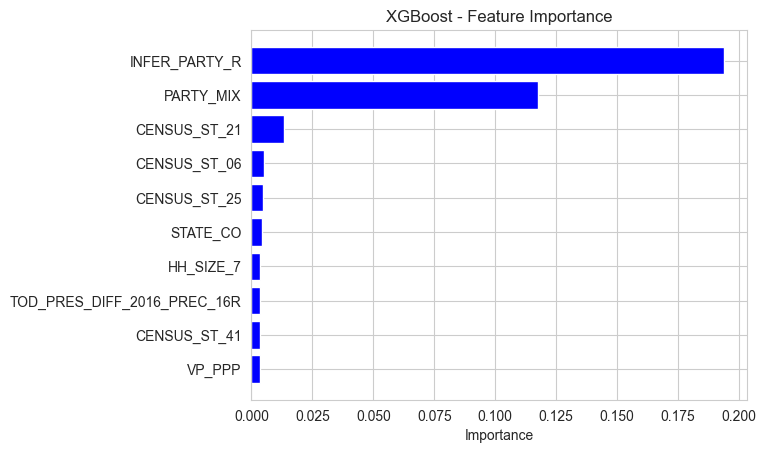

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 103.85 seconds to run.
Running ablation by excluding feature: VP_GEN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19685617089271545
PARTY_MIX: 0.10694950073957443
CENSUS_ST_21: 0.013012408278882504
CENSUS_ST_06: 0.004852494690567255
CENSUS_ST_04: 0.004418824799358845
CENSUS_ST_25: 0.004281539935618639
VP_PPP: 0.003633736399933696
CENSUS_ST_41: 0.0036054877564311028
HH_SIZE_7: 0.0035256410483270884
CENSUS_ST_37: 0.003421715460717678


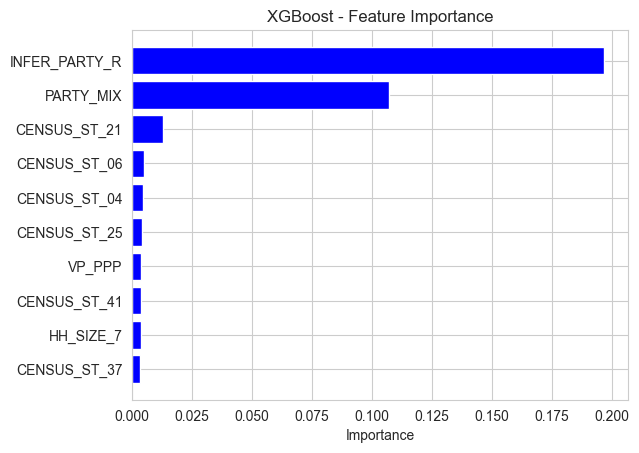

Run 1 - Accuracy: 0.9335, F1 Score: 0.9214426346856981, Recall: 0.9335
Function run_xgboost_all_columns took 106.68 seconds to run.
Running ablation by excluding feature: VP_OTH
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19068369269371033
PARTY_MIX: 0.11715937405824661
CENSUS_ST_21: 0.014029053039848804
CENSUS_ST_06: 0.005172735080122948
VP_PPP: 0.004004993010312319
CENSUS_ST_25: 0.003877021372318268
CENSUS_ST_32: 0.003729467047378421
CENSUS_ST_41: 0.003629153361544013
CENSUS_ST_04: 0.00361636676825583
CENSUS_ST_37: 0.003564411075785756


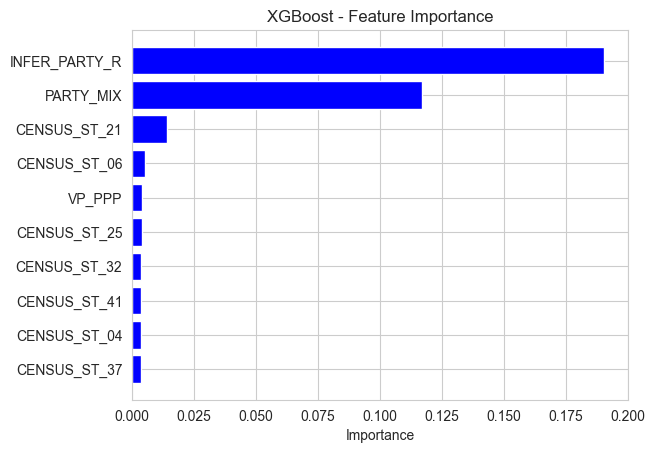

Run 1 - Accuracy: 0.9326, F1 Score: 0.9204937095286873, Recall: 0.9326
Function run_xgboost_all_columns took 99.63 seconds to run.
Running ablation by excluding feature: VP_PPP
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19423624873161316
PARTY_MIX: 0.1095096543431282
CENSUS_ST_21: 0.013118719682097435
CENSUS_ST_06: 0.005789304617792368
CENSUS_ST_25: 0.004120802506804466
PRFL_MINWAGE: 0.0036026081070303917
STATE_CO: 0.0035162607673555613
TOD_PRES_DIFF_2016_PREC_16R: 0.003413342172279954
CENSUS_ST_37: 0.003371862228959799
CENSUS_ST_36: 0.0032084027770906687


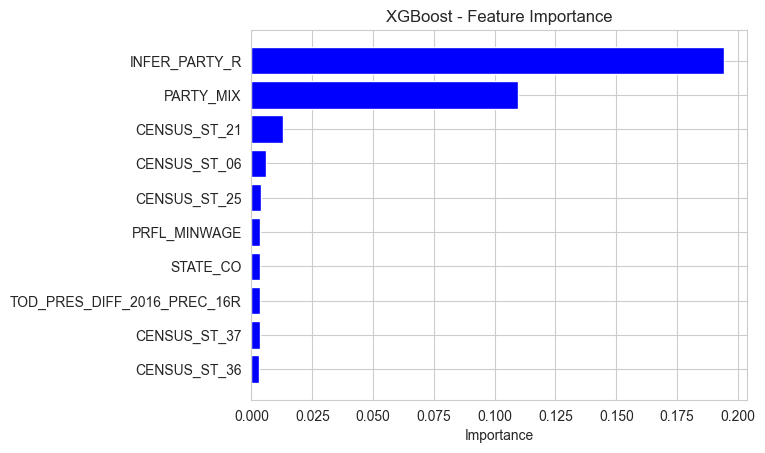

Run 1 - Accuracy: 0.9338, F1 Score: 0.921496166559392, Recall: 0.9338
Function run_xgboost_all_columns took 108.30 seconds to run.
Running ablation by excluding feature: VP_PRI
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19433988630771637
PARTY_MIX: 0.10994917154312134
CENSUS_ST_21: 0.014505790546536446
CENSUS_ST_06: 0.005081589799374342
CENSUS_ST_41: 0.003988988697528839
HH_SIZE_7: 0.003523212159052491
VP_PPP: 0.0035038325004279613
CENSUS_ST_25: 0.003340272232890129
CENSUS_ST_08: 0.003309731837362051
CENSUS_ST_24: 0.0032955650240182877


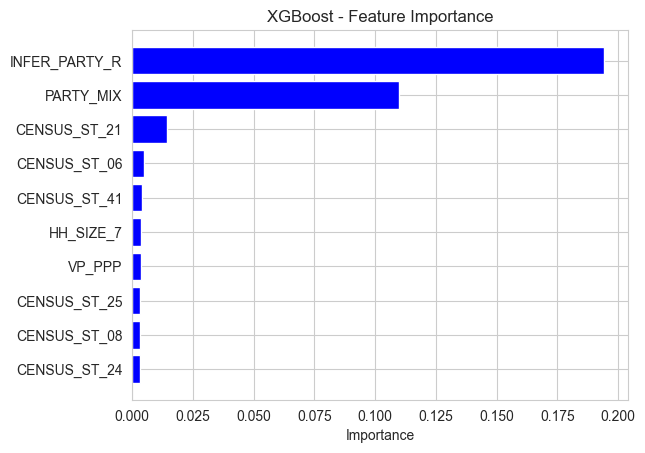

Run 1 - Accuracy: 0.9332, F1 Score: 0.9207471376970934, Recall: 0.9332
Function run_xgboost_all_columns took 100.77 seconds to run.
Running ablation by excluding feature: WORKWOMAN
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


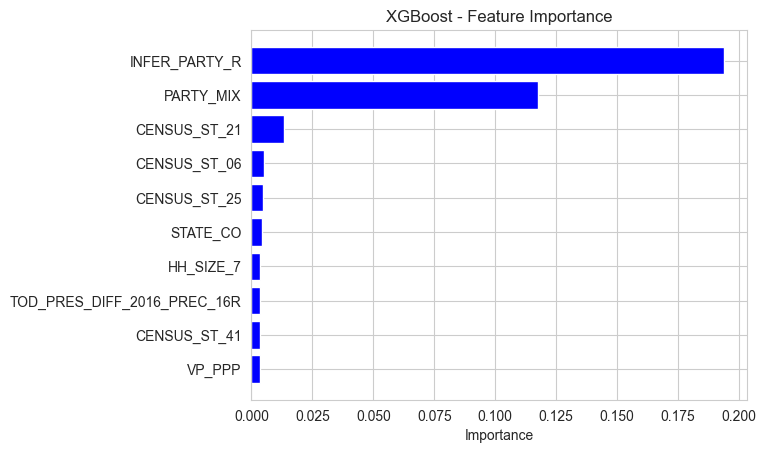

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 101.31 seconds to run.
Running ablation by excluding feature: YEARBUILT
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


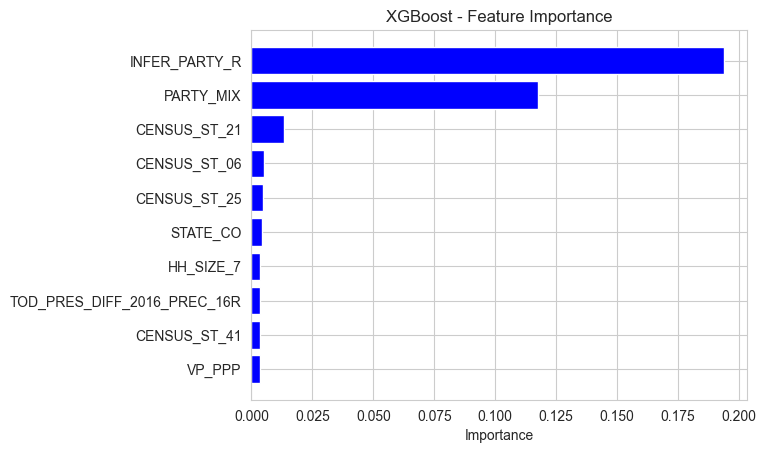

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 100.33 seconds to run.
Running ablation by excluding feature: INFER_PARTY
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


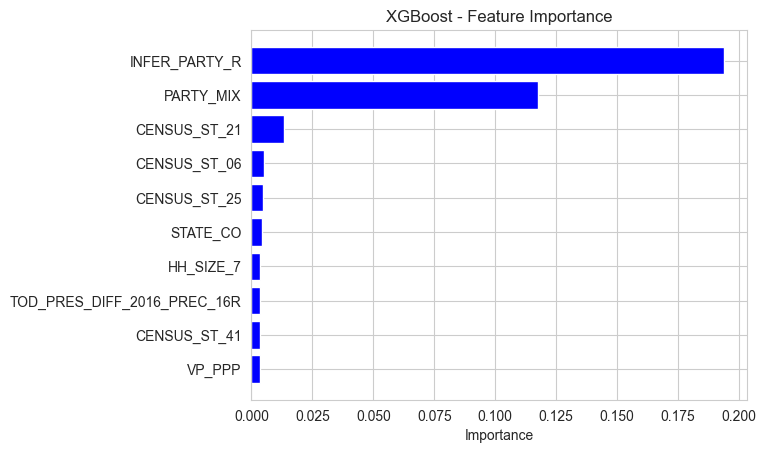

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 103.71 seconds to run.
Running ablation by excluding feature: VTR_TOTAL_VOTES
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


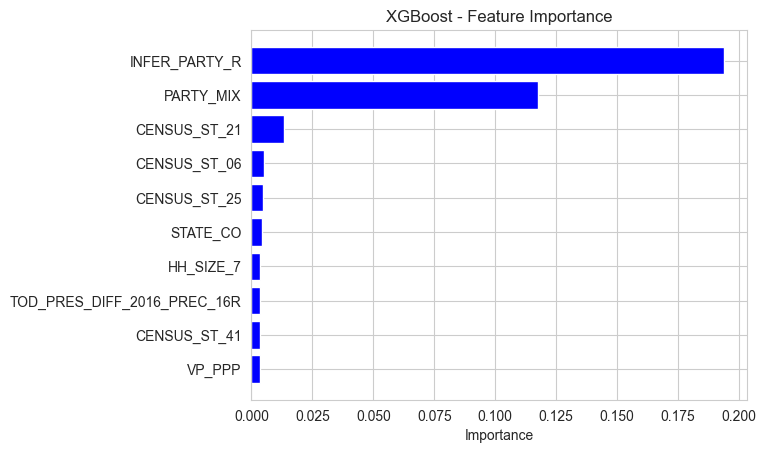

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 104.56 seconds to run.
Running ablation by excluding feature: VTR_INFER_SWING
Starting run 1...
number of columns in the dataset 213
Top 10 Important Features and Their Importances for Run 1: 
INFER_PARTY_R: 0.19376808404922485
PARTY_MIX: 0.11734721064567566
CENSUS_ST_21: 0.01346184965223074
CENSUS_ST_06: 0.005181673914194107
CENSUS_ST_25: 0.00459018861874938
STATE_CO: 0.004210767336189747
HH_SIZE_7: 0.0035129375755786896
TOD_PRES_DIFF_2016_PREC_16R: 0.0034951288253068924
CENSUS_ST_41: 0.003426182549446821
VP_PPP: 0.003315976820886135


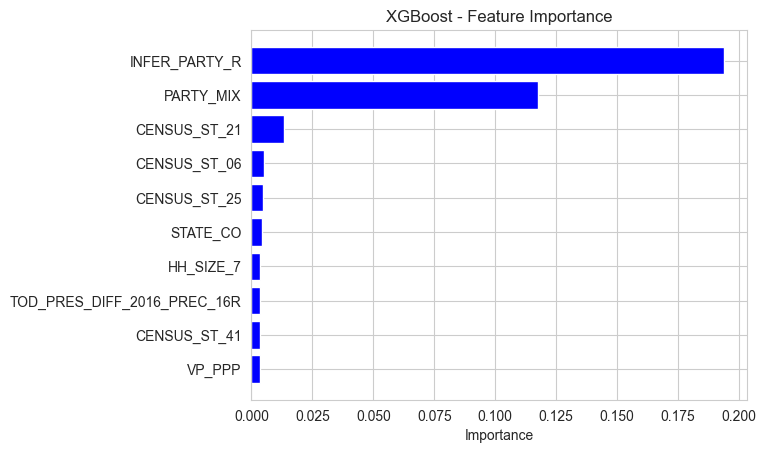

Run 1 - Accuracy: 0.9315, F1 Score: 0.9195589218789866, Recall: 0.9315
Function run_xgboost_all_columns took 115.70 seconds to run.
Function run_feature_ablation took 51279.96 seconds to run.


,Run,Accuracy,F1_Score,Recall,Top_N_Features,Excluded_Feature
0,1,0.9321,0.919778,0.9321,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",RECORD_ID
1,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",ADD_TYPE
2,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",AFAMPROFLS
3,1,0.9336,0.921655,0.9336,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",AGE
4,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",AI_COUNTY_NAME
...,...,...,...,...,...,...
207,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",WORKWOMAN
208,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",YEARBUILT
209,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",INFER_PARTY
210,1,0.9315,0.919559,0.9315,"[INFER_PARTY_R, PARTY_MIX, CENSUS_ST_21, CENSU...",VTR_TOTAL_VOTES


In [30]:
@timer_decorator
def run_feature_ablation(engineered_data, sample_size=50000, num_runs=1, top_N_features=10):
    ablation_results = []  # List to store the results

    all_columns = engineered_data.columns.tolist()
    all_columns.remove('PARTY_CODE')  # Remove the target variable

    for feature in all_columns:
        print(f"Running ablation by excluding feature: {feature}")
        result = run_xgboost_all_columns(engineered_data, sample_size=sample_size, num_runs=num_runs, top_N_features=top_N_features, exclude_features=[feature])
        
        # Assuming the first run's metrics are stored in result.iloc[0]
        metrics = result.iloc[0].to_dict()
        metrics['Excluded_Feature'] = feature  # Add the excluded feature to the metrics
        
        ablation_results.append(metrics)

    # Convert the list of results to a DataFrame
    ablation_results_df = pd.DataFrame(ablation_results)
    
    return ablation_results_df

# Run the feature ablation
ablation_results_df = run_feature_ablation(engineered_data, sample_size=50000, num_runs=1, top_N_features=10)
#ablation_results_df
# Save the DataFrame to a CSV file if you want
# ablation_results_df.to_csv("/path/to/save/ablation_results.csv", index=False)

In [32]:
ablation_results_df.to_csv('/Users/nirugidla/Downloads/ablation_results_df.csv', index=False)


In [10]:
ablation_results_df_copy = pd.read_csv("/Users/nirugidla/Downloads/ablation_results_df.csv")

In [11]:
# Sorting the DataFrame by 'Accuracy' to understand which feature removal has the greatest impact on accuracy
sorted_by_accuracy = ablation_results_df_copy.sort_values(by='Accuracy', ascending=False)

# Displaying the sorted DataFrame to show features with the greatest impact when removed
sorted_by_accuracy.head()

,Run,Accuracy,F1_Score,Recall,Top_N_Features,Excluded_Feature
140,1,0.9345,0.922281,0.9345,"['INFER_PARTY_R', 'PARTY_MIX', 'CENSUS_ST_21',...",PRFL_CHOICELIFE
196,1,0.9345,0.922215,0.9345,"['INFER_PARTY_R', 'PARTY_MIX', 'CENSUS_ST_21',...",TOD_PRES_R_2016
197,1,0.9340,0.921706,0.9340,"['INFER_PARTY_R', 'PARTY_MIX', 'CENSUS_ST_21',...",TOD_PRES_R_2016_PREC
188,1,0.9339,0.921792,0.9339,"['INFER_PARTY_R', 'PARTY_MIX', 'CENSUS_ST_21',...",TOD_PRES_D_2016_PREC
193,1,0.9338,0.921858,0.9338,"['INFER_PARTY_R', 'PARTY_MIX', 'CENSUS_ST_21',...",TOD_PRES_O_2016


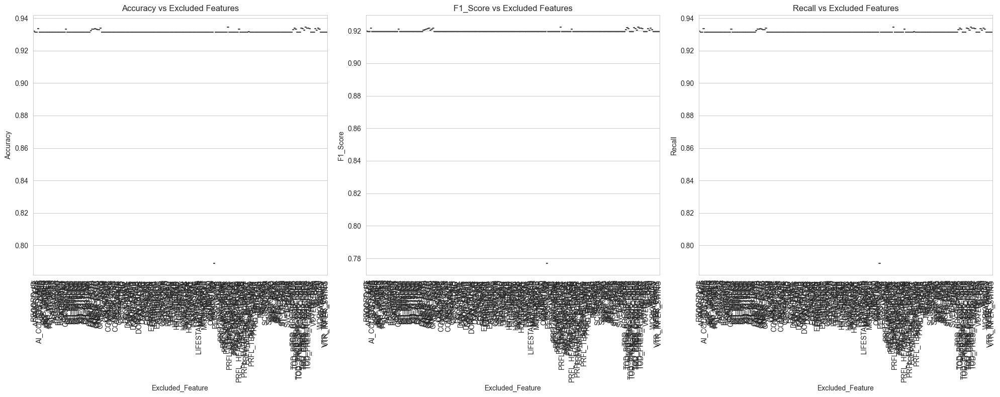

In [13]:
# Assuming ablation_results_df is already defined in your environment

# Sorting the DataFrame by 'Accuracy' to understand which feature removal has the greatest impact on accuracy
sorted_by_accuracy = ablation_results_df_copy.sort_values(by='Accuracy', ascending=False)

# Plotting the metrics as features are excluded
plt.figure(figsize=(20, 8))

# Creating subplots for each metric: Accuracy, F1 Score, and Recall
for idx, metric in enumerate(['Accuracy', 'F1_Score', 'Recall'], 1):
    plt.subplot(1, 3, idx)
    sns.boxplot(data=ablation_results_df_copy, x='Excluded_Feature', y=metric)
    plt.title(f"{metric} vs Excluded Features")
    plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

In [14]:
# Importing the Plotly library for interactive plots
# Creating subplots for each metric: Accuracy, F1 Score, and Recall
fig = px.box(ablation_results_df_copy.melt(id_vars='Excluded_Feature', value_vars=['Accuracy', 'F1_Score', 'Recall']),
             x='Excluded_Feature', y='value', color='variable',
             labels={'value': 'Metric Value', 'Excluded_Feature': 'Excluded Feature'},
             title='Metrics vs Excluded Features')

# Updating layout for better readability
fig.update_layout(
    xaxis_title='Excluded Features',
    yaxis_title='Metric Value',
    boxmode='group'  # group together boxes of the same type
)
fig.update_xaxes(categoryorder='total ascending')

fig.show()

In [16]:
import plotly.graph_objects as go

# Prepare data for plot
melted_df = ablation_results_df_copy.melt(id_vars='Excluded_Feature', value_vars=['Accuracy', 'F1_Score', 'Recall'])

# Create subplots
fig = go.Figure()

metrics = ['Accuracy', 'F1_Score', 'Recall']
colors = ['red', 'green', 'blue']

for metric, color in zip(metrics, colors):
    subset = melted_df[melted_df['variable'] == metric]
    fig.add_trace(go.Box(
        y=subset['value'],
        x=subset['Excluded_Feature'],
        name=metric,
        marker=dict(
            color=color,
            line=dict(
                width=2,
            )
        )
    ))

# Update layout
fig.update_layout(
    xaxis_title='Excluded Features',
    yaxis_title='Metric Value',
    title='Metrics vs Excluded Features',
    boxmode='group'
)
fig.update_xaxes(categoryorder='total ascending')

fig.show()


In [17]:
import plotly.express as px

# Assuming ablation_results_df_copy is the DataFrame you're working with
# Melt the DataFrame to make it suitable for line plots
melted_df = ablation_results_df_copy.melt(id_vars='Excluded_Feature', value_vars=['Accuracy', 'F1_Score', 'Recall'])

# Create the line plot
fig = px.line(melted_df, x='Excluded_Feature', y='value', color='variable', 
              labels={'value': 'Metric Value', 'Excluded_Feature': 'Excluded Feature'},
              title='Metrics vs Excluded Features')

# Update layout for better readability
fig.update_layout(
    xaxis_title='Excluded Features',
    yaxis_title='Metric Value'
)
fig.update_xaxes(categoryorder='total ascending')

fig.show()